# Coursework 2: Robotic behavioural cloning from images and actuator data

NB: Please do **not** discuss the Coursework in the forum or any other public medium. Please ask for clarifications directly during Lab Sessions or at any time via an email directed to the TA (Eric Wanjau: eric.muriithi.22@ucl.ac.uk; Radu-Stefan Popovici: radu.popovici.25@ucl.ac.uk) or module lead. The module lead and the TAs will respond either via email or via a public announcement to all students.

_You are required to submit 1 PDF report and 1 Python notebook. The PDF report should be a pdf version of the python notebook. Before converting to PDF ensure all cells are excuted and all outputs are visible._    

_This assignment is marked out of 100. A breakdown of how marks are allocated is included in the file._

The filename for submission must be in the following format:  

* _CandidateCode-CW2.pdf_  

* _CandidateCode-CW2.ipynb_  

and should be a completed version of the CW2_QUESTIONS.ipynb file.

In total, there should be 2 files in submission.

**Important: All group members must complete the "Group Work Contribution Form" below. This is a mandatory step. Penalties will be applied to groups where the form is incomplete or not accurately filled in. Please coordinate with your team to ensure this is done.**


---
---
<div style="background-color: #1b1f02ff; padding: 15px; border-radius: 5px; border-left: 4px solid #0b0104ff;">

## Group Work Contribution Form

**Group Number:** `[Insert Your Group Number Here, e.g., Group 3]`  


## 📋 Instructions for Completion

1. **Individual Responsibility:** Each member must complete their own row in the contribution table below
2. **Primary Ownership:** Each sub-question should be primarily solved by one member (though others may assist)
3. **No Overlap:** Each question number can only be associated with one primary contributor
4. **Be Specific:** Describe your contributions in detail - avoid vague statements like "helped with coding"
5. **Be Honest:** Provide an accurate assessment of your work


## 👥 Contribution Details

| Group Member | Student ID | Student Name | Question Numbers You Primarily Contribute | Other Specific Contributions (Maximum 100 words per member) |
|--------------|------------|--------------|-------------------------------------------|------------------------------------------------------------|
| **Member 1** | `[25156984]` | `[Rosy Lu]` | `[1.a, 1.b.i, 1.b.ii.i, 1.b.ii.ii, 1.b.ii.iii]` |  `• [• Took primary responsibility for implementing and revising Questions 1.a and 1.b (all sub-parts) across multiple versions • Conducted early-stage experiments on learning rate tuning to explore model performance (initial draft of 1.c.ii.i)]` |
| **Member 2** | `[19114719]` | `[Jiayi Chen]` | `[1.c.ii.i, 1.c.ii.ii]` | `• [Created and moderated the primary group communication channels, coordinated weekly meetings, discussed thoughts of model tuning with group members, discovered some model improvements and created visualisation figures for metrics, provided justification for model tuning]` |
| **Member 3** | `[24241918]` | `[Ales Ressler]` | `[2.a, 2.b]` | `• [I contributed to the coursework by helping plan the initial workflow, version control principles and splitting tasks clearly among team members. I also organized regular progress meetings to track progress, align on priorities, and resolve issues quickly. Additionally, I created and maintained the Q2 timeline with key milestones and deadlines. On the technical side, I ran extensive experiments with different VAE architectures, comparing their performance, training feasibility and performed convergence assessment. Also created image reconstruction plots.]` |
| **Member 4** | `[25127116]` | `[Zain Nomani]` | `[1.c.i, 1.c.i.iii]` | `• [Organised and maintained the GitHub repository, managing branch structures, version control and merge resolution to ensure smooth team collaboration. Conducted extensive experimental work on model tuning for Q1c, including systematic hyperparameter exploration and performance analysis. Synthesised results from my own experiments and other group members’ to decide on a final model configuration. Modularised code from various sections, for re-use across multiple questions. Helped to brainstorm with Rosy for 1a.]` |
| **Member 5** | `[25137483]` | `[Harry Fyjis-Walker]` | `[2.c, 3a, 3.b.i, 3.b.ii]` | `• [Aside from Q2c and Q3, which I worked independently on, and alongside helping with planning initial approach and setting internal deadlines, I worked alongside Ales in testing VAE models in 2.a. We decided to build models independently and then compare initial performance; my model, based on residual blocks, exhibited worse reconstruction performance so Ales then focused on using his model for 2a and b. I also supported Zain and Jiayi in 1c by building an initial model for testing the effect of dropout and layer normalisation. Zain and I then worked together to ensure the whole code ran smoothly when merging branches, performing any necessary debugging.]` |


## 📊 Question Number Reference

### Available Questions for Primary Contribution:
**Question 1**  
• 1.a  
• 1.b.i  
• 1.b.ii.i  
• 1.b.ii.ii  
• 1.b.ii.iii  
• 1.c.i  
• 1.c.ii.i  
• 1.c.ii.ii  

**Question 2**  
• 2.a  
• 2.b  
• 2.c  

**Question 3**  
• 3.a  
• 3.b.i  
• 3.b.ii  


## ✅ Group Declaration

We confirm that:

- We have read and understood the contribution descriptions above
- We believe this to be a fair and accurate representation of work distribution
- Each question has one primary contributor as indicated
- All members have contributed significantly to the final submitted work


## 💡 Notes

- Ensure question numbers are correctly formatted (e.g., "1.a", "1.b.ii.i")
- Keep contribution descriptions concise but specific (max 100 words per member)
- Contact your instructor if there are any concerns about contribution fairness

</div>

---  

---  

## Description
For this coursework, you are required to develop a behaviour cloning model. Behaviour cloning is a technique for training robotic agents using a dataset of sequences of actions. Consider the supervised learning definition where we have a dataset of observatios $d=\{(x_{1},y_{1}),...,(x_{n},y_{n})\}$ and the aim is to learn a function: $f:\mathcal{X}\rightarrow\mathcal{Y}$. In this case, $\mathcal{X}$ is the set of "observations" that the robot makes and $\mathcal{Y}$ is the set of actions that the robot takes.

The dataset you have been provided with contains examples of robot arms being required to pickup objects or drop objects (given it has already picked the object up) in a specific place. The observation space ($\mathcal{X}$) consists of:
- "front_cam_ob": A 3rd person image of the scene
- "mount_cam_ob": An image of the scene taken from a camera mounted on top of the robotic arm, looking down
- "ee_cartesian_pos_ob": The positional and orientation co-ordinates of the robotic arm
- "ee_cartesian_vel_ob": The velocity of position and orientation of the robotic arm
- "joint_pos_ob": The position of the gripper which opens and closes

The action space ($\mathcal{Y}$) consists of:
- Three co-ordinates defining how much to move the robotic arm
- An action defining whether to open, not to move or close the gripper

The dataset is split into "trajectories" i.e., sequences of:
- $x_{i}$: The front_cam_ob, mount_cam_ob, ee_cartesian_pos_ob, ee_cartesian_vel_ob, joint_pos_ob __at time point i__
- $y_{i}$: The action taken i.e., how to move the arm and the gripper __given the observations__ in $x_{i}$

More information on the dataset can be found at: https://github.com/clvrai/clvr_jaco_play_dataset?tab=readme-ov-file

### Task
Your task has been split into several questions, each exploring how to develop an appropriate model for learning $f:\mathcal{X}\rightarrow\mathcal{Y}$. The task will require you to:
- Question 1: Tune an end-to-end supervised learning model taking in the full set of observations and predicting actions: You will be required to evaluate a proposed deep learning architecture (which takes as input all of front_cam_ob, mount_cam_ob, ee_cartesian_pos_ob, ee_cartesian_vel_ob and joint_pos_ob and predict the two actions) and propose a new model which outperforms the existing model;
- Question 2: Define and evaluate a VAE model for performing self-supervised learning and tune it as best you can, to learn a latent representation that can be used as input to a downstream supervised model for behaviour cloning
- Question 3: Evaluate the performance of your model proposed in question 1 against your self-supervised VAE representations from question 2 (plus a supervised head) on the test set

### Pointers
Some helper functions have been provided for you including the following functionality:
- A training and validation loop capabale of:
  - Handling "half-precision" modelling;
  - Logging results to weights and biases;
- An eda template to help you visualise the data
- An evaluation template to help you load saved model checkpoints from weights and biases
- A preprocessing script to help you convert the data into train/validation and test splits;
  - In this preprocessing script, trajectories longer than 75 timesteps have been removed to ease the computational requirements of the task;
- A torch Dataset class capable of handling the multi-model nature of the data;
- A example collate_fn to use in Dataloaders

Additionally, it is strongly suggested to call ```torch.manual_seed(1)``` whenever you initialise your model (i.e., when you first create the model or call model.reset()). This will ensure the parameters are initialised at the same value each time.

### IMPORTANT
- You are __not__ allowed to use pre-trained models, developed outside of this coursework i.e., you could __not__ use a pre-trained YOLO model
- Questions have been marked under the title "Task", ensure that you answer/address all of the bullet points under these headings
- Pls add proper citations or references where necessary in your justification
- You can use markdown language to add formatting to your text. A cheatsheet is found [here](https://github.com/adam-p/markdown-here/wiki/Markdown-Cheatsheet)
- The completed assignment jupyter notebook (With Python code and English Text) should have all the output cells been executed and solution outputs are visible

## Data download
Download the data for the project from here: https://drive.google.com/file/d/1ss_1RZZzov2SdJsYI_mRTpo6VBMRK43O/view?usp=sharing

Save and unzip the data locally at: ../data/all_play_data_diverse or in Google Collab at: /content/drive/MyDrive/comp0188_2425/cw2. Saving the data in these locations will ensure the proprocessing script provided runs correctly. If you would like to alter these locations, you can alter them in the config.py file of the provided comp0188_cw2 package via the ROOT_PATH global variable.

### transition_df.csv
You have additionally been provided with a csv called "transition_df.csv". This contains a row for each observation/action pair in the dataset and is used to generate the train/validation and test datasets for this task. Note that this csv contains all trajectories (even those over 75 timesteps). This csv might also be useful for EDA. The transition_df.csv should be placed in the same folder that you placed the raw data in (discussed above).

## Imports

The comp0188_cw2 contains some config functionality so that you can run the code in collab and locally (to test models)! When you first import the package, import the project_options and set the appropriate configs.
- project_options.collab = True will set the dataset directories for google collab whilst false will set suitable local directories
- project_options.debug = True will load a subset of data whilst False will load all of the data.

__IMPORTANT__: Alterting these options __once you have loaded other functionality__ from comp0188_cw2 may result in unintended outcomes.

In [ ]:
COLLAB = True
if COLLAB:
    from google.colab import drive
    drive.mount('/content/drive')
    !pip install --force-reinstall git+https://github.com/joshuaspear/pymlrf.git
    !pip install wandb
    !pip install torchinfo
    !pip install jaxtyping
    !pip install git+https://github.com/joshuaspear/comp0188_cw2_public.git
    !pip install typeguard==2.13.3

Mounted at /content/drive
  Cloning https://github.com/joshuaspear/pymlrf.git to /tmp/pip-req-build-39x1s1mj
  Running command git clone --filter=blob:none --quiet https://github.com/joshuaspear/pymlrf.git /tmp/pip-req-build-39x1s1mj
  Resolved https://github.com/joshuaspear/pymlrf.git to commit 13f5c1cbad249ec6d5a6cd356612c874ae68bb53
  Preparing metadata (setup.py) ... done
  Created wheel for pymlrf: filename=pymlrf-1.0.0-py3-none-any.whl size=23646 sha256=f2b113a03303d9030a76852782005fd747407cef32764d033aaa2bcdac340758
  Stored in directory: /tmp/pip-ephem-wheel-cache-9elx8k70/wheels/f1/cb/97/454b1a9071448b027d0faecba7b7e6ae819354c83df4e7e70e
Successfully built pymlrf
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 4.4 MB/s eta 0:00:00
  Cloning https://github.com/joshuaspear/comp0188_cw2_public.git to /tmp/pip-req-build-z9obolsu
  Running command git clone --filter=blob:none --quiet https://github.com/joshuaspear/comp0188_cw2_public.git /tmp/pip-req-build-z9obolsu
  Resol

Ignore the error:
```ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.inflect 7.4.0 requires typeguard>=4.0.1, but you have typeguard 2.13.3 which is incompatible.```

In [ ]:
from comp0188_cw2 import project_options
project_options.collab = COLLAB
print(project_options.collab)
project_options.debug = False
print(project_options.debug)

True
False


In [ ]:
import torch
import numpy as np
import torch.nn as nn
from torchvision import transforms
from torch.utils.data import DataLoader
import datetime
from pymlrf.Structs.torch import DatasetOutput
import copy

from comp0188_cw2.utils import load_all_files
from torchvision import transforms
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import datetime
from typing import List
from pymlrf.Structs.torch import DatasetOutput

from comp0188_cw2.config import (
    train_dh, val_dh, test_dh, WANDB_PROJECT
    )
from comp0188_cw2.models.CNNConfig import ConvolutionLayersConfig
from comp0188_cw2.models.base import BaseModel
from comp0188_cw2.models.JointCNNEncoder import JointCNNEncoder
from comp0188_cw2.models.CNN import CNN
from comp0188_cw2.models.MLP import MLP
from comp0188_cw2.Metric.WandBMetricOrchestrator import WandBMetricOrchestrator
from comp0188_cw2.Dataset.NpDictDataset import NpDictDataset
from comp0188_cw2.Loss.BalancedLoss import TrackerBalancedLoss
from comp0188_cw2 import logger
from comp0188_cw2.training.TrainingLoop import TorchTrainingLoop

2026-01-16 09:54:41,623 - pymlrf - WARNING - pymlrf environment variable not set. Logging to file will not be performed (__init__.py:50)


In [ ]:
print(train_dh.loc)

/content/drive/MyDrive/comp0188_2425/cw2/train


## Build the dataset
You will only need to perform this step __once__ for the full dataset and __once__ for the debug dataset for the entire coursework, both locally and in Google collab. In Google Collab, the data will be saved in your Google Drive.

In [ ]:
from comp0188_cw2.Preprocessing import main
RUN_PREPROCESSING = False
if RUN_PREPROCESSING:
  main()

---


## $\color{Red}{Question\ 1}:$ Tune an end-to-end supervised learning model taking in the full set of observations and predicting actions

In [ ]:
_keys = [
    "actions","front_cam_ob",
    "mount_cam_ob","terminals",
    "ee_cartesian_pos_ob",
    "ee_cartesian_vel_ob",
    "joint_pos_ob"
    ]
train_nps = load_all_files(train_dh.loc,"train_[0-9]+.h5",keys=_keys)
val_nps = load_all_files(val_dh.loc,"val_[0-9]+.h5",keys=_keys)

100%|██████████| 5/5 [00:14<00:00,  2.91s/it]


### $\color{Red}{Question\ 1.a}$ Preprocessing steps and Justification (5 Marks)
Most likely in machine learning pipelines, input data needs to be preprocessed before passing it to the model. This question requires you to specify the preprocessing that you will perform for the different types of data i.e., front_cam_ob, mount_cam_ob, ee_cartesian_pos_ob, ee_cartesian_vel_ob and joint_pos_ob. The dataset class provided in the associated "comp0188_cw2" package enables you to pass a dictionary of functions to preprocess each element of the observations and actions. The class expects a dictionary of transformations to apply to each input/output.

##### $\color{Red}{Task-1}$ (2 Marks)
- Complete the dictionaries below, specifying the type of transformations you wish to perform. For each element (of the observations and actions), you should __at least__ convert the output to a tensor thus, these transformations have been implemented for you. You may alter __any__ part of the code between the "INSERT YOUR CODE HERE" comments

$\color{red}{Response:}$ (Maximum 50 words in text)  
* Visual observations are converted to float32 tensors and scaled to [0,1] for stable CNN training.
* Proprioceptive states are standardised using training-set statistics to handle differing scales.
* Continuous actions are represented as float tensors, while the discrete gripper action is encoded separately to preserve its categorical nature.


In [ ]:
print(train_nps["front_cam_ob"][0])

[[ 33.62  32.75  32.75 ...  21.03  21.03  20.73]
 [ 33.75  32.56  32.25 ...  21.42  21.03  20.42]
 [ 33.38  32.38  32.1  ...  21.42  21.03  21.03]
 ...
 [161.4  165.9  173.5  ... 143.6  142.6  137.6 ]
 [159.4  173.4  173.4  ... 142.9  138.6  139.4 ]
 [164.4  173.4  173.8  ... 140.9  136.4  140.6 ]]


In [ ]:
# ******* INSERT YOUR CODE HERE *******
global_transforms = {
    "front_cam_ob": transforms.Compose([
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x.to(torch.float32)),
        transforms.Lambda(lambda x: x / 255.0)
    ]),
    "mount_cam_ob": transforms.Compose([
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x.to(torch.float32)),
        transforms.Lambda(lambda x: x / 255.0)
    ]),

    "actions": lambda x: torch.cat([
        torch.tensor(x[0:3], dtype=torch.float32),
        torch.tensor([int(x[-1])], dtype=torch.long)
    ]),

    "ee_cartesian_pos_ob": lambda x: (torch.from_numpy(x.astype(np.float32)) -
                                      torch.from_numpy(train_nps['ee_cartesian_pos_ob']).mean(0)) /
                                      torch.from_numpy(train_nps['ee_cartesian_pos_ob']).std(0),
    "ee_cartesian_vel_ob": lambda x: (torch.from_numpy(x.astype(np.float32)) -
                                      torch.from_numpy(train_nps['ee_cartesian_vel_ob']).mean(0)) /
                                      torch.from_numpy(train_nps['ee_cartesian_vel_ob']).std(0),
    "joint_pos_ob": lambda x: (torch.from_numpy(x.astype(np.float32)) -
                               torch.from_numpy(train_nps['joint_pos_ob']).mean(0)) /
                               torch.from_numpy(train_nps['joint_pos_ob']).std(0)
}

# ******* INSERT YOUR CODE HERE - END *******

---

##### $\color{Red}{Task-2}$ (3 Marks)
- For the below variables, justify your decisions for preprocessing including where you have decided __not__ to apply preprocessing. You should include empirical evidence from your EDA analysis to support your decisions. Justfication __without__ evidence will be rewarded 0 marks.

_actions_


_front_cam_ob_


_mount_cam_ob_


_ee_cartesian_pos_ob_


_ee_cartesian_vel_ob_


_joint_pos_ob_

$\color{red}{Response:}$ (Maximum 600 words in text)

**1.⁠ ⁠Visual Observations (⁠ front_cam_ob ⁠, ⁠ mount_cam_ob ⁠):**
  
  •⁠ _⁠Empirical Evidence:_  
  EDA shows that both image modalities are stored as float16 tensors with spatial resolution (224, 224). Pixel intensities range approximately from [0.3, 250.4] for front_cam_ob and [1.17, 254.75] for mount_cam_ob.

  •⁠  _⁠Decision:_  
  Convert images to float32 tensors and normalise by dividing by 255.0.

  •⁠  _⁠Justification:_  
  Although the images are not stored as ⁠ uint8 ⁠, their dynamic range closely matches standard 8-bit images. Explicit normalisation to the [0,1] range ensures numerical stability and prevents large activations in early convolutional layers. Casting to float32 further avoids precision issues during backpropagation.

**2.⁠ ⁠Proprioceptive State Vectors (⁠ ee_cartesian_pos_ob ⁠, ⁠ joint_pos_ob ⁠):**
  
  •⁠  _⁠Empirical Evidence:_  
  Cartesian end-effector positions span approximately [-0.664, 0.998] across seven dimensions. Joint positions lie in a narrower but asymmetric range of [-0.001, 1.412]. While these values are bounded, their scales and variances differ across dimensions.
  
  •⁠  ⁠_Decision:_  
  Standardise each variable using z-score normalisation based on training-set statistics.
  
  •⁠  _⁠Justification:_  
  Standardisation ensures that all state dimensions contribute comparably during optimisation, preventing features with larger variance from dominating gradient updates. Using statistics computed from the training split and applying them consistently across validation and test sets avoids data leakage while improving convergence stability.

**3.⁠ ⁠Dynamic Variables (⁠ ee_cartesian_vel_ob ⁠, ⁠ actions ⁠):**
  
  •⁠  _⁠Empirical Evidence:_  
  End-effector Cartesian velocities exhibit a substantially wider range than positions, spanning approximately [-11.88, 12.25]. This indicates higher variance and the presence of occasional large-magnitude motions. Action vectors consist of three continuous Cartesian deltas and one gripper command, with values in [-0.2, 2.0]. The gripper channel takes on a small set of discrete values and exhibits class imbalance.
  
  •⁠  _⁠Decision:_  
  Apply z-score normalisation to velocity inputs using training-set statistics. Encode continuous and discrete action components separately, without normalising the categorical gripper action.
  
  •⁠  _⁠Justification:_  
  Velocity dimensions exhibit substantially larger variance and wider dynamic range than positional inputs, and therefore benefit from standardisation to ensure balanced gradient scales relative to other proprioceptive features. The discrete gripper command represents a categorical control signal; therefore, normalisation is inappropriate and would distort class semantics. Separating continuous and discrete components supports stable regression and classification objectives.

**4.⁠ ⁠Datatype Policy:**
  
  •⁠  _⁠Decision:_  
  All ⁠ float16 ⁠ inputs are converted to ⁠ float32 ⁠ during preprocessing.
  
  •⁠  _⁠Justification:_  
  While float16 reduces memory usage, its limited precision can lead to numerical instability during gradient computation. Empirical testing revealed unstable (NaN) losses under FP16 training. Converting all inputs to float32 provides sufficient numerical headroom for stable optimisation across both regression and classification losses.

In [ ]:
# Pls use this code cell to excute the code to generate your emprical evidence to support your textual response above
# ******* INSERT YOUR CODE HERE *******
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
keys_to_check = [
    "actions",
    "front_cam_ob",
    "mount_cam_ob",
    "ee_cartesian_pos_ob",
    "ee_cartesian_vel_ob",
    "joint_pos_ob"
]
# get values for each key via train_nps[key]
print(f"{'Variable Name':<25} | {'Dtype':<10} | {'Shape':<18} | {'Min':<8} | {'Max':<8}")
print("-" * 80)

for key in keys_to_check:
    if key in train_nps:
        data = train_nps[key]
        print(f"{key:<25} | {str(data.dtype):<10} | {str(data.shape):<18} | {np.min(data):.3f} | {np.max(data):.3f}")
    else:
        print(f"{key:<25} | {'MISSING':<10} | {'N/A':<18} | {'N/A':<8} | {'N/A':<8}")
print("")
velocity = train_nps["ee_cartesian_vel_ob"]
position = train_nps["ee_cartesian_pos_ob"]
joint = train_nps["joint_pos_ob"]
actions = train_nps["actions"]
action_coords = actions[:,:3]
action_grp = actions[:,3:][:,0].astype(np.float32)
velocities = np.linalg.norm(velocity, axis=-1).astype(np.float32) # .flatten() # convert to single vector
#

# class imbalance
classes, counts = np.unique(train_nps.get("actions")[:,3], return_counts = True)
# ******* INSERT YOUR CODE HERE - END *******

Variable Name             | Dtype      | Shape              | Min      | Max     
--------------------------------------------------------------------------------
actions                   | float16    | (25469, 4)         | -0.200 | 2.000
front_cam_ob              | float16    | (25469, 224, 224)  | 0.299 | 250.375
mount_cam_ob              | float16    | (25469, 224, 224)  | 1.174 | 254.750
ee_cartesian_pos_ob       | float16    | (25469, 7)         | -0.664 | 0.998
ee_cartesian_vel_ob       | float16    | (25469, 6)         | -11.883 | 12.250
joint_pos_ob              | float16    | (25469, 2)         | -0.001 | 1.412



---

### $\color{Red}{Question\ 1.b}$  End-to-end supervised model evaluation
The code below defines an end to end supervised model which:
- Jointly encodes the two images ("front_cam_ob", "mount_cam_ob") using a CNN architecture (image_encoder);
- Seperately encoding the positional and velocity observations using an MLP;
- Combines the two embeddings by adding them together and;
- Passes the combined embedding into a final MLP layer (dense)
  
This question requires you to define sutable loss functions for the model and then evaluate the performance.

In [ ]:
cnn2_config = ConvolutionLayersConfig(
    input_dim=224,
    input_channels=2,
    layers=[
        nn.Conv2d(
            in_channels=2,
            out_channels=8,
            kernel_size=(3,3),
            stride=1,
            padding=1,
            dilation=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=8,
            out_channels=16,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=16,
            out_channels=32,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2))
        ]
    )

_cnn_output_dim = cnn2_config.get_output_dims()
_cnn_output_channels = cnn2_config.get_output_channels()
_mlp_input_dim = int(
            (_cnn_output_dim[-1]*_cnn_output_dim[-1])*_cnn_output_channels[-1]
            )


image_encoder = JointCNNEncoder(
    cnn=CNN(cnn2_config),
    dense=MLP(
        input_dim=_mlp_input_dim,
        hidden_dims=[256],
        output_dim=128
        )
)

obs_encoder = MLP(
    input_dim = 15,
    hidden_dims = [256,256],
    output_dim = 128
)

dense = MLP(
    input_dim = 128,
    hidden_dims = [64,32],
    output_dim = 6
)

class Baseline1(BaseModel):
  def __init__(
      self,
      image_encoder:JointCNNEncoder,
      obs_encoder:MLP,
      dense:MLP
      ) -> None:
      super().__init__()
      self.image_encoder = image_encoder
      self.obs_encoder = obs_encoder
      self.dense = dense

  def forward(self, images, obs):
    _img_enc = self.image_encoder(images)
    _obs_enc = self.obs_encoder(obs)
    _dense_enc = self.dense(_img_enc+_obs_enc)
    _dense_enc = _dense_enc * 0.05 # PERSONAL BUG FIX: scale logits to prevent overflow with float16
    pos = _dense_enc[:,0:3]
    grp = _dense_enc[:,3:]
    return {
        "pos": pos,
        "grp":grp
        }
  def reset(
      self,
      image_encoder_kwargs,
      obs_encoder_kwargs,
      dense_kwargs
      ):
    self.image_encoder.reset(**image_encoder_kwargs)
    self.obs_encoder.reset(**obs_encoder_kwargs)
    self.dense.reset(**dense_kwargs)

torch.manual_seed(42)
model = Baseline1(
    image_encoder=image_encoder,
    obs_encoder=obs_encoder,
    dense=dense
)

#### $\color{Red}{Question\ 1.b.i}$ Loss definitions (3 marks)
For the model defined above, the proposed loss function is defined where the contribution of "pos_criterion" and "grp_criterion" are equally weighted and the mean of the two values loss are used to define the final loss. Furthermore, the loss for the positional actions is the MSE and the loss for grp_criterion is the CrossEntropyLoss.

##### Task:
- Justify why this composite loss function is reasonable. You should make reference to the range of values predicted by the deep learning model.

$\color{red}{Response:}$ (Maximum 250 words in text)

The proposed loss function combines the positional `pos` and gripper action `grp` outputs by taking the mean of their respective losses, giving equal weight to both.  

The positional output represents continuous values corresponding to the robot's end-effector positions. From the first batch, the observed positional values range approximately between 0.0 and 1.5. Using Mean Squared Error (MSE) for these predictions is appropriate because it penalizes deviations from the ground truth proportionally and encourages precise regression of spatial coordinates.  

The gripper action output represents a discrete categorical variable corresponding to mutually exclusive actions (e.g., gripper states), with values taking class indices. CrossEntropyLoss is suitable here because it measures the difference between predicted logits and true class labels, directly optimizing the probability distribution over classes. Combining the two losses by averaging ensures that neither task dominates the gradient signal, maintaining a balance between accurate spatial regression and correct categorical action prediction.  

Empirically, the first batch forward pass confirms that the predicted positional outputs are within a reasonable range and that logits for gripper actions are of moderate magnitude, ensuring that both MSE and CrossEntropyLoss operate on numerically stable values. Equal weighting is justified since the ranges of the two outputs are roughly comparable in scale, preventing one term from disproportionately influencing the total loss. This composite loss thus allows the model to learn both continuous and discrete outputs simultaneously in a stable and balanced manner.


In [ ]:

pos_criterion = nn.MSELoss(reduction="mean")
grp_criterion = nn.CrossEntropyLoss(reduction="mean")

In [ ]:
torch.manual_seed(42)
model.reset({},{},{})
exp_kwargs = {
    "batch_size": 64,
    "learning_rate": 0.001,
    "half_precision": True,
    "target_offset": 0
}

if project_options.debug:
    exp_kwargs["batch_size"] = 4

if exp_kwargs["half_precision"]:
    train_dataset = NpDictDataset(
        array_dict=train_nps,
        transform_lkp = global_transforms,
        dep_vars = ["actions"],
        indep_vars = [
            "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
            "ee_cartesian_vel_ob", "joint_pos_ob"
            ],
        target_offset=exp_kwargs["target_offset"]
        )

    val_dataset = NpDictDataset(
        array_dict=val_nps,
        transform_lkp = global_transforms,
        dep_vars = ["actions"],
        indep_vars = [
            "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
            "ee_cartesian_vel_ob", "joint_pos_ob"
            ],
        target_offset=exp_kwargs["target_offset"]
        )
else:
    train_dataset = NpDictDataset(
        array_dict={k:train_nps[k].astype(np.float32) for k in train_nps},
        transform_lkp = global_transforms,
        dep_vars = ["actions"],
        indep_vars = [
            "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
            "ee_cartesian_vel_ob", "joint_pos_ob"
            ],
        target_offset=exp_kwargs["target_offset"]
        )

    val_dataset = NpDictDataset(
        array_dict={k:val_nps[k].astype(np.float32) for k in val_nps},
        transform_lkp = global_transforms,
        dep_vars = ["actions"],
        indep_vars = [
            "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
            "ee_cartesian_vel_ob", "joint_pos_ob"
            ],
        target_offset=exp_kwargs["target_offset"]
        )

print(len(train_dataset))
out = train_dataset[0]

def collate_func(input_list:List[DatasetOutput])->DatasetOutput:
    pos = []
    _grp = []
    images = []
    obs = []
    for val in input_list:
        images.append(
            torch.concat(
                [val.input["front_cam_ob"], val.input["mount_cam_ob"]],
                dim=0
            )[None,:]
            )
        obs.append(
            torch.concat(
                [
                    val.input["ee_cartesian_pos_ob"],
                    val.input["ee_cartesian_vel_ob"],
                    val.input["joint_pos_ob"]
                    ],
                dim=0
            )[None,:]
        )
        pos.append(val.output["actions"][0:3][None,:])
        _grp.append(val.output["actions"][-1:][None])
    # code below modified to fix bugs
    _grp = torch.concat(_grp, dim=0)
    grp = torch.zeros(_grp.shape[0],3)
    grp[torch.arange(len(grp)), _grp.squeeze().int()] = 1
    # grp = torch.argmax(grp, dim=1)
    # grp = torch.concat(_grp, dim=0).squeeze().long()
    return DatasetOutput(
        input = {
            "images":torch.concat(images,dim=0),
            "obs":torch.concat(obs,dim=0),
            },
        output = {
            "pos":torch.concat(pos, dim=0),
            "grp":grp
            }
    )

train_dataloader = DataLoader(
    train_dataset,
    batch_size=exp_kwargs["batch_size"],
    shuffle=True,
    collate_fn=collate_func,
)
val_dataloader = DataLoader(
    val_dataset,
    batch_size=exp_kwargs["batch_size"],
    shuffle=False,
    collate_fn=collate_func,
)

first_batch = next(train_dataloader.__iter__())

input_dim = first_batch.input["images"].shape
print(input_dim)
input_dim = first_batch.input["obs"].shape
print(input_dim)
pos_dim = first_batch.output["pos"].shape
print(pos_dim)
grp_dim = first_batch.output["grp"].shape
print(grp_dim)

exp_kwargs["model_def"] = model.__repr__()


if exp_kwargs["half_precision"]:
    model = model.half()
optimizer = torch.optim.Adam(
    model.parameters(), lr=exp_kwargs["learning_rate"],
    eps=1e-04
    )

__criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":pos_criterion,
        "grp": grp_criterion
    }
    )

if exp_kwargs["half_precision"]:
    with torch.no_grad():
        if torch.cuda.is_available():
            model = model.cuda()
            with torch.autocast(device_type="cuda"):
                res = model(
                    images=first_batch.input["images"].cuda(),
                    obs=first_batch.input["obs"].cuda()
                    )
                first_batch.output["pos"] = first_batch.output["pos"].cuda()
                first_batch.output["grp"] = first_batch.output["grp"].cuda()
        else:
            with torch.autocast(device_type="cpu"):
                res = model(
                    images=first_batch.input["images"],
                    obs=first_batch.input["obs"]
                    )
else:
    with torch.no_grad():
        if torch.cuda.is_available():
            model = model.cuda()
            res = model(
                images=first_batch.input["images"].cuda(),
                obs=first_batch.input["obs"].cuda()
                )
            first_batch.output["pos"] = first_batch.output["pos"].cuda()
            first_batch.output["grp"] = first_batch.output["grp"].cuda()
        else:
            res = model(
                images=first_batch.input["images"],
                obs=first_batch.input["obs"]
                )
print(__criterion(res,first_batch.output))


25469
torch.Size([64, 2, 224, 224])
torch.Size([64, 15])
torch.Size([64, 3])
torch.Size([64, 3])
tensor(1.1082, device='cuda:0')


In [ ]:
torch.manual_seed(42)
mo = WandBMetricOrchestrator()

train_criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":copy.deepcopy(pos_criterion),
        "grp":copy.deepcopy(grp_criterion)
    },
    name="train",
    mo=mo
    )

val_criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":copy.deepcopy(pos_criterion),
        "grp":copy.deepcopy(grp_criterion)
    },
    name="val",
    mo=mo
    )

sl_trainer = TorchTrainingLoop(
    model=model, gpu=True, optimizer=optimizer, criterion=train_criterion,
    val_criterion=val_criterion, epochs=10, logger=logger,
    mo=WandBMetricOrchestrator(), half_precision=exp_kwargs["half_precision"],
    preds_save_type=None # "csv", output_dir="results/baseline_preds"
)

wandb_name = "End_to_end_1"
wandb_grp="End_to_end"

if project_options.debug:
    wandb_name = f"{wandb_name}_DEBUG"


orig = datetime.datetime.now()
# import pdb; pdb.set_trace()
sl_trainer.training_loop(
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    wandb_proj=WANDB_PROJECT,
    wandb_grp=wandb_grp,
    wandb_config=exp_kwargs,
    wandb_name=wandb_name,
    reset_kwargs={
        "image_encoder_kwargs": {},
        "obs_encoder_kwargs": {},
        "dense_kwargs": {}
        }
    )

post_train = datetime.datetime.now()

/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice:

 2


wandb: You chose 'Use an existing W&B account'
wandb: Logging into https://api.wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: Find your API key here: https://wandb.ai/authorize?ref=models
wandb: Paste an API key from your profile and hit enter:

 ··········


wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: nomani-zain (nomani-zain-n-a) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


INFO:cw2_logger:Running epochs: 10
INFO:cw2_logger:Running training epoch
100%|██████████| 398/398 [01:02<00:00,  6.36it/s]
INFO:cw2_logger:epoch 1	 training loss : 2.041015625
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 1	 validation loss : 0.62548828125 
INFO:cw2_logger:Running training epoch
100%|██████████| 398/398 [01:01<00:00,  6.44it/s]
INFO:cw2_logger:epoch 2	 training loss : 0.5830078125
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 2	 validation loss : 0.59228515625 
INFO:cw2_logger:Running training epoch
100%|██████████| 398/398 [01:02<00:00,  6.39it/s]
INFO:cw2_logger:epoch 3	 training loss : 0.53759765625
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 3	 validation loss : 0.623046875 
INFO:cw2_logger:Running training epoch
100%|██████████| 398/398 [01:02<00:00,  6.34it/s]
INFO:cw2_logger:epoch 4	 training loss : 0.48681640625
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 4	 validation loss : 0.55029296875 
INFO:cw2_logger:Runnin

epoch_train_loss,█▂▂▂▂▂▁▁▁▁
epoch_val_loss,▃▂▃▁▃▄▄▇██
grp_train_loss,█▅▅▃▄▅▃▅▄▄▄▃▄▄▄▃▃▃▃▃▃▂▂▄▂▂▂▂▁▁▃▂▂▁▁▁▁▂▂▂
grp_val_loss,▂▃▃▃▄▄▃▃▃▂▅▄▃▃▅▄▂▃▂▁▅▅▂▄▂▂▆▆▄▂▅▇▁▆▁▄▂█▁▆
pos_train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
pos_val_loss,▃▅▃▃▂▂▃▂▅▄▂▄▄██▅▃▃▅▃▇▆▂▅▄▂▆▃▃▄▁▃▁▅▁▂▁▅▃▃
epoch_train_loss,0.23267
epoch_val_loss,0.8877
grp_train_loss,0.20005
grp_val_loss,1.21627
pos_train_loss,0.00135


---
#### $\color{Red}{Question\ 1.b.ii}$ Model evaluation (marks broken down in sub questions)
This question requires you to evaluate the performance of the model by analyzing both overall metrics and specific failure patterns. Run the cells above which will train the model for 10 epochs.

**IMPORTANT, for questions (1.b.ii.i, 1.b.ii.ii, 1.b.ii.iii):**
- You are **not** expected to train a baseline model and will be awarded **0 marks** for doing so
- **Incorrect interpretations of metrics** will be **negatively penalised**
- Where you are asked for empirical evidence but provide none, you will be awarded **0 marks**

#### $\color{Red}{Question\ 1.b.ii.i}$ Epoch selection (3 marks)
##### Task
- Select an appropriate epoch using a suitable method and provide **empirical evidence** for your choice

$\color{red}{Response:}$ (Maximum 200 words in text)

The training logs indicate that the model exhibits overfitting early in training. Training loss steadily decreases from 2.041 in epoch 1 to 0.233 in epoch 10, while validation loss decreases from initially 0.625 in epoch 1 to 0.550 in epoch 4, before increasing to 0.888 in epoch 10. This divergence suggests that the model quickly memorizes the training data without generalizing to the unseens.  
Selecting the epoch with the lowest validation loss (epoch 4) as the reference model follows the **principle of Early Stopping**: it captures the initial feature learning while avoiding the effects of overfitting. Empirical evidence from the plotted loss curves confirms this trend, showing a clear minimum in validation loss early in training and subsequent deterioration despite continued improvement in training loss.

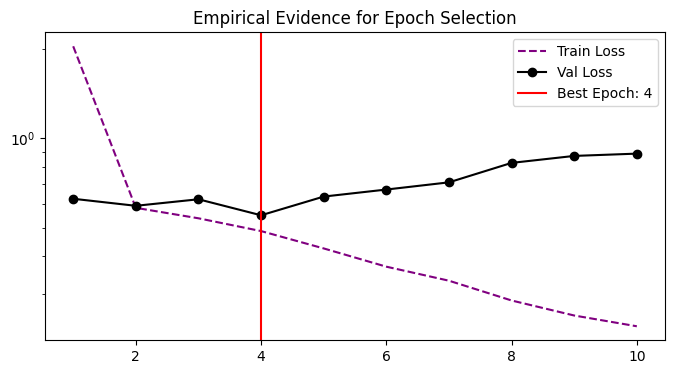

In [ ]:
# Pls use this code cell to excute the code to generate your emprical evidence to support your textual response above
# ******* INSERT YOUR CODE HERE *******
import matplotlib.pyplot as plt
import numpy as np
import wandb
import re

def getLogContent():
    api = wandb.Api(timeout=100)
    # run = api.run.history()
    runs = api.runs(path=WANDB_PROJECT)
    sorted_runs = sorted(runs, key=lambda run: run.created_at, reverse=True)
    latest_run = sorted_runs[0] # The first run in the sorted list is the late

    files = latest_run.files()

    output_log = None
    for file in files:
        if file.name == 'output.log':
            output_log = file
            break

    if output_log:
        log_bytes = output_log.download(replace = True)
        log_content = log_bytes.read() # .decode('utf-8')

    return log_content

def getLatestMetrics():
  """Retrieve latest run from WandB and get validation and training loss per epoch"""
  output_log = getLogContent()
  if output_log:
      combined_pattern = r'INFO:cw2_logger:epoch (\d+)\s+(training|validation) loss : ([\d.]+)' # regex on logged values

      training_losses = []
      validation_losses = []
      epochs = []
      matches = re.findall(combined_pattern, output_log)

      for epoch_str, loss_type, loss_str in matches:
          epoch = int(epoch_str)
          loss = float(loss_str)
          if loss_type == 'training':
              training_losses.append(loss)
          else:
              validation_losses.append(loss)
      return training_losses, validation_losses
  else:
      print("output.log not found")
      return None, None

# train_history and val_history are now populated directly from the training_loop

def plotMetrics(train_history, val_history):
    epochs = range(1, len(train_history) + 1)
    best_epoch = np.argmin(val_history) + 1

    plt.figure(figsize=(8, 4))
    plt.plot(epochs, train_history, label='Train Loss', color='purple', linestyle='--')
    plt.plot(epochs, val_history, label='Val Loss', color='black', marker='o')
    plt.axvline(x=best_epoch, color='red', label=f'Best Epoch: {best_epoch}')
    plt.yscale('log')
    plt.title('Empirical Evidence for Epoch Selection')
    plt.legend()
    plt.show()


def getEpochTimes():
    log_content = getLogContent()
    pattern = r'\[(\d{2}):(\d{2})<\d{2}:\d{2}, [\d\.]+it/s\]' # regex pattern for epoch times
    matches = re.findall(pattern, log_content)

    epoch_times = []
    for min_str, sec_str in matches:
        seconds = int(min_str) * 60 + int(sec_str)
        epoch_times.append(seconds)

    if epoch_times:
        avg_time = sum(epoch_times) / len(epoch_times)
    else:
        avg_time = None

    return epoch_times, avg_time


train_history, val_history = getLatestMetrics()
plotMetrics(train_history, val_history)
# print(getEpochTimes())
# ******* INSERT YOUR CODE HERE - END *******

---
#### $\color{Red}{Question\ 1.b.ii.ii}$ Holistic Performance Analysis (8 marks)
- Conduct a comprehensive evaluation of the model's overall performance using **appropriate metrics** that account for the specific characteristics of the task
- Your analysis must:
  - Use **at least two different metrics** beyond basic ones you already used
  - Justify why each selected metric is appropriate
  - Calculate and report metric values on the validation set
  - Contextualize what these metrics reveal about the model's capabilities and limitations
  - Address both the regression (positional) and classification (gripper action) components separately

**Example approach:** "For gripper action classification, the -- of X indicates... considering ... . For positional predictions, the ...  of Y suggests..."

$\color{red}{Response:}$ (Maximum 800 words in text)

For a holistic evaluation of the model, we selected **Mean Absolute Error (MAE) for positional regression** and **Macro-averaged F1-score for gripper action classification**. These metrics go beyond aggregate loss values and better reflect the operational requirements of continuous control and discrete decision-making in an end-to-end robotic manipulation task.

For **positional predictions**, the MAE of 0.03383 suggests that the model generally produces reasonably accurate end-effector positions. The plot shows a moderate right skew, meaning most errors are small, but there is a tail of larger errors. This implies that while the model is mostly accurate, there are occasional cases with higher deviations that could impact precise manipulation.

For **gripper action classification**, the Macro F1-score of 0.54744 indicates that the model struggles to balance predictions across the three gripper states. Considering the confusion matrix, the model predicts class 1 `Idle` well but fails to accurately predict rare actions like class 2 `Close`, showing a clear majority class bias. Macro F1 is appropriate because it weights each class equally, preventing dominant classes from masking poor performance on less frequent but critical actions.  

**Contextualization (Capabilities & Limitations)**:  
  - Positional outputs: While the majority of predictions are close to the true positions, the right-skewed error distribution highlights sporadic large deviations, suggesting the model may occasionally misalign the end-effector, especially in visually complex scenes or rare trajectories.  
  - Gripper actions: The model performs well on frequent 'Idle' states but underperforms on critical 'Open' and 'Close' actions, limiting its reliability for full pick-and-place tasks.  

**Conclusion**: Overall, the baseline can reproduce general trajectories but is **biased in discrete decisions and occasionally inaccurate in spatial predictions**, providing a clear starting point for improvements in both continuous and discrete control.


HOLISTIC PERFORMANCE ANALYSIS
------------------------------
1. [Regression] Mean Absolute Error (MAE): 0.03383
2. [Classification] Macro F1-Score: 0.54744
----------------------------------------


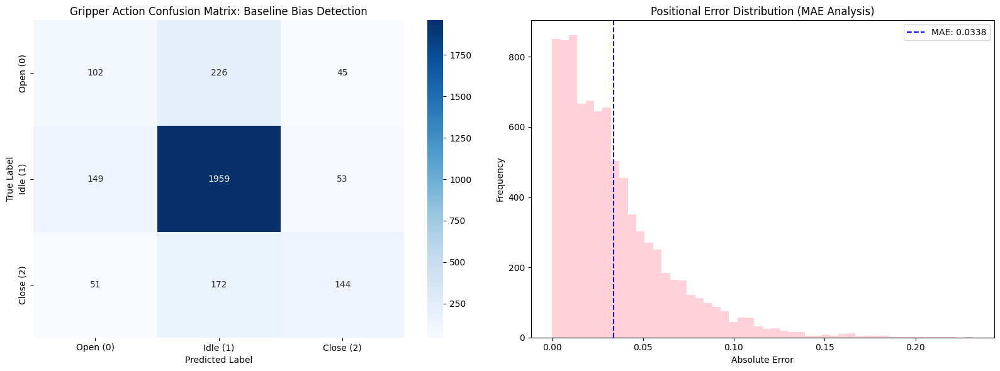

In [ ]:
import torch
import numpy as np
from sklearn.metrics import f1_score, mean_absolute_error
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

def getPreds(input_model):
  model = input_model.float()
  model.eval()
  device = next(model.parameters()).device

  all_pos_preds, all_pos_targets = [], []
  all_grp_preds, all_grp_targets = [], []

  with torch.no_grad(): # inference on validation set
      for batch in val_dataloader:
          images = batch.input["images"].to(device).float()
          obs = batch.input["obs"].to(device).float()

          outputs = model(images=images, obs=obs)

          all_pos_preds.append(outputs["pos"].cpu().numpy())
          all_pos_targets.append(batch.output["pos"].cpu().numpy())

          grp_pred = outputs["grp"].argmax(dim=1).cpu().numpy()
          grp_gt = batch.output["grp"].argmax(dim=1).cpu().numpy()
          all_grp_preds.append(grp_pred)
          all_grp_targets.append(grp_gt)

  pos_preds = np.concatenate(all_pos_preds, axis=0)
  pos_targets = np.concatenate(all_pos_targets, axis=0)
  grp_preds = np.concatenate(all_grp_preds, axis=0)
  grp_targets = np.concatenate(all_grp_targets, axis=0)
  return pos_preds, pos_targets, grp_preds, grp_targets


def evaluate(pos_preds, pos_targets, grp_preds, grp_targets):
  """ Evaluate method to obtain metrics for model on validation set"""
  # pos_preds, pos_targets, grp_preds, grp_targets = getPreds(input_model)
  mask = ~np.isnan(pos_preds)
  final_mae = mean_absolute_error(pos_targets[mask], pos_preds[mask])
  final_f1_macro = f1_score(grp_targets, grp_preds, average="macro")

  print("HOLISTIC PERFORMANCE ANALYSIS")
  print("-"*30)
  print(f"1. [Regression] Mean Absolute Error (MAE): {final_mae:.5f}")
  print(f"2. [Classification] Macro F1-Score: {final_f1_macro:.5f}")
  print("-" * 40)
  fig, axes = plt.subplots(1, 2, figsize=(16, 6))
  axes = axes.flatten()

  # --- Heatmap for gripper confusion (corrected labels) ---
  cm = confusion_matrix(grp_targets, grp_preds, labels=[0,1,2])
  sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
              xticklabels=['Open (0)', 'Idle (1)', 'Close (2)'],
              yticklabels=['Open (0)', 'Idle (1)', 'Close (2)'],
              ax=axes[0])
  axes[0].set_title('Gripper Action Confusion Matrix: Baseline Bias Detection')
  axes[0].set_xlabel('Predicted Label')
  axes[0].set_ylabel('True Label')

  # --- Positional error distribution ---
  errors = np.abs(pos_targets[mask] - pos_preds[mask])
  axes[1].hist(errors, bins=50, color='pink', alpha=0.7)
  axes[1].axvline(final_mae, color='blue', linestyle='--', label=f'MAE: {final_mae:.4f}')
  axes[1].set_title('Positional Error Distribution (MAE Analysis)')
  axes[1].set_xlabel('Absolute Error')
  axes[1].set_ylabel('Frequency')
  axes[1].legend()

  plt.tight_layout()
  plt.show()

preds = getPreds(model)
evals = evaluate(*preds)

---
#### $\color{Red}{Question\ 1.b.ii.iii}$ Systematic Failure Analysis (9 marks)
##### Task
- Move beyond overall metrics to investigate **systematic failure patterns** by examining specific data samples
- You must:
  - Identify and demonstrate **recurring failure modes** using concrete examples from the validation set
  - Quantify the prevalence and impact of each failure mode (e.g., "This pattern affects Y% of samples with characteristic Z")
  - Analyze **why** the model struggles with these specific types of observations
  - Connect failure patterns to model architecture or data characteristics

**Required approach:**
- Examine actual predictions on misclassified validation samples
- Look for patterns in the types of observations where the model consistently fails
- Consider visual analysis of image inputs where failures occur
- Analyze whether failures correlate with specific input characteristics (e.g., object positions, camera angles, gripper states)

**IMPORTANT:**
- Marks will be heavily penalized if you only discuss overall metrics without examining specific failure cases
- You must demonstrate systematic patterns rather than isolated examples
- If you find no systematic failure modes, you must provide comprehensive empirical evidence examining diverse data subsets

$\color{red}{Response:}$ (Maximum 900 words in text)

Through a systematic interrogation of the validation samples using statistical thresholds and visual evidence, we identified two recurring failure modes that reflect the baseline model’s structural limitations. Given the right-skewed distribution of positional errors, we adopt the 90th percentile as a data-driven threshold to isolate systematically high-error samples while excluding extreme outliers. This threshold facilitates consistent failure pattern identification rather than anecdotal observation.  
The gripper action classes in the validation set are highly imbalanced, with Idle dominating and Close being rare. This predisposes the model to default to more frequent classes, making Open and Close systematically harder to classify.
We focus our analysis on Open (Class 0) and Close (Class 2), which show disproportionately high misclassification rates: 72.7% for Open and 60.8% for Close. These rates indicate that the model struggles with active functional transitions, a key bottleneck in end-to-end manipulation.

* **Failure Mode A — Semantic State Confusion in Gripper Control**
  * Observation: The model frequently misclassifies both Open and Close actions. Open misclassification occurs in 271 out of 373 samples (72.7%), and Close misclassification occurs in 223 out of 367 samples (60.8%), suggesting that the model systematically fails to recognize gripper states under specific visual conditions.

  * Analysis: visual inspection reveals three recurring causes  

    1. Edge-of-frame effects: Some misclassified samples show the gripper at or near the image boundary, sometimes partially or fully out of frame. Limited visual context prevents the model from accurately recognizing the gripper state.
    2. Background interference: In several misclassified Open samples, additional objects are present in the scene, introducing visual clutter that confuses the model. This suggests sensitivity to scene complexity rather than object position per se.
    3. Gripper state subtlety: For Close misclassifications, the image is visually similar to correctly classified samples; the main difference is gripper angle. Misclassified samples often show a slightly smaller opening, possibly indicating a partial grasp, which the model fails to recognize.

* **Failure Mode B: Boundary-Induced Positional Regression Degradation**
  * Observation: Although the average positional MAE remains low, the error distribution is right-skewed, with the 90th percentile reaching 0.060, indicating a subset of validation samples with systematically elevated positional errors relative to the rest of the dataset. Defining Failure Mode B using this percentile-based threshold allows us to isolate consistent regression failures rather than relying on absolute magnitude alone.

  * Analysis: Visual inspection of these top 10% error samples reveals a recurring **boundary-related pattern**. In most cases, the gripper is positioned close to the image edge or partially outside the camera frame, reducing the available spatial context required for accurate end-effector localization. Notably, the scatter plot suggests these high positional errors **do not consistently coincide with gripper misclassification**, indicating that this failure mode is largely independent of semantic classification errors.

Summary Table:
|Item|Failure Mode A--Gripper|Failure Mode B--Position|
|---|---|---|
|Systematic Pattern|Semantic misclassification under edge, clutter, or subtle angle conditions|Positional error increase near image boundaries|
|Quantitative Evidence|Open: 72.7% error, Close: 60.8% error|Top 10% positional error samples (90th percentile threshold): 0.060|
|Condition|Partial out-of-frame gripper, complex background, subtle gripper angles|Gripper near or beyond camera field-of-view|

Conclusion:  
The baseline model exhibits consistent failure patterns under visually degraded conditions. Gripper state classification becomes unreliable when the gripper is partially out of frame, visually ambiguous, or surrounded by complex background elements, while positional regression accuracy deteriorates as the end-effector approaches image boundaries and spatial context is reduced. These behaviors indicate that the model is strongly biased toward centrally located, clearly observed configurations, revealing limitations in both data coverage and architectural robustness to boundary and visibility variations.

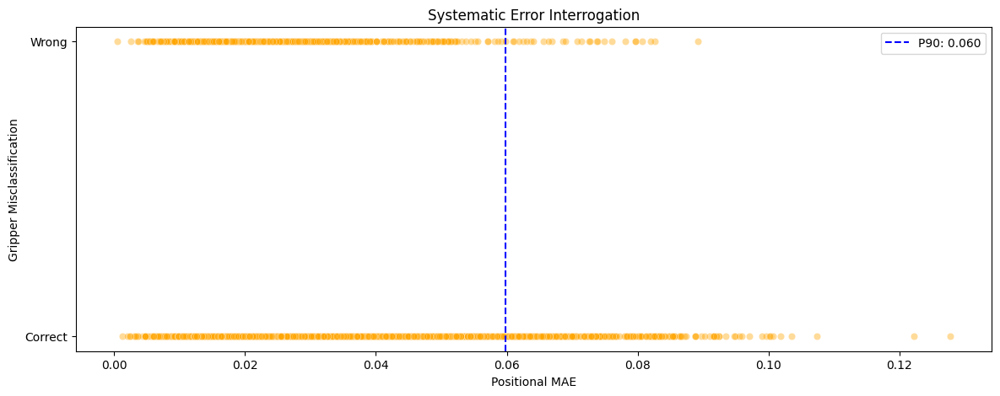

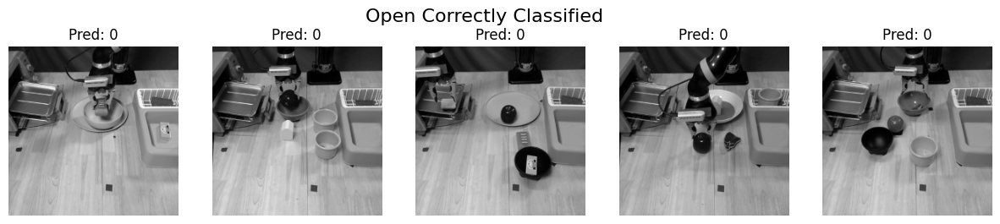

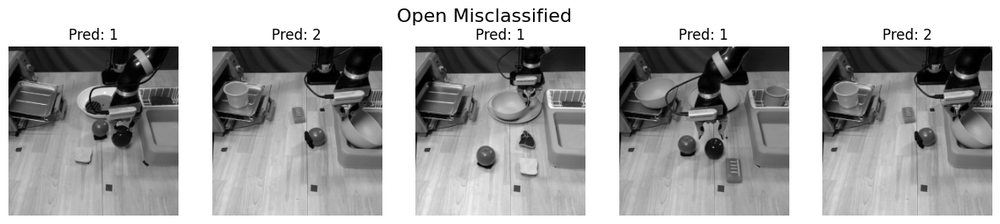

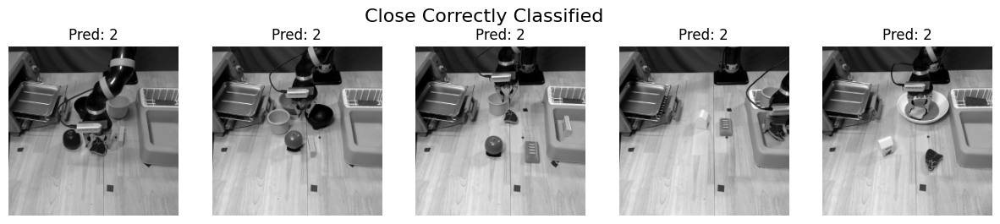

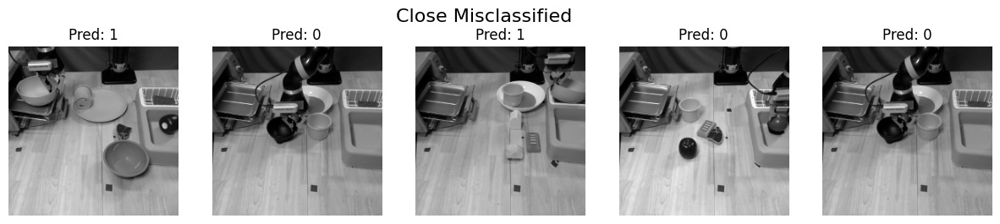

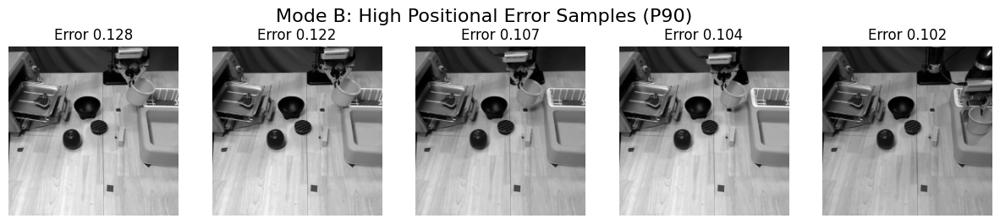

--- SUMMARY ---
Open: correct 102/373 (27.3%), wrong 271/373 (72.7%)
Close: correct 144/367 (39.2%), wrong 223/367 (60.8%)


In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

seed = 42
model.eval()
device = next(model.parameters()).device

all_images, all_pos_errors, all_grp_preds, all_grp_targets = [], [], [], []

for batch in val_dataloader:
    images = batch.input["images"].to(device)
    obs = batch.input["obs"].to(device)
    grp_target = batch.output["grp"].argmax(dim=1).to(device)
    pos_target = batch.output["pos"].to(device)

    with torch.no_grad():
        out = model(images, obs)
        pos_pred = out["pos"]
        grp_pred = out["grp"].argmax(dim=1)

    all_images.append(images.cpu())
    all_pos_errors.append(torch.abs(pos_pred - pos_target).mean(dim=1).cpu())
    all_grp_preds.append(grp_pred.cpu())
    all_grp_targets.append(grp_target.cpu())

all_images = torch.cat(all_images, dim=0)
all_pos_errors = torch.cat(all_pos_errors).numpy()
all_grp_preds = torch.cat(all_grp_preds).numpy()
all_grp_targets = torch.cat(all_grp_targets).numpy()

# scatter: to prove mode A & B are independent
plt.figure(figsize=(14,5))
sns.scatterplot(x=all_pos_errors, y=(all_grp_preds != all_grp_targets).astype(int),
                alpha=0.4, color='orange')
p90 = np.percentile(all_pos_errors, 90)
plt.axvline(x=p90, color='blue', linestyle='--', label=f'P90: {p90:.3f}')
plt.yticks([0,1], ['Correct','Wrong'])
plt.xlabel("Positional MAE")
plt.ylabel("Gripper Misclassification")
plt.title("Systematic Error Interrogation")
plt.legend()
plt.show()

open_idx  = np.where(all_grp_targets == 0)[0]
close_idx = np.where(all_grp_targets == 2)[0]

open_correct  = open_idx[all_grp_preds[open_idx] == all_grp_targets[open_idx]]
open_wrong    = open_idx[all_grp_preds[open_idx] != all_grp_targets[open_idx]]
close_correct = close_idx[all_grp_preds[close_idx] == all_grp_targets[close_idx]]
close_wrong   = close_idx[all_grp_preds[close_idx] != all_grp_targets[close_idx]]

def process_img(img_t):
    if img_t.dim() == 4: img_t = img_t[0]
    img_np = img_t.permute(1,2,0).numpy() if img_t.dim()==3 else img_t.numpy()
    if img_np.ndim==3 and img_np.shape[-1]==2:
        img_np = img_np[:,:,0]
    return (img_np - img_np.min()) / (img_np.max() - img_np.min() + 1e-8)

def show_samples(indices, title, num_show=5, show_pred=True, seed=42):
    num_show = min(num_show, len(indices))
    if num_show == 0:
        print(f"No samples to show for {title}")
        return

    rng = np.random.default_rng(seed)
    selected_indices = rng.choice(indices, size=num_show, replace=False)

    plt.figure(figsize=(15,3))
    for i, idx in enumerate(selected_indices):
        plt.subplot(1,num_show,i+1)
        plt.imshow(process_img(all_images[idx]), cmap='gray')
        plt.axis('off')
        if show_pred:
            plt.title(f"Pred: {all_grp_preds[idx]}")
    plt.suptitle(title, fontsize=16)
    plt.show()


show_samples(open_correct, "Open Correctly Classified")
show_samples(open_wrong,   "Open Misclassified")
show_samples(close_correct,"Close Correctly Classified")
show_samples(close_wrong,  "Close Misclassified")

mode_b_idx = np.argsort(all_pos_errors)[-5:][::-1]
plt.figure(figsize=(15,3))
for i, idx in enumerate(mode_b_idx):
    plt.subplot(1, len(mode_b_idx), i+1)
    plt.imshow(process_img(all_images[idx]), cmap='gray')
    plt.axis('off')
    plt.title(f"Error {all_pos_errors[idx]:.3f}")
plt.suptitle("Mode B: High Positional Error Samples (P90)", fontsize=16)
plt.show()

total_samples = len(all_grp_targets)
print("--- SUMMARY ---")
print(f"Open: correct {len(open_correct)}/{len(open_idx)} ({len(open_correct)/len(open_idx)*100:.1f}%), "
      f"wrong {len(open_wrong)}/{len(open_idx)} ({len(open_wrong)/len(open_idx)*100:.1f}%)")
print(f"Close: correct {len(close_correct)}/{len(close_idx)} ({len(close_correct)/len(close_idx)*100:.1f}%), "
      f"wrong {len(close_wrong)}/{len(close_idx)} ({len(close_wrong)/len(close_idx)*100:.1f}%)")
#print(f"Total validation samples: {total_samples}")
#print(f"Mode B samples (P90): {len(mode_b_idx)}")


---
### $\color{Red}{Question\ 1.c}$ Model tuning
Now you have evaluated the proposed model, you are required to iterate and train a higher performing one. You are expected to run experiments that help you understand where the model is underperforming, guiding your development.

#### $\color{Red}{Question\ 1.c.i}$ Model tuning (5 marks)
##### Task
- Using the code blocks below, implement a model which improves over the previous. Improve the performance as best you can and report the results using the metric/metrics you used in question 1.b.ii Model evaluation. Markers should be able to retrain your model by running the cell below. You may however, reference previously defined objects (e.g., loaded data and use previously defined functions).

$\color{red}{Response:}$ (Maximum 200 words in text)

Our model improves performance significantly compared to the baseline, with Macro-F1 increasing by almost 20% (0.54 to 0.72) . While our MAE increased slightly, we were able to increase its positive skew relative to the baseline. This means that the model overall fails less, but when it does the failures are slightly more accentuated. We consider this a positive - there could be many external reasons for this e.g. unclean data. Our training curves look much nicer too, with the training and validation losses both decreasing until around the 7th epoch.

Due to the specific constraints within the python library we used, we were not able to implement a learning rate scheduler on a plateau like we intended to. And due to the degree of randomness in our model - caused by random factors such as dropout that setting the seed does not fix - rerunning the experiment changes the curves and results. For example a previous run showed the 13th epoch to be the ideal epoch. Therefore we could not reduce the learning rate at predetermined epochs, and we also could not use the desired Reduce Learning Rate on Plateau method.

Overall, our model has been highly effective and has improved on all of the failure cases seen in the baseline.



In [ ]:
# Some functions to help with training and evaluation
def plotLosses():
    metrics = getLatestMetrics()
    plotMetrics(*metrics)

def getLatestEvals(model):
    preds = getPreds(model)
    evaluate(*preds)

def trainModel(input_model, gpu = True, criterion = train_criterion, val_criterion = val_criterion,
               train_dataloader = train_dataloader, val_dataloader = val_dataloader,
               epochs = 10, logger = logger,
               mo = WandBMetricOrchestrator(), half_precision = True, preds_save_type = None):
    """Define "model" input similarly to Baseline1"""
    input_model.train()
    optimizer = torch.optim.AdamW(
        input_model.parameters(), lr=exp_kwargs["learning_rate"],
        eps=1e-04, weight_decay = 1e-4 # weight decay: Regularisation
    )

    scheduler = torch.optim.lr_scheduler.StepLR(
        optimizer,
        step_size=2,   # every 10 epochs
        gamma=0.5       # multiply LR by 0.1
    )

    sl_trainer = TorchTrainingLoop(
        model=input_model, gpu=gpu, optimizer=optimizer, criterion=train_criterion,
        val_criterion=val_criterion, epochs=epochs, logger=logger,
        mo=mo, half_precision=half_precision, # scheduler=scheduler,
        preds_save_type=preds_save_type
    )

    wandb_name = "End_to_end_1"
    wandb_grp="End_to_end"

    if project_options.debug:
        wandb_name = f"{wandb_name}_DEBUG"


    orig = datetime.datetime.now()
    sl_trainer.training_loop(
        train_loader=train_dataloader,
        val_loader=val_dataloader,
        wandb_proj=WANDB_PROJECT,
        wandb_grp=wandb_grp,
        wandb_config=exp_kwargs,
        wandb_name=wandb_name,
        reset_kwargs={
            "image_encoder_kwargs": {},
            "obs_encoder_kwargs": {},
            "dense_kwargs": {}
            }
        )

epoch_train_loss,▁
epoch_val_loss,▁
grp_train_loss,█▄▄▄▄▅█▄▅▆▃▃▅▃▆▄▄▃▅▃▃▃▆▄▃▁▅▃▄▃▃▅▄▅▆▃▃▅▃▃
grp_val_loss,▃▃▂▅▅▃▂▂▃▃▃▅▁▅▄▄▆▃▅▅▃▁▂▆▆▅▄▅▁▃▃▅▂▃▅▃▇▄▆█
pos_train_loss,█▅▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
pos_val_loss,▃▆▅█▆▅▂▅▄▅▆▃▇▄▆▆▂▅▅▄▆█▅▃▄▂▅▂▆▆▇▃▃▁▃▃▂▅█▅
epoch_train_loss,0.86865
epoch_val_loss,0.61328
grp_train_loss,0.7886
grp_val_loss,0.69373
pos_train_loss,0.02057


INFO:cw2_logger:Running epochs: 20
INFO:cw2_logger:Running training epoch
100%|██████████| 398/398 [01:16<00:00,  5.19it/s]
INFO:cw2_logger:epoch 1	 training loss : 0.86865234375
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 1	 validation loss : 0.61328125 
INFO:cw2_logger:Running training epoch
100%|██████████| 398/398 [01:15<00:00,  5.25it/s]
INFO:cw2_logger:epoch 2	 training loss : 0.56787109375
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 2	 validation loss : 0.365234375 
INFO:cw2_logger:Running training epoch
100%|██████████| 398/398 [01:16<00:00,  5.23it/s]
INFO:cw2_logger:epoch 3	 training loss : 0.427490234375
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 3	 validation loss : 0.331787109375 
INFO:cw2_logger:Running training epoch
100%|██████████| 398/398 [01:16<00:00,  5.22it/s]
INFO:cw2_logger:epoch 4	 training loss : 0.378662109375
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 4	 validation loss : 0.327392578125 
INFO:cw2_logger:Ru

epoch_train_loss,█▅▄▄▃▃▃▃▃▃▂▂▂▁▁▁▁▁▁▁
epoch_val_loss,▇▂▁▁▁▁▁▁▁▂▂▂▃▃▃▆▅█▆▆
grp_train_loss,█▅▆▆▆▅▄▅▅▄▅▅▄▅▃▃▅▆▃▅▃▃▂▄▂▂▃▃▁▂▃▂▁▂▂▂▁▁▁▂
grp_val_loss,▄▂▃▅▂▂▂▂▄▂▂▂▂▂▁▂▄▁▃▁▃▁▂▁▂▂▁▃▂▅▂▆█▂▂▁▁▇▁▁
pos_train_loss,█▂▂▂▂▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
pos_val_loss,█▃▃▂▄▃▄▃▂▂▂▃▃▂▄▄▁▂▂▂▂▂▃▃▃▃▁▂▂▂▁▂▃▁▁▂▁▁▂▂
epoch_train_loss,0.09961
epoch_val_loss,0.55225
grp_train_loss,0.06202
grp_val_loss,0.0005
pos_train_loss,0.00762


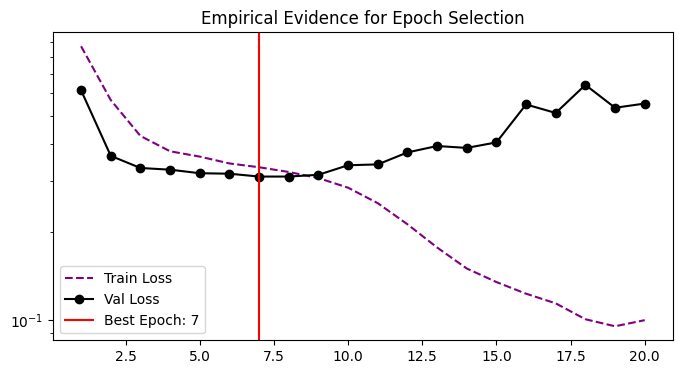

HOLISTIC PERFORMANCE ANALYSIS
------------------------------
1. [Regression] Mean Absolute Error (MAE): 0.03657
2. [Classification] Macro F1-Score: 0.71960
----------------------------------------


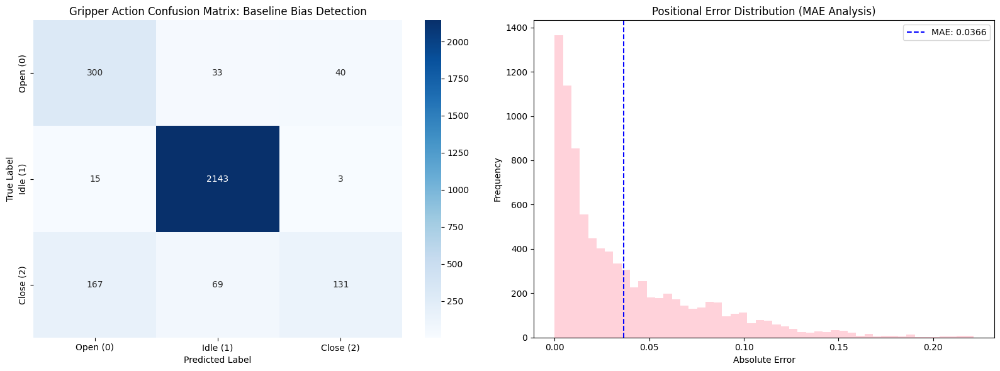

Average epoch training time:  None


In [ ]:
# ******* INSERT YOUR CODE HERE *******
class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=(1,1)):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=(3,3), padding=1, stride=stride, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=(3,3), padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)

        self.shortcut = nn.Sequential()
        if stride != (1,1) or in_channels != out_channels: # If (1) stride changes H,W or (2) channels C changes
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=(1,1), stride=stride, bias=False),
                nn.BatchNorm2d(out_channels)
            )

    def forward(self, x):
        out = self.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)  # residual addition
        out = self.relu(out)
        return out

residual_config = ConvolutionLayersConfig(
    input_dim=224,
    input_channels=2,
    layers=[
        nn.Conv2d(2, 8, kernel_size=(3,3), stride=1, padding=1),
        nn.BatchNorm2d(8),
        nn.ReLU(),
        nn.Dropout2d(0.1),
        ResidualBlock(8, 16),
        nn.Dropout2d(0.1),
        nn.MaxPool2d(kernel_size=(2,2)),
        ResidualBlock(16, 32),
        nn.Dropout2d(0.1),
        ResidualBlock(32, 32),
        nn.MaxPool2d(kernel_size=(2,2))
    ],
)

res_img_encoder = JointCNNEncoder(
    cnn = CNN(residual_config),
    dense = MLP(
        input_dim = 100352, # get_mlp_input_dim(residual_config),
        hidden_dims = [256],
        output_dim=128
    )
)

class SimpleGatedFusion(nn.Module):
    def __init__(self, input_dim, dropout_p=0.2):
        super().__init__()
        self.LayerNorm = nn.LayerNorm(input_dim)
        self.gate1 = nn.Linear(input_dim, input_dim // 2)
        self.gate2 = nn.Linear(input_dim // 2, input_dim)
        self.sigmoid = nn.Sigmoid()
        self.dropout = nn.Dropout(dropout_p)

    def forward(self, x):
        x = self.LayerNorm(x)
        g = torch.relu(self.gate1(x))       # reduce + nonlinearity
        g = self.gate2(g)                   # expand back
        g = self.sigmoid(g)                 # gates in [0,1]
        g = self.dropout(g)                 # random regularization
        out = x * g
        return out

# --- Final model ---
class Final(BaseModel):
    def __init__(self, image_encoder, obs_encoder, gate, regress, classif):
        super().__init__()
        self.image_encoder = image_encoder
        self.obs_encoder = obs_encoder
        self.gate = gate # simple gated fusion object
        self.regress = regress
        self.classif = classif


    def forward(self, images, obs):
        # breakpoint()
        _img_enc = self.image_encoder(images)
        _obs_enc = self.obs_encoder(obs)

        # breakpoint()
        fused = torch.cat([_img_enc, _obs_enc], dim=-1)
        fused_gated = self.gate(fused)
        pos = self.regress(fused_gated)
        grp = self.classif(fused_gated)
        # _dense_enc = self.dense(normed_fuse)  # no 0.05 scaling

        # pos = _dense_enc[:,0:3]
        # grp = _dense_enc[:,3:]
        return {"pos": pos, "grp": grp}

    def reset(self, image_encoder_kwargs, obs_encoder_kwargs, dense_kwargs):
        self.image_encoder.reset(**image_encoder_kwargs)
        self.obs_encoder.reset(**obs_encoder_kwargs)

torch.manual_seed(42)
image_encoder = JointCNNEncoder(
    cnn=CNN(cnn2_config),
    dense=MLP(
        input_dim=_mlp_input_dim,
        hidden_dims=[128, 64, 32, 18],
        dropouts = [0.2, 0.2, 0.2, 0.2],
        output_dim=16,
        actvton = nn.ReLU()
        )
)

obs_encoder = MLP(
    input_dim = 15,
    hidden_dims = [16, 32], # 16],
    batch_norms = [False, True], # True],
    dropouts = [0.2, 0], # 0.4],
    output_dim = 16,
    actvton = nn.ReLU() # add activation function
)

gate = SimpleGatedFusion(32)
# breakpoint()
regress = MLP(
    input_dim = 32,
    hidden_dims = [16],
    # batch_norms = [True],
    dropouts = [0.2],
    output_dim = 3,
    # actvton = nn.ReLU()
)

classif = MLP(
    input_dim = 32,
    hidden_dims = [32, 16, 8],
    dropouts = [0.2, 0.2, 0.2],
    output_dim = 3,
)

final = Final(
    image_encoder=image_encoder,
    obs_encoder=obs_encoder,
    gate = gate,
    regress = regress,
    classif = classif
)

trainModel(final, epochs=20) # , train_dataloader = weighted_train_dataloader) # , optimizer = final_optimizer
plotLosses()
getLatestEvals(final)
print("Average epoch training time: ", getEpochTimes()[1])
# ******* INSERT YOUR CODE HERE - END *******

---
#### $\color{Red}{Question\ 1.c.ii}$ Discussion (marks broken down in subsections below)

##### Task
In the markdown blocks below, discuss **three** experiments that you ran during the development of your model, defined in 1.c.i Model tuning which were the **most insightful** with respect to the design of your final model. Importantly, **most insightful** needn't necessarily be the final decisions that appear in the model defined in question 1.c.i Model tuning, rather they should be experiments that most shaped your model development process. For example:
- You might decide to use a learning rate scheduler and decrease the learning rate at epoch 10 (call this experiment "EXP_LR");
- This experiment produces a jump in performance and unlocks a series of further fruitful experiments into learning rate scheduling;
- However, in the model reported in question 1.c.i Model tuning, you use a learning rate schedule with descreases at epochs 6 and 15 (since these produced a marginal performance over "EXP_LR")
- For this question __you should discuss EXP_LR__.
  
For each experiment, complete the "Description", "Result" and "Conclusion" sections where the following information should be provided:
* __Description__: What delta were you measuring i.e., change of architecture, change of learning rate etc?
* __Justification__: **Why** are you conducting the experiment?
  * What was the context of the model development process up to this point? What did you already know about how well the model performed/why it was performing/what were the challenging data points?
* __Conclusion__: What did you __learn__ from the experiment and provide __empirical evidence__ to support this claim. In drawing your conclusions, consider where there are multiple possible causes for the model failing, ensure you provide evidence for each of these and conclude whether or not they might be root cause (you may conclude that there are multiple causes).

**IMPORTANT** If your reported experiments are **not** well motivated and do not demonstrate that you have integrogated the model performance, you will be deducted marks. An example of poor motovation might be: *I chose to decrease the learning rate from X to Y as I did not know what impact this might have*. This justification could be improved by explaining what you __already know__ about how the learning rate might be affecting the model. What hypotheses might you draw about what the experiment will show?



#### $\color{Red}{Question\ 1.c.ii.i}$ Experiment 1 discussion (10 marks)
##### Description:
  
##### Justification:

##### Conclusion:


$\color{red}{Response:}$ (Maximum 800 words in text)

Description: Changing the model architecture (residual links in the CNN) and a new dataloader weighted on class balance.

Justification: From our failure analysis, we notice that the gripper classification is catastrophic. With ~70% and ~85% misclassified on the minority classes for the smaller dataset, this is bad. Even though the F1 score of the baseline model is ~0.44, this failure indicates that the model has not truly learned what each image and set of observations really means. We believe this may be affected by the class balance, which is why we will use a new dataloader weighted on the classes. Before this point, we had performed architectural changes such as dropout and batchnorm - but noticed hardly any improvements. This indicates that both the class imbalance may be playing a role, but also the model has not learned any useful representations (as mentioned before, the F1 score is misleadingly high, and if it is unable to differentiate between open and closed cases, this indicates that the model has not understood the problem or learned useful representations). This residual link was introduced as an experiment to see if the it could encourage the model to learn more useful representations that might be better for the task. We will run 4 experiments, experimenting with a residual layer in our CNN, and different dataloaders - with every other element identical.

Conclusion: Surprisingly, the weighted dataloader had absolutely no difference in the metrics - they were identical whether we used a weighted dataloader or not. This is very surprising as we would expect it to improve even better than the residual links in our network. And the residual links improved the mean absolute error significantly from 0.1387 to 0.059: approximately halved it. This suggests that, as conjectured, the residual links did guide the model to a higher latent understanding. Even though the Macro F1 score is lower with residual links, the number of correctly classified idle datapoints has risen from 357 to 402: approximately a 15% increase with just one extra residual layer. These combined metrics indicate that residual links are surprisingly effective at improving the model's understanding while it is moving i.e. when the model needs to move the arm, it understands that the gripper needs to be idle and moves the arm to a greater accuracy according to the MAE. Even though the weighted dataloader did not help much, this helps to guide future experiments and our model creation: We know that residual networks will help with the model's deeper understanding when it needs to move, and that it still struggles to understand when to open or close the gripper.


Due to limited access to the Colab GPU, model tuning experiments were run on the debugging dataset; performance was evaluated against the baseline also run on this dataset, the metrics for which are available in the print out from the code below (Mean Absolute Error (MAE): 0.13866; Macro F1-Score: 0.44461). The misclassification results for the smaller dataset are also included in Table 1 below.

Table 1. Misclassification results for Smaller Dataset
| Section | Correct | Total | Correct % | Wrong | Wrong % |
|--------|--------|-------|-----------|-------|---------|
| Open   | 29      | 93    | 31.2%     | 64    | 68.8%   |
| Close  | 5       | 35    | 14.3%     | 30    | 85.7%   |


INFO:cw2_logger:Running epochs: 10
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:20<00:00, 15.93it/s]
INFO:cw2_logger:epoch 1	 training loss : 8.6796875
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 1	 validation loss : 0.716796875 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:19<00:00, 16.03it/s]
INFO:cw2_logger:epoch 2	 training loss : 0.420166015625
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 2	 validation loss : 0.873046875 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:20<00:00, 15.40it/s]
INFO:cw2_logger:epoch 3	 training loss : 0.28466796875
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 3	 validation loss : 0.97412109375 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:19<00:00, 16.52it/s]
INFO:cw2_logger:epoch 4	 training loss : 0.2474365234375
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 4	 validation loss : 1.0185546875 
INFO:cw2_logger:Running

epoch_train_loss,█▁▁▁▁▁▁▁▁▁
epoch_val_loss,▁▂▃▄▅█▅█▆▅
grp_train_loss,▄█▃▂▂▁▂▁▂▂▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▃▁▁▁▁▂▁
grp_val_loss,▁▂▁▁▁▁▄▁▁▁▁▁▂▁▁▇▄▁▁▃▁▁▄▁▅▁▁▁█▃▁▄▁▂▁▁▄▁▃▅
pos_train_loss,█▃▂▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
pos_val_loss,▆▁█▃▁▁▂▁▁▁▆▂▂▁▂▂▁▁▃▁▂▄▃▂▃▂▁▁▁▃▂▂▁▁▂▁▁▁▂▂
epoch_train_loss,0.13953
epoch_val_loss,1.13965
grp_train_loss,6e-05
grp_val_loss,0.07098
pos_train_loss,0.00689


INFO:cw2_logger:Running epochs: 10
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:20<00:00, 15.74it/s]
INFO:cw2_logger:epoch 1	 training loss : 1.232421875
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 1	 validation loss : 0.859375 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:19<00:00, 16.60it/s]
INFO:cw2_logger:epoch 2	 training loss : 0.25732421875
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 2	 validation loss : 0.97607421875 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:21<00:00, 15.03it/s]
INFO:cw2_logger:epoch 3	 training loss : 0.153076171875
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 3	 validation loss : 1.0654296875 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:19<00:00, 16.12it/s]
INFO:cw2_logger:epoch 4	 training loss : 0.09429931640625
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 4	 validation loss : 1.3671875 
INFO:cw2_logger:Running t

epoch_train_loss,█▂▂▁▂▁▁▁▁▁
epoch_val_loss,▁▂▃▅▂▆▇▇▆█
grp_train_loss,█▃▃▄▄▁▄▁▂▁▁▃▃▁▁▂▄█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▁▂▁▁▁▁
grp_val_loss,▁▂▄▁▄▁▅▁▁▃▁▃▁▁█▁▁▁▁▃▁▄▁▁▁▁▁▁▁▁▁▁▁▁▄▁▁▂▁▁
pos_train_loss,█▆█▃▃▂▂▃▁▁▁▁▁▁▁▂▁▂▁▇▅▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂
pos_val_loss,▂▁▆▃▁▇█▃▂▂█▂▃▁▇▄▃▂▆▁▄▃▄▁▆▂▂▁▁▂▂▃▃▂▁▁▃▂▁▂
epoch_train_loss,0.05505
epoch_val_loss,1.70312
grp_train_loss,0.0
grp_val_loss,0.32935
pos_train_loss,0.00535


INFO:cw2_logger:Running epochs: 10
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:21<00:00, 14.76it/s]
INFO:cw2_logger:epoch 1	 training loss : 38.1875
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 1	 validation loss : 0.71923828125 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:21<00:00, 15.01it/s]
INFO:cw2_logger:epoch 2	 training loss : 0.84033203125
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 2	 validation loss : 0.896484375 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:22<00:00, 14.03it/s]
INFO:cw2_logger:epoch 3	 training loss : 0.491455078125
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 3	 validation loss : 0.82421875 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:22<00:00, 14.38it/s]
INFO:cw2_logger:epoch 4	 training loss : 0.38134765625
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 4	 validation loss : 1.0244140625 
INFO:cw2_logger:Running trai

epoch_train_loss,█▁▁▁▁▁▁▁▁▁
epoch_val_loss,▁▃▂▄▄█▆▇█▆
grp_train_loss,▆▂▃▂▂▃▅▂█▃▂▂▁▄▁▁▂▂▁▂▁▁▂▁▄▁▇▁▁▁▂▁▁▁▂▁▁▁▁▁
grp_val_loss,▁▅▁▁▁▆▁▂▁▁▁▁▂▅█▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▂▃▄▇▃▁
pos_train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
pos_val_loss,▄▇▁▃██▇▅▃▁▂▄▄▂▂▂▂▃▂▃▁▁▂▃▂▁▂▂▂▂▂▁▃▁▁▃▁▁▁▁
epoch_train_loss,0.17725
epoch_val_loss,1.16992
grp_train_loss,3e-05
grp_val_loss,0.00185
pos_train_loss,0.0064


INFO:cw2_logger:Running epochs: 10
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:21<00:00, 14.75it/s]
INFO:cw2_logger:epoch 1	 training loss : 6.0078125
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 1	 validation loss : 0.841796875 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:22<00:00, 14.42it/s]
INFO:cw2_logger:epoch 2	 training loss : 0.379150390625
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 2	 validation loss : 1.00390625 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:22<00:00, 14.50it/s]
INFO:cw2_logger:epoch 3	 training loss : 0.2388916015625
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 3	 validation loss : 1.3349609375 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:21<00:00, 14.61it/s]
INFO:cw2_logger:epoch 4	 training loss : 0.1640625
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 4	 validation loss : 1.310546875 
INFO:cw2_logger:Running traini

epoch_train_loss,█▁▁▁▁▁▁▁▁▁
epoch_val_loss,▁▂▅▅▄▇█▇██
grp_train_loss,▆█▇▂▃▁▂▁▁▂▁▂▁▁▁▁▂▁▁▁▂▁▁▁▄▃▁▁▁▁▁▂▁▁▁▁▁▁▁▁
grp_val_loss,▁▁▂▁▁▂▁▁▁▁▁▁▂▆█▁▄▅▁▁▁▁▅▁▁▄▇▁▁▁▇▁▃▁▃▄▃▁▁▁
pos_train_loss,▃▇▂▂▃▂█▂▁▂▂▂▂▃▂▂▁▂▁▁▁▂▂▁▂▂▂▁▄▁▁▁▁▁▂▁▁▁▃▁
pos_val_loss,▂▃▂▂▂▂▂▁▂▂▃▃▃▄▄▃█▃▂▁▁▂▁▁▂▁▁▂▂▁▁▂▁▁▁▂▂▁▂▂
epoch_train_loss,0.09039
epoch_val_loss,1.68555
grp_train_loss,0.00057
grp_val_loss,0.00351
pos_train_loss,0.00754


======= PERFORMANCE: baseline =======
HOLISTIC PERFORMANCE ANALYSIS
------------------------------
1. [Regression] Mean Absolute Error (MAE): 0.13866
2. [Classification] Macro F1-Score: 0.44461
----------------------------------------


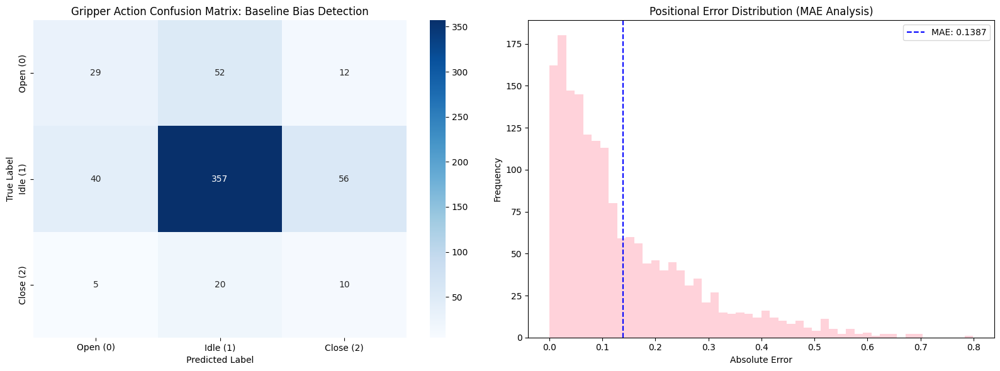

======= PERFORMANCE: baseline_with_weight =======
HOLISTIC PERFORMANCE ANALYSIS
------------------------------
1. [Regression] Mean Absolute Error (MAE): 0.13866
2. [Classification] Macro F1-Score: 0.44461
----------------------------------------


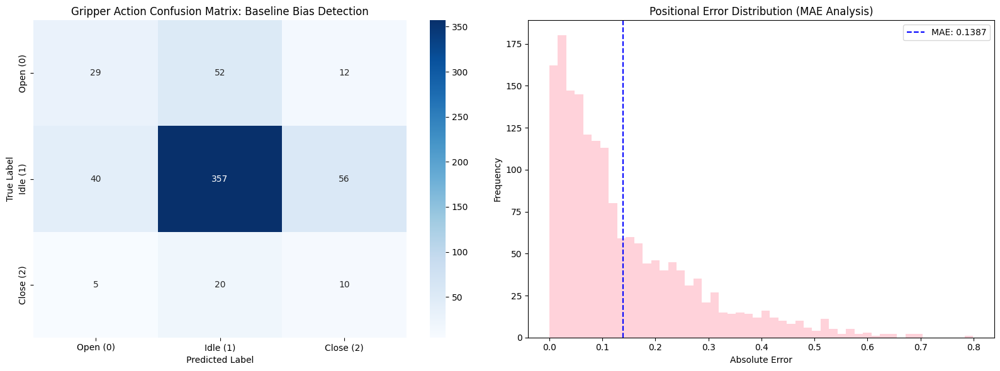

======= PERFORMANCE: residuals =======
HOLISTIC PERFORMANCE ANALYSIS
------------------------------
1. [Regression] Mean Absolute Error (MAE): 0.05902
2. [Classification] Macro F1-Score: 0.36881
----------------------------------------


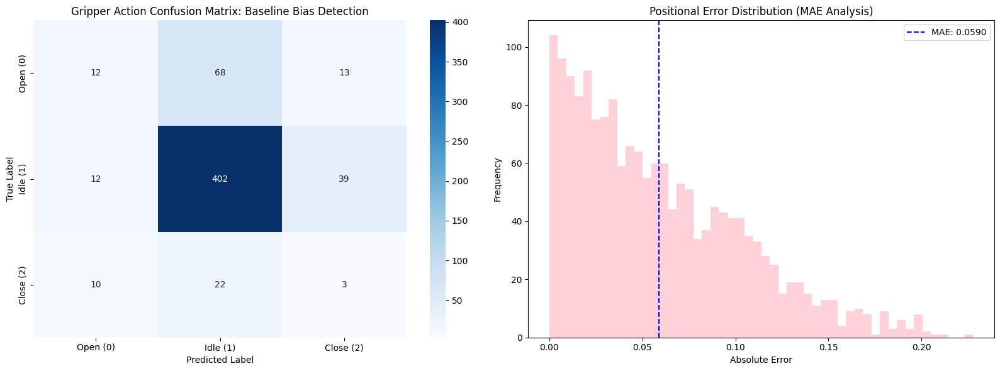

======= PERFORMANCE: residuals_with_weight =======
HOLISTIC PERFORMANCE ANALYSIS
------------------------------
1. [Regression] Mean Absolute Error (MAE): 0.05902
2. [Classification] Macro F1-Score: 0.36881
----------------------------------------


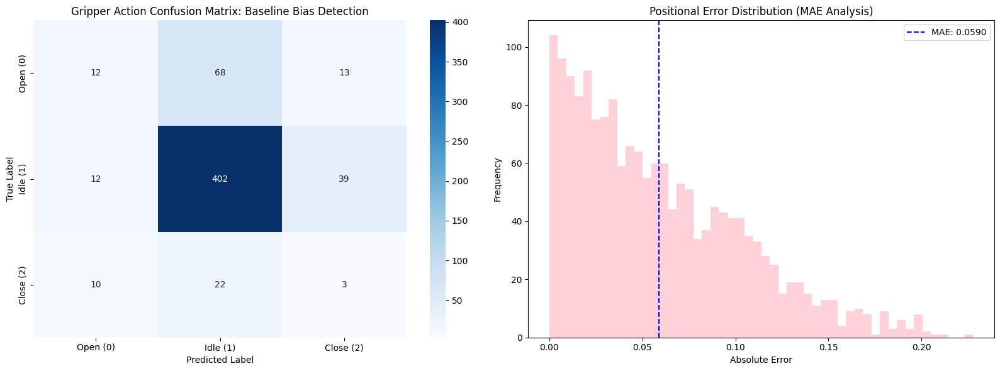

In [ ]:
# Pls use this code cell to excute the code to generate your emprical evidence to support your textual response above
# # ******* INSERT YOUR CODE HERE *******
from torch.utils.data import WeightedRandomSampler
gripper_actions = train_nps['actions'][:, -1].astype(int)

class_counts = np.bincount(gripper_actions)
class_weights = 1. / torch.tensor(class_counts, dtype=torch.float)

sample_weights = class_weights[gripper_actions]

weighted_sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

weighted_train_dataloader = DataLoader(
    train_dataset,
    batch_size=exp_kwargs["batch_size"],
    collate_fn=collate_func,
    sampler=weighted_sampler,  # Add the sampler here
)

class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=(1,1)):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=(3,3), padding=1, stride=stride, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=(3,3), padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)

        self.shortcut = nn.Sequential()
        if stride != (1,1) or in_channels != out_channels: # If (1) stride changes H,W or (2) channels C changes
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=(1,1), stride=stride, bias=False),
                nn.BatchNorm2d(out_channels)
            )

    def forward(self, x):
        out = self.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)  # residual addition
        out = self.relu(out)
        return out

residual_config = ConvolutionLayersConfig(
    input_dim=224,
    input_channels=2,
    layers=[
        nn.Conv2d(2, 8, kernel_size=(3,3), stride=1, padding=1),
        nn.BatchNorm2d(8),
        nn.ReLU(),
        nn.Dropout2d(0.1),
        ResidualBlock(8, 16),
        nn.Dropout2d(0.1),
        nn.MaxPool2d(kernel_size=(2,2)),
        ResidualBlock(16, 32),
        nn.Dropout2d(0.1),
        ResidualBlock(32, 32),
        nn.MaxPool2d(kernel_size=(2,2))
    ],
)

baseline_config = ConvolutionLayersConfig(
    input_dim=224,
    input_channels=2,
    layers=[
        nn.Conv2d(2, 8, kernel_size=(3,3), stride=1, padding=1),
        nn.BatchNorm2d(8),
        nn.ReLU(),
        nn.Dropout2d(0.1),
        ResidualBlock(8,16),
        nn.Dropout2d(0.1),
        nn.MaxPool2d(kernel_size=(2,2)),
        ResidualBlock(16,32),
        nn.Dropout2d(0.1),
        nn.MaxPool2d(kernel_size=(2,2))
    ]
)

def get_mlp_input_dim(config):
    breakpoint()
    _cnn_output_dim = config.get_output_dims()
    _cnn_output_channels = config.get_output_channels()
    _mlp_input_dim = int( # H x W x C
                (_cnn_output_dim[-1]*_cnn_output_dim[-1])*_cnn_output_channels[-1]
                )
    return _mlp_input_dim

baseline_img_encoder = JointCNNEncoder(
    cnn = CNN(baseline_config),
    dense=MLP(
        input_dim=100352, # get_mlp_input_dim(baseline_config),
        hidden_dims=[256],
        output_dim=128
        )
)

res_img_encoder = JointCNNEncoder(
    cnn = CNN(residual_config),
    dense = MLP(
        input_dim = 100352, # get_mlp_input_dim(residual_config),
        hidden_dims = [256],
        output_dim=128
    )
)

obs_encoder = MLP(
    input_dim = 15,
    hidden_dims = [256,256],
    output_dim = 128
)

dense = MLP(
    input_dim = 128,
    hidden_dims = [64,32],
    output_dim = 6
)

baseline = Baseline1(
    image_encoder=baseline_img_encoder,
    obs_encoder=obs_encoder,
    dense=dense
)
baseline_with_weight = Baseline1(
    image_encoder=baseline_img_encoder,
    obs_encoder=obs_encoder,
    dense=dense
)
residuals = Baseline1(
    image_encoder=res_img_encoder,
    obs_encoder=obs_encoder,
    dense=dense
)
residuals_with_weight = Baseline1(
    image_encoder=res_img_encoder,
    obs_encoder=obs_encoder,
    dense=dense
)
trainModel(baseline, train_dataloader = train_dataloader)
trainModel(baseline_with_weight, train_dataloader = weighted_train_dataloader)
trainModel(residuals)
trainModel(residuals_with_weight, train_dataloader = weighted_train_dataloader)
models = {
    "baseline": baseline,
    "baseline_with_weight": baseline_with_weight,
    "residuals": residuals,
    "residuals_with_weight": residuals_with_weight
    }
for name, model in models.items():
    print(f"======= PERFORMANCE: {name} =======")
    getLatestEvals(model)
# ******* INSERT YOUR CODE HERE - END *******


---
#### $\color{Red}{Question\ 1.c.ii.ii}$ Experiment 2 discussion (10 marks)
##### Description:
##### Justification: Helps us determine semantic understanding of model: Given not idle, what would it be classed under?
##### Conclusion

$\color{red}{Response:}$ (Maximum 800 words in text)

Description: Changing the model architecture to include both dropout and a "layernorm" layer in our dense network.

Justification: Before the first experiment, we had tried to run dropout and batchnorm in our network, with little effect to the problem of overfitting. Our loss functions were also very noisy - spiking significantly. Our validation losses were noisy. However upon conducting further research, we discovered a feature known as 'Layernorm' where the model normalises the vector in a certain layer using metrics calculated from that layer (i.e. the mean and std of this individual vector rather than for each element of the vector as BatchNorm calculates). This is supposed to be helpful with reducing the noise in the training and validation curves. While it may not directly help our overfitting, it may unlock the dropout's ability to fix the issues with generalising: It could be that dropout did not work with batchnorm, but it will work well with layernorm.

Conclusion: This experiment was also surprising: Dropout had no effect in either case. However the layernorm was even more effective at reducing the MAE than we could have imagined. It reduced the MAE by around 5x. This indicates that an issue we were having in our model was that the latent representation of the input data was dominated by either the image encoding or the observation encodings. Layernorm normalised the latent representation and in doing so reduced the positional error by around 5x. So while this experiment did not improve our training curve as seen from the WandB logs (we are still overfitting - validation error is still increasing after each epoch), the architectural change of using Layernorm in our dense network has proven effective, and could be very useful in our final model. This also guides our experimentation: they key to improving the model even further could be to try and enhance its deeper understanding, and the way to do this is to improve its latent representation.


INFO:cw2_logger:Running epochs: 10
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:12<00:00, 25.67it/s]
INFO:cw2_logger:epoch 1	 training loss : 1.4814453125
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 1	 validation loss : 0.64501953125 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:12<00:00, 26.02it/s]
INFO:cw2_logger:epoch 2	 training loss : 0.373046875
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 2	 validation loss : 0.9990234375 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:12<00:00, 25.36it/s]
INFO:cw2_logger:epoch 3	 training loss : 0.25146484375
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 3	 validation loss : 0.9111328125 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:12<00:00, 25.61it/s]
INFO:cw2_logger:epoch 4	 training loss : 0.181884765625
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 4	 validation loss : 1.1630859375 
INFO:cw2_logger:Runnin

epoch_train_loss,█▂▂▂▁▁▁▁▁▁
epoch_val_loss,▁▃▂▄▄▅▇▇██
grp_train_loss,▃▂▂▂▃▅▃▄▃▁▁▂▁▇▃▁▂▁▂▃▃▁▁▂█▁▅▃▁▁▁▁▁▁▁▁▁▁▁▁
grp_val_loss,▁▁▁▂▂▁▁▂▂▁▂▁▁▁▁▁▁▁▁▁▁▅▂▃▂▁▄▆▆▇▅▄▁▁█▁▄▁▆▁
pos_train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
pos_val_loss,▂▁▂▂▃▂▅▃▄▇▂▂▂▂▂▂▁▂▁▂▂▁▁▁▂▁▂▄█▇▁▁▁▁▁▂▃▁▁▁
epoch_train_loss,0.08191
epoch_val_loss,2.04688
grp_train_loss,0.00177
grp_val_loss,0.0013
pos_train_loss,0.00898


INFO:cw2_logger:Running epochs: 10
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:12<00:00, 25.07it/s]
INFO:cw2_logger:epoch 1	 training loss : 1.2822265625
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 1	 validation loss : 0.61865234375 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:12<00:00, 25.21it/s]
INFO:cw2_logger:epoch 2	 training loss : 0.498779296875
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 2	 validation loss : 0.845703125 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:13<00:00, 24.52it/s]
INFO:cw2_logger:epoch 3	 training loss : 0.281494140625
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 3	 validation loss : 0.94287109375 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:12<00:00, 24.63it/s]
INFO:cw2_logger:epoch 4	 training loss : 0.192138671875
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 4	 validation loss : 1.0595703125 
INFO:cw2_logger:Ru

epoch_train_loss,█▄▂▂▁▁▁▁▁▁
epoch_val_loss,▁▂▂▃▃▇█▆▅█
grp_train_loss,▂▃▁▃█▂▄▂▁▁▂▂▁▁▂▁▃▁▁▂▂▁▃▁▁▁▁▁▁▂▁▁▁▁▁▁▂▁▁▁
grp_val_loss,▁▂▁▂▁▁▁▁▁▂▁▁▄▁▆▁▂▆▁▁▁▁▁▁▁▁▁▇▁▁▁▅▁▂▆█▆▁▄▁
pos_train_loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
pos_val_loss,▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▂▃▁█▂▁▁▁▁▃▂
epoch_train_loss,0.06128
epoch_val_loss,2.13867
grp_train_loss,0.00044
grp_val_loss,0.0
pos_train_loss,0.00554


INFO:cw2_logger:Running epochs: 10
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:12<00:00, 24.76it/s]
INFO:cw2_logger:epoch 1	 training loss : 1.859375
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 1	 validation loss : 0.63330078125 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:13<00:00, 24.49it/s]
INFO:cw2_logger:epoch 2	 training loss : 0.6376953125
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 2	 validation loss : 0.6298828125 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:13<00:00, 24.11it/s]
INFO:cw2_logger:epoch 3	 training loss : 0.4638671875
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 3	 validation loss : 0.76025390625 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:12<00:00, 24.64it/s]
INFO:cw2_logger:epoch 4	 training loss : 0.320068359375
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 4	 validation loss : 0.794921875 
INFO:cw2_logger:Running tr

epoch_train_loss,█▃▃▂▂▁▁▁▁▁
epoch_val_loss,▁▁▂▂▆▇▇▄▅█
grp_train_loss,▂█▅▃▂▅▅▁▃▆▄▁▁▅▆▆▁▁▃▁▁▁▂▂▁▁▂▃▁▁▁▁▁▁▁▁▁▁▁▁
grp_val_loss,▁▂▃▂▃▃▁▁▁▂▁▁▃▁▁▁▁▁▁▁█▁▁▁▁▄▅▁▄▁█▄▁▁▁▁▃▁▁▁
pos_train_loss,▃▃█▃▄▂▄▂▄▂▁▁▂▃▂▂▂▁▃▁▁▁▁▂▁▁▂▁▁▁▂▂▁▂▁▁▃▁▁▂
pos_val_loss,▁▄▃▂▁▁▂▃▅▃▁▂▂▁▁▂▁▁▁▆█▂▄▂▂▁▇▁▂▂▂▄▂▂▂▃▁▂▂▂
epoch_train_loss,0.08087
epoch_val_loss,1.60254
grp_train_loss,0.05646
grp_val_loss,0.00792
pos_train_loss,0.00476


INFO:cw2_logger:Running epochs: 10
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:13<00:00, 24.31it/s]
INFO:cw2_logger:epoch 1	 training loss : 2.01171875
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 1	 validation loss : 0.73095703125 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:13<00:00, 24.10it/s]
INFO:cw2_logger:epoch 2	 training loss : 0.68359375
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 2	 validation loss : 0.66748046875 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:13<00:00, 23.91it/s]
INFO:cw2_logger:epoch 3	 training loss : 0.55078125
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 3	 validation loss : 0.705078125 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:13<00:00, 24.32it/s]
INFO:cw2_logger:epoch 4	 training loss : 0.382080078125
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 4	 validation loss : 0.81298828125 
INFO:cw2_logger:Running tra

epoch_train_loss,█▃▃▂▁▁▁▁▁▁
epoch_val_loss,▁▁▁▂▆▆▄▅██
grp_train_loss,▄▇▄█▅▂▃▆▄▆▃▆▃▇▄▂▃▃▁▅▁▁▁▁▂▁▁▂▂▂▂▃▁▁▁▁▁▁▁▇
grp_val_loss,▂▁▂▁▁▁▁▁▁▁▂▁▁▃▁▃▂▁▁▂▁▁▁▁▃▁▂▁▁▁▂█▁▁▃▅▁▁▁▁
pos_train_loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
pos_val_loss,▄▃▄█▄▅▃▂▂▃▁▁▂▁▁▁▁▁▂▂▁▂▄▅▂▆▄▃▄▃▂▂▁▁▁▁▂▁▂▁
epoch_train_loss,0.10571
epoch_val_loss,1.66016
grp_train_loss,0.01634
grp_val_loss,0.00132
pos_train_loss,0.02527


HOLISTIC PERFORMANCE ANALYSIS
------------------------------
1. [Regression] Mean Absolute Error (MAE): 0.27866
2. [Classification] Macro F1-Score: 0.41008
----------------------------------------


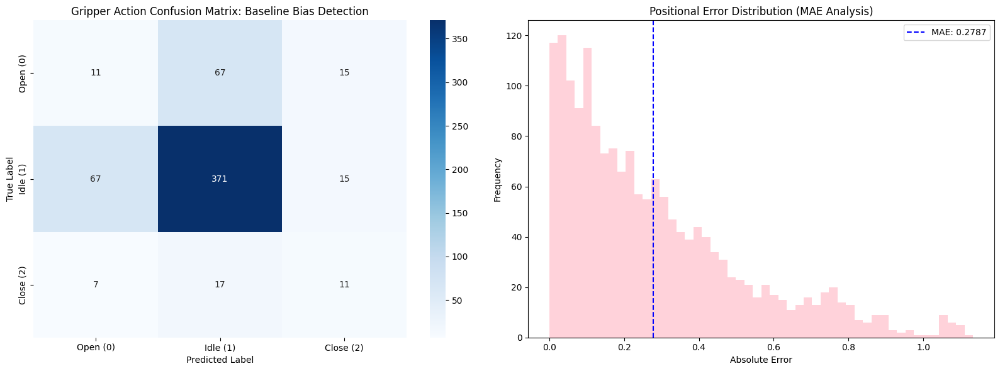

HOLISTIC PERFORMANCE ANALYSIS
------------------------------
1. [Regression] Mean Absolute Error (MAE): 0.27866
2. [Classification] Macro F1-Score: 0.41008
----------------------------------------


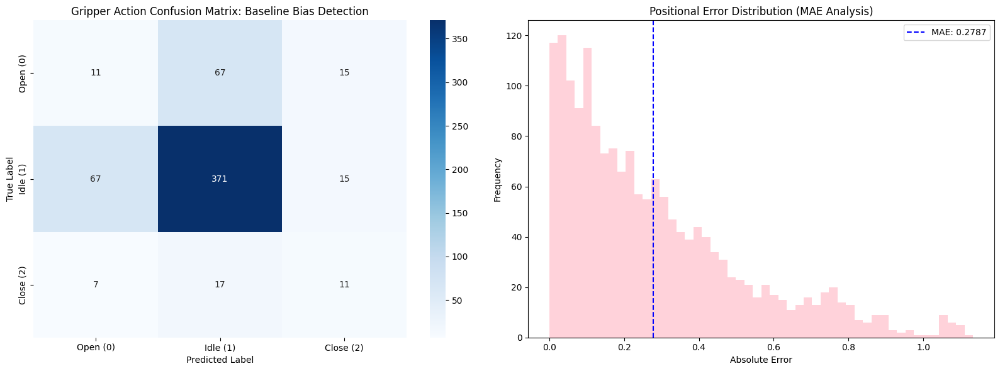

HOLISTIC PERFORMANCE ANALYSIS
------------------------------
1. [Regression] Mean Absolute Error (MAE): 0.05542
2. [Classification] Macro F1-Score: 0.40690
----------------------------------------


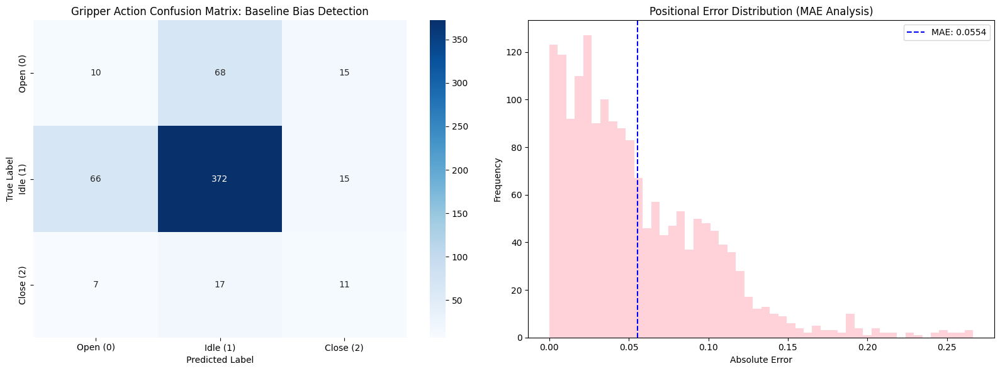

HOLISTIC PERFORMANCE ANALYSIS
------------------------------
1. [Regression] Mean Absolute Error (MAE): 0.05542
2. [Classification] Macro F1-Score: 0.40690
----------------------------------------


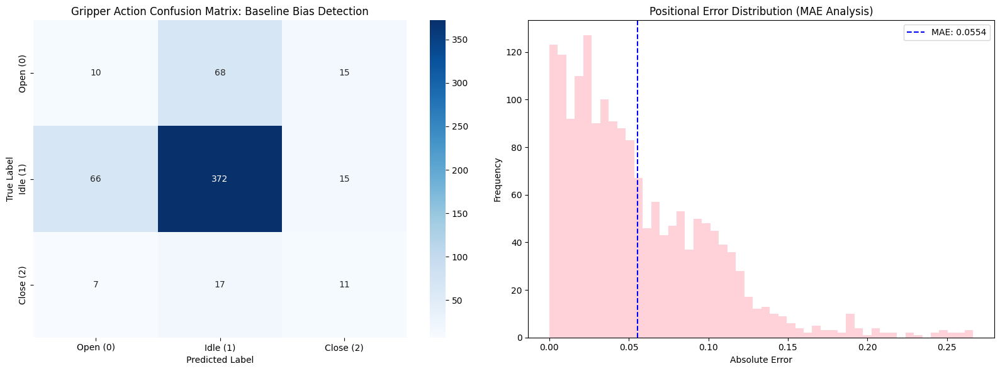

In [ ]:
class OverfittingAssessment(BaseModel):
    """Class to handle regularisation and prevent overfitting"""
    def __init__(self, image_encoder, obs_encoder, dense, norm, dropout_p: float = 0.2):
        super().__init__()
        self.image_encoder = image_encoder
        self.obs_encoder = obs_encoder

        self.norm = norm # set as variable for comparison
        self.dropout = nn.Dropout(dropout_p)

        self.dense = dense

    def forward(self, images: torch.Tensor, obs: torch.Tensor) -> dict:
        img_enc = self.image_encoder(images)
        obs_enc = self.obs_encoder(obs)

        # Fusion logic
        fused = torch.cat([img_enc, obs_enc], dim=-1)
        fused = self.norm(fused)
        fused = self.dropout(fused)

        dense_out = self.dense(fused)
        dense_out = dense_out #  * 0.05 # Keep your scaling fix

        return {"pos": dense_out[:, 0:3], "grp": dense_out[:, 3:]}

    def reset(self, image_encoder_kwargs, obs_encoder_kwargs, dense_kwargs):
        # Delegate reset to sub-modules as in Baseline1
        self.image_encoder.reset(**image_encoder_kwargs)
        self.obs_encoder.reset(**obs_encoder_kwargs)
        self.dense.reset(**dense_kwargs)

        # Manually reset LayerNorm parameters
        if type(self.norm) == nn.LayerNorm:
            self.norm.reset_parameters()


cnn2_config = ConvolutionLayersConfig(
    input_dim=224,
    input_channels=2,
    layers=[
        nn.Conv2d(
            in_channels=2,
            out_channels=8,
            kernel_size=(3,3),
            stride=1,
            padding=1,
            dilation=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=8,
            out_channels=16,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=16,
            out_channels=32,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2))
        ]
    )

_cnn_output_dim = cnn2_config.get_output_dims()
_cnn_output_channels = cnn2_config.get_output_channels()
_mlp_input_dim = int(
            (_cnn_output_dim[-1]*_cnn_output_dim[-1])*_cnn_output_channels[-1]
            )


image_encoder = JointCNNEncoder(
    cnn=CNN(cnn2_config),
    dense=MLP(
        input_dim=_mlp_input_dim,
        hidden_dims=[256],
        output_dim=128
        )
)

obs_encoder = MLP(
    input_dim = 15,
    hidden_dims = [256,256],
    output_dim = 128
)

dense = MLP(
    input_dim = 256,
    hidden_dims = [64,32],
    output_dim = 6
)

norm = nn.LayerNorm(256)
no_norm = nn.Identity()
# breakpoint()
overfit_model = OverfittingAssessment(
    image_encoder=image_encoder,
    obs_encoder=obs_encoder,
    dense=dense,
    norm=no_norm
)
overfit_no_dropout = OverfittingAssessment(
    image_encoder=image_encoder,
    obs_encoder=obs_encoder,
    dense=dense,
    norm=no_norm,
    dropout_p=0.0
)
norm_no_dropout = OverfittingAssessment(
    image_encoder=image_encoder,
    obs_encoder=obs_encoder,
    dense=dense,
    norm=norm,
    dropout_p=0.0
)

norm_dropout = OverfittingAssessment(
    image_encoder=image_encoder,
    obs_encoder=obs_encoder,
    dense=dense,
    norm=norm,
    dropout_p=0.2
)

trainModel(overfit_model)
trainModel(overfit_no_dropout)
trainModel(norm_no_dropout)
trainModel(norm_dropout)
getLatestEvals(overfit_model)
getLatestEvals(overfit_no_dropout)
getLatestEvals(norm_no_dropout)
getLatestEvals(norm_dropout)

---
#### $\color{Red}{Question\ 1.c.ii.iii}$ Experiment 3 discussion (10 marks)
##### Description: weighted sampling with dataloaders
##### Justification:
##### Conclusion:

$\color{red}{Response:}$ (Maximum 800 words in text)

Description: Architectural change: Adding a gating mechanism to the first layer of in the dense network

Justification: Guided by our previous experiment, the objective of this one was to enrich the model's understanding of the latent space. Our first instinct was to use an attention mechanism, but that would be both ineffective as we have 1 vector of scalars rather than a vector of tokens, and also likely to need much more data in terms of its quantity and variety to be useful. However applying a gating mechanism could prove useful. It is similar conceptually to a residual link, where instead of adding the new layer to the previous one, it multiplies each element of the previous layer by its corresponding scalar in the next layer. This could be seen as a form of attention as it looks at the context of a certain finding, and uses that to determine how significant a certain latent feature is. We would hope that this is the key to improving the model's deeper understanding even further.

Conclusion: The gating mechanism proved very useful - but the results without gating were surprising. The models were identical in every manner except one used the learned gating mechanism to scale the latent space, and the other applied an identity before the dense network. The results in the first case are incredibly surprising: ~14 for the MAE and ~0.25 for the Macro F1 score. Despite this, the Macro F1 score in our gating mechanism was the highest we'd ever seen in all of our experiments: 0.61. And the MAE was around 0.058, which was very encouraging. So even though the comparison seems a bit strange, this experiment shows that applying a gating mechanism is very significant in the design of our final experiment.


INFO:cw2_logger:Running epochs: 10
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:12<00:00, 26.32it/s]
INFO:cw2_logger:epoch 1	 training loss : 1.283203125
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 1	 validation loss : 0.68310546875 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:11<00:00, 26.64it/s]
INFO:cw2_logger:epoch 2	 training loss : 0.31689453125
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 2	 validation loss : 1.109375 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:12<00:00, 25.54it/s]
INFO:cw2_logger:epoch 3	 training loss : 0.21240234375
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 3	 validation loss : 1.1005859375 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:12<00:00, 25.89it/s]
INFO:cw2_logger:epoch 4	 training loss : 0.1630859375
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 4	 validation loss : 1.3720703125 
INFO:cw2_logger:Running tra

epoch_train_loss,█▂▂▂▁▁▁▁▁▁
epoch_val_loss,▁▄▃▅▄███▇▆
grp_train_loss,▆▅▂▂▂▁▂▁▁▁▁▁▁▁▁▁▂▁▁▁▅▁▁▁▁▁▁▁▂▃▁▁▁▁▁▁▁█▃▁
grp_val_loss,▁▁▁▁▁▁▂▁▂▁▁▁▁▆▁▁▂▁▁▁▁▃▁▁▅▅▁▁█▂▁▁▁▅▃▁▁▁▁▁
pos_train_loss,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
pos_val_loss,▆▄▁▅▃▁▁▁▁▆▄▁▃▃▆▅▅▄▃▇▁▇▃▁▂▂▁▂▂▅██▁▂▂▃▃▂▃▁
epoch_train_loss,0.06476
epoch_val_loss,1.5166
grp_train_loss,0.05869
grp_val_loss,0.00126
pos_train_loss,0.00246


INFO:cw2_logger:Running epochs: 10
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:14<00:00, 22.45it/s]
INFO:cw2_logger:epoch 1	 training loss : 0.73779296875
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 1	 validation loss : 0.56982421875 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:14<00:00, 22.49it/s]
INFO:cw2_logger:epoch 2	 training loss : 0.463623046875
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 2	 validation loss : 0.55517578125 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:14<00:00, 22.02it/s]
INFO:cw2_logger:epoch 3	 training loss : 0.335693359375
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 3	 validation loss : 0.7587890625 
INFO:cw2_logger:Running training epoch
100%|██████████| 319/319 [00:14<00:00, 22.13it/s]
INFO:cw2_logger:epoch 4	 training loss : 0.285400390625
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 4	 validation loss : 0.80615234375 
INFO:cw2_logger

epoch_train_loss,█▅▄▃▂▂▂▁▁▁
epoch_val_loss,▁▁▂▂▃▃█▄▅▃
grp_train_loss,▂▂▂▁▁▁▂▂▂█▁▃▁▁▂▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▂▁▁▁▁▁▁▁▃▃
grp_val_loss,▁▂▁▂▁▁█▁▁▁▁▁▁▁▁▁▁▁▂▃▁▂▁▂▁▁▁▁▁▁▁▅▁▁▁▁▁▅▁▂
pos_train_loss,▁▂▁▂▆▁▂▁▅▂▁▂▂▂▄▄▁▁▂▃█▃▁▃▂▄▂▁▁▁▂▁▁▁▂▂▁▁▂▁
pos_val_loss,▁▂▁▁▂▁▂▁▁▂▁▁▁▁▁▂▁▁▁▁▁▁█▄▂▂▁▁▁▁▁▁▁▁▁▁▂▁▁▁
epoch_train_loss,0.10101
epoch_val_loss,1.13281
grp_train_loss,0.03069
grp_val_loss,0
pos_train_loss,0.00456


HOLISTIC PERFORMANCE ANALYSIS
------------------------------
1. [Regression] Mean Absolute Error (MAE): 14.52235
2. [Classification] Macro F1-Score: 0.24893
----------------------------------------


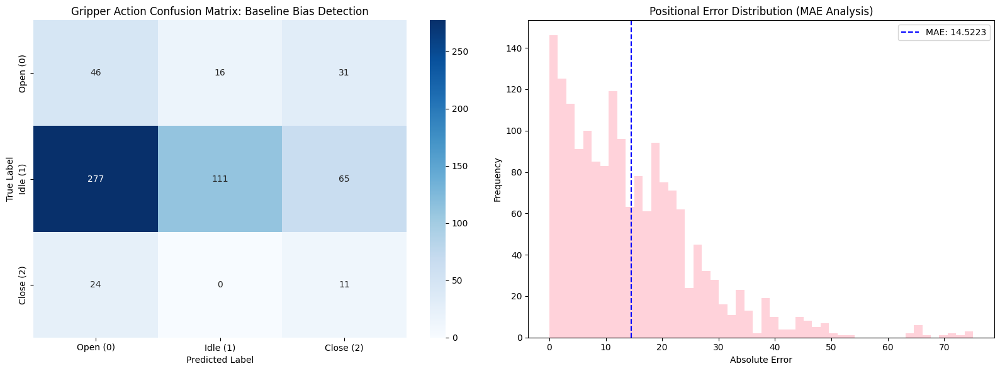

HOLISTIC PERFORMANCE ANALYSIS
------------------------------
1. [Regression] Mean Absolute Error (MAE): 0.05799
2. [Classification] Macro F1-Score: 0.61445
----------------------------------------


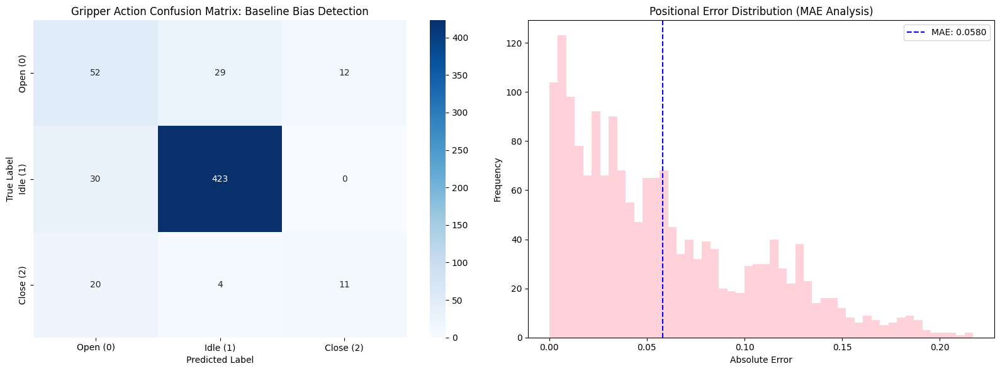

In [ ]:
torch.manual_seed(42) # Changing class imbalance by setting classifications to class weights: Fix lack of learning
cnn2_config = ConvolutionLayersConfig(
    input_dim=224,
    input_channels=2,
    layers=[
        nn.Conv2d(
            in_channels=2,
            out_channels=8,
            kernel_size=(3,3),
            stride=1,
            padding=1,
            dilation=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=8,
            out_channels=16,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=16,
            out_channels=32,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2))
        ]
    )

_cnn_output_dim = cnn2_config.get_output_dims()
_cnn_output_channels = cnn2_config.get_output_channels()
_mlp_input_dim = int(
            (_cnn_output_dim[-1]*_cnn_output_dim[-1])*_cnn_output_channels[-1]
            )

class SimpleGatedFusion(nn.Module):
    def __init__(self, input_dim, dropout_p=0.2):
        super().__init__()
        self.LayerNorm = nn.LayerNorm(input_dim)
        self.gate = nn.Linear(input_dim, input_dim)
        self.sigmoid = nn.Sigmoid()
        self.dropout = nn.Dropout(dropout_p)

    def forward(self, x):
        # breakpoint()
        x = self.LayerNorm(x)
        g = torch.relu(self.gate(x))       # reduce + nonlinearity
        g = self.dropout(g)                 # random regularization
        out = x * g
        return out

class FusionModel(BaseModel):
    def __init__(self, image_encoder, obs_encoder, fusion, head):
        super().__init__()
        self.image_encoder = image_encoder
        self.obs_encoder = obs_encoder
        self.fusion = fusion
        self.head = head

    def forward(self, images, obs):
        img = self.image_encoder(images)
        obs = self.obs_encoder(obs)

        fused = torch.cat([img, obs], dim=-1)
        fused = self.fusion(fused)
        out = self.head(fused)
        # breakpoint()
        vals = {
            "pos": out[:,:3],
            "grp": out[:,3:]
        }
        return vals

    def reset(
      self,
      image_encoder_kwargs,
      obs_encoder_kwargs,
      dense_kwargs
      ):
        self.image_encoder.reset(**image_encoder_kwargs)
        self.obs_encoder.reset(**obs_encoder_kwargs)
        # breakpoint()
        self.head.reset(**dense_kwargs)

gate = SimpleGatedFusion(256)
id = nn.Identity()

image_encoder = JointCNNEncoder(
    cnn=CNN(cnn2_config),
    dense=MLP(
        input_dim=_mlp_input_dim,
        hidden_dims=[256],
        output_dim=128
        )
)

obs_encoder = MLP(
    input_dim = 15,
    hidden_dims = [256,256],
    output_dim = 128
)

dense = MLP(
    input_dim = 256,
    hidden_dims = [64,32],
    output_dim = 6
)

no_gate_model = FusionModel(image_encoder, obs_encoder, id, dense)
gate_model = FusionModel(image_encoder, obs_encoder, gate, dense)
trainModel(no_gate_model)
trainModel(gate_model)
getLatestEvals(no_gate_model)
getLatestEvals(gate_model)

---

## Question 2 Self-supervised pretraining with VAEs

This question requires you to implement a self-supervised approach using a VAE architecture. The focus of question 2 is in developing a VAE model without using __any__ supervised information i.e., without using any action information. You will assess the convergence of the model and the suitability of the learnt latent space. You are required to select and appropriate architecture/loss function/target set of observations to perform self-supervised learning over.

__IMPORTANT__: Do not use any of the __action__ information. You will be awarded 0 marks if you do.

### $\color{Red}{Question\ 2.a}$ Self-supervised VAE model (5 marks)

##### Task
- Implement the full model training process and model definiton in the code block below. Markers should be able to retrain your model by running the cell below. You may however, reference previously defined objects (e.g., loaded data and use previously defined functions).

$\color{red}{Response:}$ (Maximum 200 words in text)

The VAE consists of an encoder and decoder. The encoder consists of 5 convolution blocks followed by ReLU activations (to mitigate the issue of vanishing gradients often found with saturating activation functions). The spatial size is decreased at each convolutional layer by order of 2 by applying $4 \times 4$ convolution with stride $2$. On the other hand the number of filters is doubled at each layer (starting at 32 up to 256). The decoder consists of 5 transposed convolution blocks again followed by ReLU activations. The decoder mirrors the encoder in reverse. At each layer, the spatial resolution doubles while the number of filters is reduced by half. Since the model uses ReLU activations He initialization was used for the weights to prevent exploding gradient issues during the initial stages of training. The trainig objective was chosen to be the common ELBO (even though $\beta$-VAE models were also considered see next section) i.e.

$$\mathcal{L}(x;\phi, \theta) = \mathbb{E}_{q(z|x)}[\log p(x|z)] - KL(q(z|x) \parallel p(z))$$

where where the first term represents the reconstruction error and the second term acts as a regularization. In this implementation the reconstruction error is equivalent to the Mean Squared Error and given that the prior is assumed to be a standard Gaussian the KL divergence term reduces to

$$KL(\mathcal{N}(\mu,\sigma^2) \parallel \mathcal{N}(0,I)) = -\frac{1}{2}(1 + \log(\sigma^2) - \mu^2 - \sigma^2)$$

for each reconstruction.Only visual observations were used to train the VAE; no action labels were accessed at any stage to ensure that the representation is learned in a strictly self-supervised manner. While proprioceptive signals may be incorporated into self-supervised representation learning, they were omitted in this implementation to avoid learning latent representations aligned with joint configurations to encourage abstraction from raw observations.

## Dataset Shape

In [ ]:
for x in train_dataloader:
  print(x.input['images'].shape)
  print(x.input['obs'].shape)
  break

torch.Size([64, 2, 224, 224])
torch.Size([64, 15])


## Imports

In [ ]:
import torch.nn.functional as F
from typing import Tuple
from tqdm.notebook import tqdm
import wandb
from google.colab import userdata
import numpy as np
import matplotlib.pyplot as plt
import torch.optim.lr_scheduler as lr_scheduler

## Wandb Config

In [ ]:
# wandb.login(key=userdata.get('wandb_api_key'))

## PyTorch Config

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## Define Plotting

In [ ]:
def show_vae_reconstructions(model, loader, device="cuda", n: int = 4, seed: int = 42):
    """
    Select random images and plot reconstructions as compared to originals.

    Assumes images are already in [0, 1].
    """
    model.eval()
    model.to(device)

    def _extract_two_channel_images(batch):
        if not hasattr(batch, "input"):
            raise AttributeError("Batch has no attribute 'input'. Expected batch.input['images'].")
        if "images" not in batch.input:
            raise KeyError("batch.input does not contain key 'images'.")

        imgs = batch.input["images"]

        if torch.is_tensor(imgs):
            if imgs.dim() != 4 or imgs.size(1) != 2:
                raise ValueError(f"Expected images tensor with shape [B,2,H,W], got {tuple(imgs.shape)}.")
            return imgs

        if isinstance(imgs, (tuple, list)) and len(imgs) == 2:
            img1, img2 = imgs
            if img1.dim() == 3:
                img1 = img1.unsqueeze(1)
            if img2.dim() == 3:
                img2 = img2.unsqueeze(1)
            return torch.cat([img1, img2], dim=1)

        raise TypeError("Unsupported format for batch.input['images'].")

    batch = next(iter(loader))
    x_full = _extract_two_channel_images(batch).to(device, non_blocking=True)

    with torch.no_grad():
        recon_full, _, _ = model(x_full)

    recon_full = recon_full.clamp(0.0, 1.0)

    B = x_full.size(0)
    n = min(n, B)

    # Reproducible random indices
    g = torch.Generator(device=x_full.device)
    g.manual_seed(seed)
    idx = torch.randperm(B, generator=g, device=x_full.device)[:n]

    x = x_full[idx].detach().cpu()
    recon = recon_full[idx].detach().cpu()

    fig, axs = plt.subplots(nrows=n, ncols=4, figsize=(12, 3 * n))
    if n == 1:
        axs = [axs]

    titles = ["Front Camera Original", "Front Camera Reconstruction", "Mount Camera Original", "Mount Camera Reconstruction"]

    for i in range(n):
        imgs_row = [x[i, 0], recon[i, 0], x[i, 1], recon[i, 1]]
        for j in range(4):
            ax = axs[i][j] if n > 1 else axs[0][j]
            ax.imshow(imgs_row[j], cmap="gray", vmin=0.0, vmax=1.0)
            ax.axis("off")
            if i == 0:
                ax.set_title(titles[j])

    plt.tight_layout()
    plt.show()

## Define VAE Model

In [ ]:
class ImageVAE(nn.Module):
    """
    Variational Autoencoder for training examples consisting of two grayscale images (224x224 each).

    Expected input:
        x: Tensor of shape [B, 2, 224, 224]
           where x[:, 0] is image A and x[:, 1] is image B.

    Output:
        recon:  Tensor of shape [B, 2, 224, 224]
        mu:     Tensor of shape [B, latent_dim]
        logvar: Tensor of shape [B, latent_dim]
    """
    def __init__(self, weight_init_strategy=None, latent_dim: int = 64):
        super().__init__()
        self.latent_dim = latent_dim

        # 224 -> 112 -> 56 -> 28 -> 14 -> 7
        self.encoder = nn.Sequential(
            nn.Conv2d(2, 32, kernel_size=4, stride=2, padding=1),  # [B, 32, 112, 112]
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1), # [B, 64, 56, 56]
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),# [B, 128, 28, 28]
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),# [B, 256, 14, 14]
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=4, stride=2, padding=1),# [B, 256, 7, 7]
            nn.BatchNorm2d(256),
            nn.ReLU(),
        )

        self.enc_out_channels = 256
        self.enc_out_spatial = 7
        enc_flat_dim = self.enc_out_channels * self.enc_out_spatial * self.enc_out_spatial  # 256*7*7 = 12544

        self.fc_enc = nn.Linear(enc_flat_dim, 512)
        self.fc_mu = nn.Linear(512, latent_dim)
        self.fc_logvar = nn.Linear(512, latent_dim)

        # Decoder: 7 -> 14 -> 28 -> 56 -> 112 -> 224
        self.fc_dec = nn.Linear(latent_dim, 512)
        self.fc_unflatten = nn.Linear(512, enc_flat_dim)

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1), # [B, 128, 14, 14]
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  # [B, 64, 28, 28]
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),   # [B, 32, 56, 56]
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 16, kernel_size=4, stride=2, padding=1),   # [B, 16, 112, 112]
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.ConvTranspose2d(16, 2, kernel_size=4, stride=2, padding=1),    # [B, 2, 224, 224]
            nn.Sigmoid(),
        )

        if weight_init_strategy == 'he':
          self.apply(self._init_weights_he)

    @staticmethod
    def _init_weights_he(m: nn.Module):
        """
        He/Kaiming initialization for Conv2d / ConvTranspose2d / Linear layers.
        Biases initialized to 0.
        """
        if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.Linear)):
            nn.init.kaiming_normal_(m.weight, mode="fan_in", nonlinearity="relu")
            if m.bias is not None:
                nn.init.zeros_(m.bias)


    @staticmethod
    def reparameterize(mu: torch.Tensor, logvar: torch.Tensor) -> torch.Tensor:
        logvar = torch.clamp(logvar, -20, 20)
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def encode(self, x: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor]:
        h = self.encoder(x)
        h = torch.flatten(h, start_dim=1)
        h = F.relu(self.fc_enc(h), inplace=True)
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        return mu, logvar

    def decode(self, z: torch.Tensor) -> torch.Tensor:
        h = F.relu(self.fc_dec(z), inplace=True)
        h = F.relu(self.fc_unflatten(h), inplace=True)
        h = h.view(-1, self.enc_out_channels, self.enc_out_spatial, self.enc_out_spatial)
        return self.decoder(h)

    def forward(self, x: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        recon = self.decode(z)
        return recon, mu, logvar

## Define Loss

In [ ]:
def vae_loss(reconstructed_images: torch.Tensor, target_images: torch.Tensor, mu: torch.Tensor, logvar: torch.Tensor,
             reconstruction_loss: str = "mse", beta: float = 1.0) -> Tuple[torch.Tensor, dict]:
    """
    VAE loss = reconstruction loss + beta * KL divergence.

    reconstructed_images, target_images: [B, 2, 224, 224]
    mu, logvar: [B, latent_dim]
    """

    logvar = torch.clamp(logvar, -20, 20)

    if reconstruction_loss == "mse":
        rec = F.mse_loss(reconstructed_images, target_images, reduction="sum")
    elif reconstruction_loss == "bce":
        # only makes sense if x is in [0,1] and reconstruction uses sigmoid
        rec = F.binary_cross_entropy(reconstructed_images, target_images, reduction="sum")
    else:
        raise ValueError("recon_loss must be 'mse' or 'bce'")

    # KL divergence to N(0, I)
    kl = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

    loss = rec + beta * kl
    return loss, {"reconstruction_error": rec.detach(), "kl": kl.detach()}

## Experiment

### Experiment Config

In [ ]:
experiment_config = dict(
    epochs=20,
    batch_size=64,
    learning_rate=0.001,
    lr_scheduler='reduce_lr_on_plateau',
    lr_scheduler_config = {
        'factor': 0.1,
        'patience': 2
    },
    latent_dim=64,
    weight_init='he',
    clip_gradient_norm=1
)

### Experiment Pipeline

In [ ]:
import torch.nn.functional as F
from typing import Tuple
from tqdm.notebook import tqdm
import wandb
from google.colab import userdata
import numpy as np
import matplotlib.pyplot as plt
import torch.optim.lr_scheduler as lr_scheduler

# ******* INSERT YOUR CODE HERE *******
def make_vae_pipeline_components(config, device):

  if config['weight_init'] is not None:
    model = ImageVAE(weight_init_strategy=config['weight_init'], latent_dim=config['latent_dim']).to(device)
  else:
    model = ImageVAE(latent_dim=config['latent_dim']).to(device)

  train_loader = DataLoader(
    train_dataset,
    batch_size=config['batch_size'],
    shuffle=True,
    collate_fn=collate_func
  )

  val_loader = DataLoader(
    val_dataset,
    batch_size=config['batch_size'],
    shuffle=False,
    collate_fn=collate_func
  )

  optimizer = torch.optim.Adam(model.parameters(), lr=config['learning_rate'])

  return model, train_loader, val_loader, optimizer

def train_vae(model, train_loader, val_loader, optimizer, config):
  wandb.watch(model, log='all', log_freq=10)

  history = {
      'train_loss': [],
      'val_loss': [],
      'train_recon': [],
      'val_recon': [],
      'train_kl': [],
      'val_kl': []
  }

  if config['lr_scheduler'] == 'linear':

    start_factor = config['lr_scheduler_config']['start_factor']
    end_factor = config['lr_scheduler_config']['end_factor']
    total_iters = config['lr_scheduler_config']['total_iters']

    scheduler = lr_scheduler.LinearLR(optimizer, start_factor=start_factor, end_factor=end_factor, total_iters=total_iters)
  elif config['lr_scheduler'] == 'reduce_lr_on_plateau':
    factor = config['lr_scheduler_config']['factor']
    patience = config['lr_scheduler_config']['patience']

    scheduler = lr_scheduler.ReduceLROnPlateau(optimizer=optimizer, mode='min', factor=factor, patience=patience)
  else:
    scheduler = None

  for epoch in tqdm(range(config['epochs']), desc='Epoch loop'):

    running_train_losses = []
    running_val_losses = []

    running_train_reconstruction_errors = []
    running_val_reconstruction_errors = []

    running_train_kls = []
    running_val_kls = []

    model.train()

    for batch in tqdm(train_loader, desc='Training loop', leave=False):

      train_images = batch.input['images'].to(device)

      reconstructed_train_images, train_mu, train_logvar = model(train_images)

      train_loss, train_loss_components = vae_loss(reconstructed_train_images, train_images, train_mu, train_logvar)

      running_train_losses.append(train_loss.item())

      running_train_reconstruction_errors.append(train_loss_components['reconstruction_error'].item())

      running_train_kls.append(train_loss_components['kl'].item())

      optimizer.zero_grad()
      train_loss.backward()

      if config['clip_gradient_norm'] is not None:
        torch.nn.utils.clip_grad_norm_(model.parameters(), config['clip_gradient_norm'])

      optimizer.step()

    model.eval()

    with torch.no_grad():
      for batch in tqdm(val_loader, desc='Validation loop', leave=False):
        val_images = batch.input['images'].to(device)

        reconstructed_val_images, val_mu, val_logvar = model(val_images)

        val_loss, val_loss_components = vae_loss(reconstructed_val_images, val_images, val_mu, val_logvar)

        running_val_losses.append(val_loss.item())

        running_val_reconstruction_errors.append(val_loss_components['reconstruction_error'].item())

        running_val_kls.append(val_loss_components['kl'].item())

    epoch_train_loss = np.mean(running_train_losses)
    epoch_val_loss = np.mean(running_val_losses)

    epoch_train_reconstruction_error = np.mean(running_train_reconstruction_errors)
    epoch_val_reconstruction_error = np.mean(running_val_reconstruction_errors)

    epoch_train_kl = np.mean(running_train_kls)
    epoch_val_kl = np.mean(running_val_kls)

    history['train_loss'].append(epoch_train_loss)
    history['val_loss'].append(epoch_val_loss)
    history['train_recon'].append(epoch_train_reconstruction_error)
    history['val_recon'].append(epoch_val_reconstruction_error)
    history['train_kl'].append(epoch_train_kl)
    history['val_kl'].append(epoch_val_kl)

    wandb.log({'epoch_train_loss': epoch_train_loss,
               'epoch_val_loss': epoch_val_loss,
               'epoch_train_reconstruction_error':epoch_train_reconstruction_error,
               'epoch_val_reconstruction_error': epoch_val_reconstruction_error,
               'epoch_train_kl':epoch_train_kl,
               'epoch_val_kl': epoch_val_kl},
               step=epoch)

    if config['lr_scheduler'] == 'linear':
      scheduler.step()
    elif config['lr_scheduler'] == 'reduce_lr_on_plateau':
      scheduler.step(epoch_train_loss)

  return history

def run_vae_training_pipeline(hyperparameters, device):
  with wandb.init(project='image-vae', config=hyperparameters):
    config = wandb.config

    model, train_loader, val_loader, optimizer = make_vae_pipeline_components(config, device)

    history = train_vae(model, train_loader, val_loader, optimizer, config)

    wandb.unwatch(model)

    show_vae_reconstructions(model, val_loader, device, n=5, seed=2)

    return model, train_loader, val_loader, optimizer, history


# ******* INSERT YOUR CODE HERE - END *******


Epoch loop:   0%|          | 0/20 [00:00<?, ?it/s]

Training loop:   0%|          | 0/398 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/46 [00:00<?, ?it/s]

Training loop:   0%|          | 0/398 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/46 [00:00<?, ?it/s]

Training loop:   0%|          | 0/398 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/46 [00:00<?, ?it/s]

Training loop:   0%|          | 0/398 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/46 [00:00<?, ?it/s]

Training loop:   0%|          | 0/398 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/46 [00:00<?, ?it/s]

Training loop:   0%|          | 0/398 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/46 [00:00<?, ?it/s]

Training loop:   0%|          | 0/398 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/46 [00:00<?, ?it/s]

Training loop:   0%|          | 0/398 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/46 [00:00<?, ?it/s]

Training loop:   0%|          | 0/398 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/46 [00:00<?, ?it/s]

Training loop:   0%|          | 0/398 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/46 [00:00<?, ?it/s]

Training loop:   0%|          | 0/398 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/46 [00:00<?, ?it/s]

Training loop:   0%|          | 0/398 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/46 [00:00<?, ?it/s]

Training loop:   0%|          | 0/398 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/46 [00:00<?, ?it/s]

Training loop:   0%|          | 0/398 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/46 [00:00<?, ?it/s]

Training loop:   0%|          | 0/398 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/46 [00:00<?, ?it/s]

Training loop:   0%|          | 0/398 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/46 [00:00<?, ?it/s]

Training loop:   0%|          | 0/398 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/46 [00:00<?, ?it/s]

Training loop:   0%|          | 0/398 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/46 [00:00<?, ?it/s]

Training loop:   0%|          | 0/398 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/46 [00:00<?, ?it/s]

Training loop:   0%|          | 0/398 [00:00<?, ?it/s]

Validation loop:   0%|          | 0/46 [00:00<?, ?it/s]

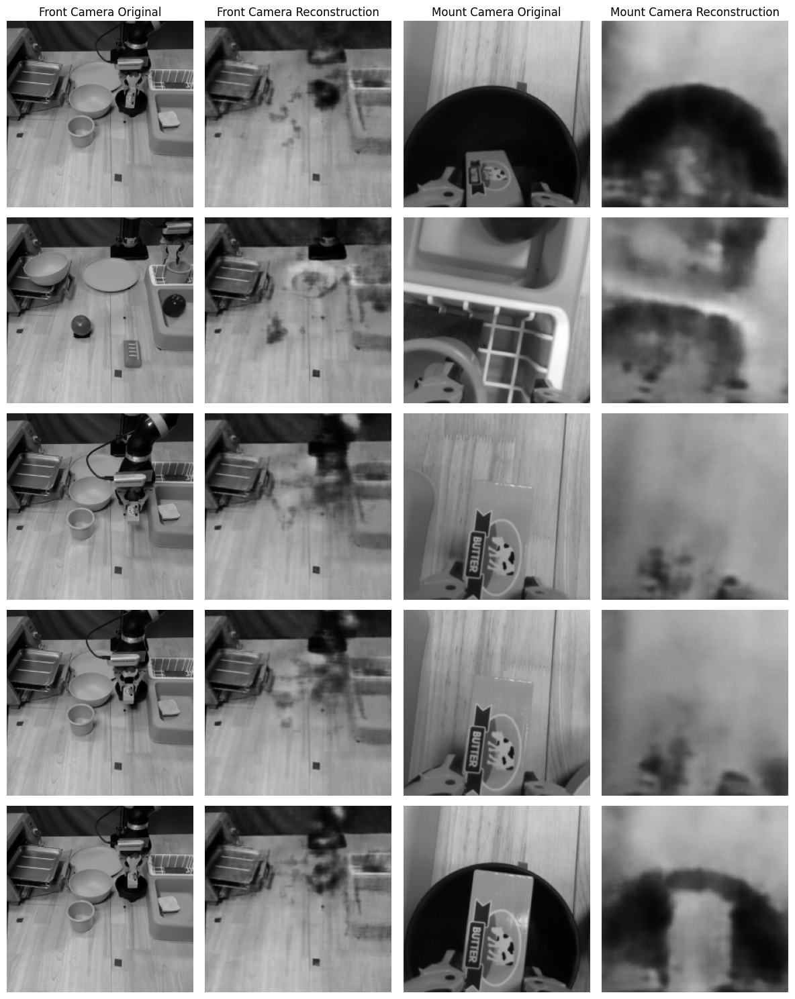

epoch_train_kl,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch_train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch_train_reconstruction_error,█▄▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch_val_kl,███▇▇▇▆▆▅▄▄▃▂▂▃▂▂▂▁▁
epoch_val_loss,█▅▃▃▂▃▂▂▁▂▁▂▂▁▂▂▁▁▂▂
epoch_val_reconstruction_error,█▄▃▃▂▂▂▁▁▂▁▂▂▂▂▂▁▁▂▂
epoch_train_kl,3931.378
epoch_train_loss,23335.54627
epoch_train_reconstruction_error,19404.16824
epoch_val_kl,3689.68272
epoch_val_loss,53438.79983


In [ ]:
trained_vae, train_loader, val_loader, optimizer, history = run_vae_training_pipeline(experiment_config, device)

### Plot Reconstructions

#### Validation set

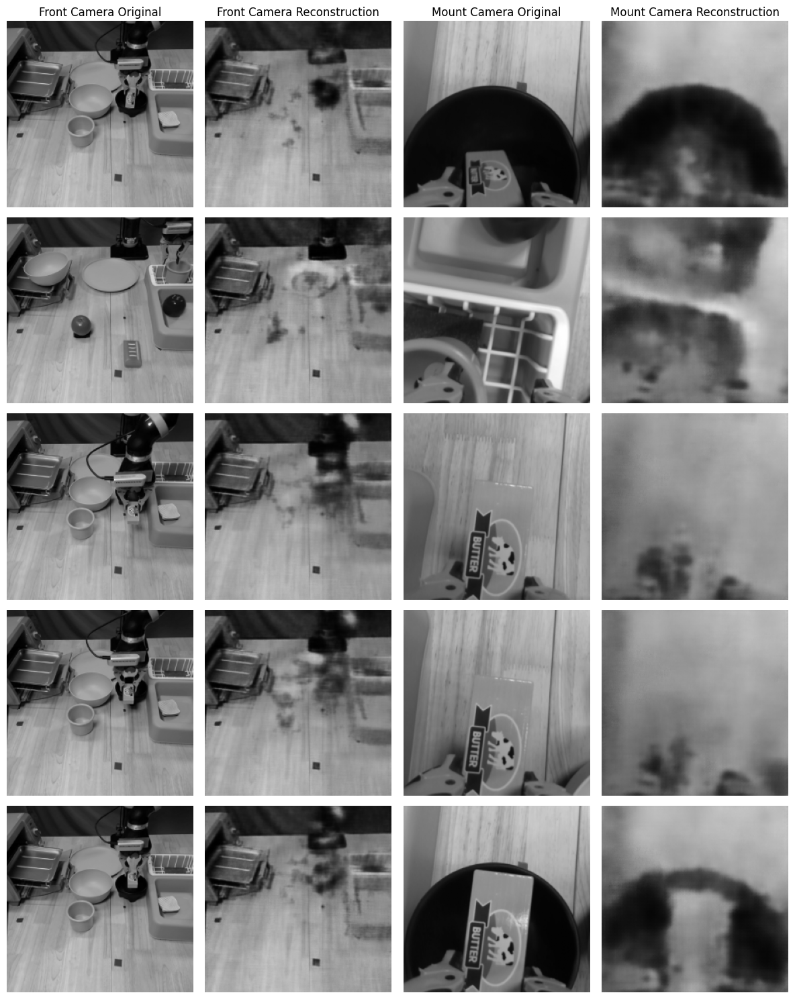

In [ ]:
show_vae_reconstructions(trained_vae, val_loader, device, n=5, seed=2)

#### Training set

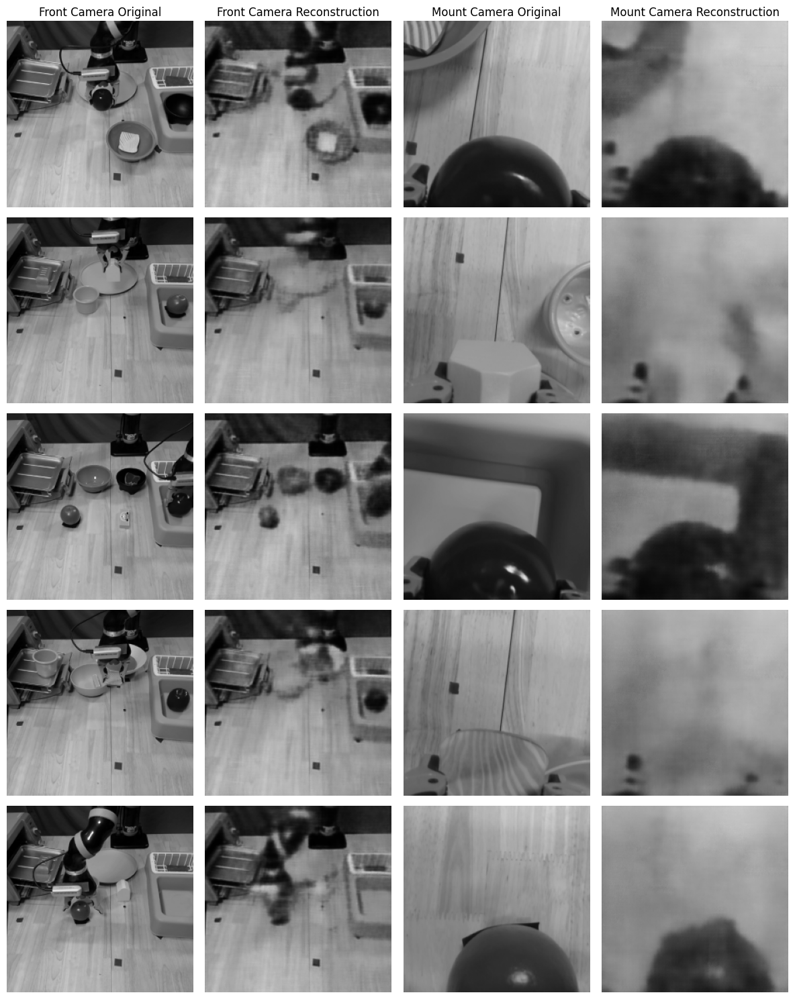

In [ ]:
show_vae_reconstructions(trained_vae, train_loader, device, n=5, seed=2)

## Save Model - Optional

In [ ]:
#torch.save(trained_vae.state_dict(), '/content/drive/MyDrive/model_weights/final_model.pth')

---
### $\color{Red}{Question\ 2.b}$ Model convergence (12 marks)

##### Task
- Provide empirical evidence (in the form of appropriate training/validation metrics) supporting **why** the model is appropriately trained;
- Interpret why the metrics demonstrate that the model has converged. If your model has **not** converged, interpret why the metrics suggest so.

$\color{red}{Response:}$ (Maximum 900 words in text)

`[Pls use this markdown cell to provide your textual Reponse]`

### Training Methodology
VAE training was conducted for $20$ epochs using a batch size of $64$ and a learning rate of $0.001$. To improve training stability and convergence speed, batch normalization was applied after each convolutional and fully connected layer. During the early stages of training, the log-variance term (logvar) occasionally exhibited numerical instability (i.e. overflow due to large values in the exponential term of the KL divergence); therefore, it was clamped to the range $[−20,20]$. The Adam optimizer yielded the best empirical performance and was used for all reported results. A latent dimensionality of $64$ was selected, as larger latent spaces provided only marginal improvements, indicating diminishing returns.

### Architecture experiments
Multiple VAE architectures were evaluated. Initially,
$\beta$-VAE with $\beta$ annealing was investigated. This training approach progressively increased the weight of the KL-divergence term during training, encouraging the model to prioritize reconstruction accuracy in the early epochs and to emphasize latent regularization toward the end of training. However, this approach did not yield a meaningful performance gain, and the added complexity was therefore not warranted.
Subsequently, deeper ResNet-inspired variants were explored, but their training computational cost proved impractical (especially with the free tier GPUs). Overall, the architecture described above provided the most effective trade-off between training feasibility and performance.

### Convergence
There are several aspects that need to be taken into account when assessing a model convergence i.e.

- **Validation and training loss**: can inform hyperparameter selection; for example, highly erratic training loss may indicate an excessively large learning rate and impaired convergence. They also provide insight into model capacity (e.g., whether the model can overfit the training set) and may suggest when optimization has converged to a local minimum. Moreover, they support model selection and are commonly used to detect overfitting by comparing training and validation performance.

- **KL divergence**: This metric provides an indication of how effectively the latent space is regularized and structured, reflecting the extent to which the learned posterior aligns with the prior over the course of training and validation.

- **Validation and training reconstruction loss**: This metric directly reflects reconstruction fidelity, providing a quantitative measure of how accurately the model can reproduce the input data during training and validation.

- **Gradients**: determine the slope of the loss function with respect to the weights thus as optimization approaches a (local) optimum, gradient magnitudes are expected to decrease systematically, reflecting diminishing parameter updates and convergence.

#### Interpreting training metrics
The model was trained for $20$ epochs (Figure 1). The validation loss decreases most sharply during the first five epochs, after which the rate of improvement diminishes and the curve gradually plateaus at approximately $60,000$. In comparison, the training loss is smoother (suggesting stable learning and appropriately chosen hyperparameters) and attains lower values, as expected. No evidence of overfitting is observed, as the validation loss does not increase over the course of training. In addition, both the KL-divergence and reconstruction-loss components decline steadily, indicating that the model maintains an effective balance between regularization and reconstruction objectives. Overall, the flattening of the validation-loss curve toward the end of training suggests that the model has converged with respect to this metric.

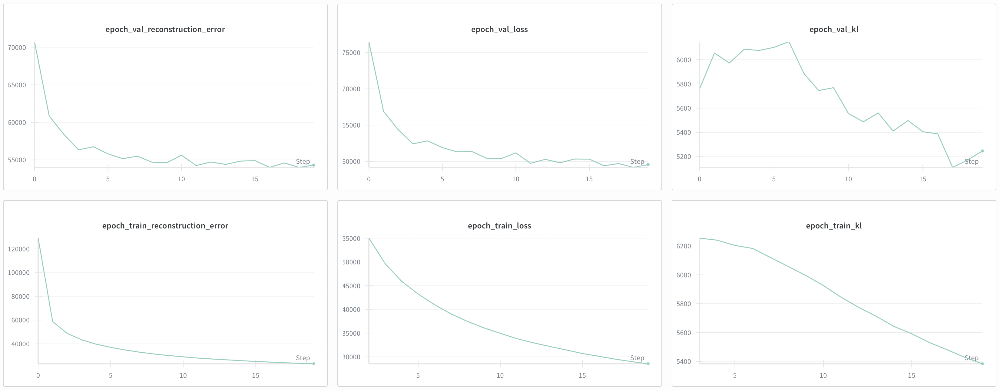

*Figure 1*

Even though the validation loss in Figure 1 approaches a plateau during the final epochs, it may still suggest some potential for further improvement with continued training. To assess the model's maximum performance, training was extended to $100$ epochs (Figure 2). However, the gains were minimal: over the final $80$ epochs, the validation loss decreased by only approximately $1,000$. Consequently, the experiments in this notebook use $20$ training epochs, as additional epochs yield only marginal improvements while incurring a substantial increase in computational cost.

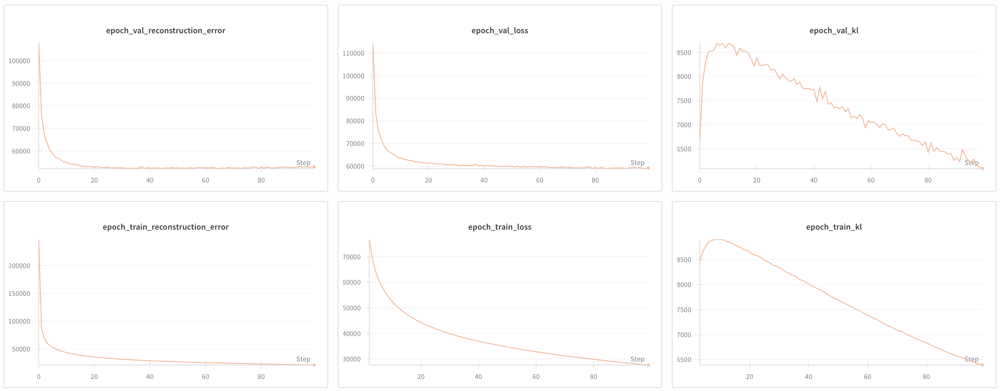

*Figure 2*

Figure 3 shows that when training is extended to 100 epochs, the optimization process also converges in terms of gradients. Specifically, gradients tend toward zero as parameter updates diminish and the model approaches a local minimum, indicating stable convergence.

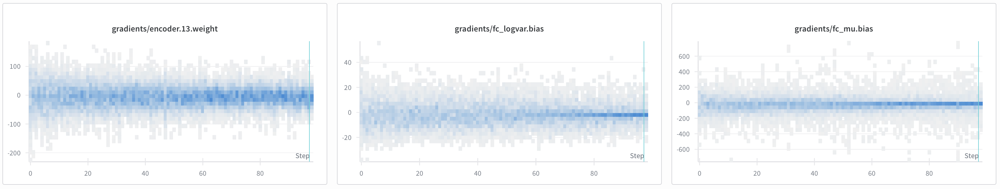

*Figure 3*

Finally, we assess convergence of the latent space. The first panel in Figure 4 shows a PCA projection of the learned latent representations onto the first two principal components, i.e., the vectors associated with the largest eigenvalues and therefore explaining the greatest proportion of variance. The resulting scatter plot closely resembles a two-dimensional Gaussian distribution, as expected under the assumed prior, suggesting that the latent space has the desired structure. The explained-variance plot further indicates that the majority of variance is captured by the first 40 principal components. Finally, the correlation matrix shows minimal correlation between latent dimensions, consistent with the assumption of a normal prior with identity covariance, and provides additional evidence that the latent space is well-formed.

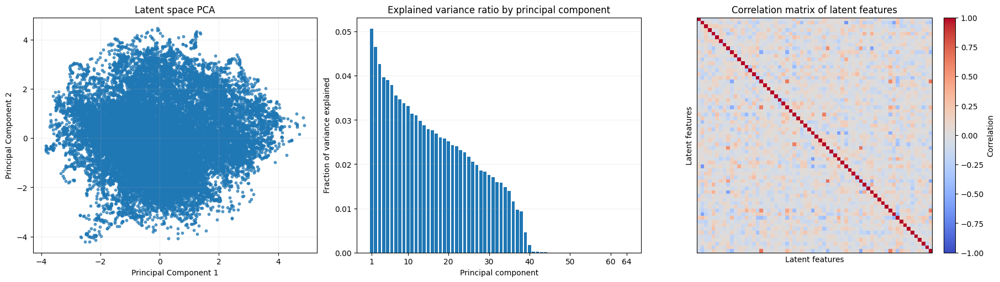

*Figure 4*

#### Assessing reconstruction quality
The final component of the convergence assessment concerns reconstruction quality. Figure 5 compares original and reconstructed images from the training set for both the front and mount cameras. The model successfully reconstructs non-stationary objects in the front-camera views. Reconstructions from the mount camera are also qualitatively strong, albeit with slight blurring; given the substantial compression ratio (mapping $2 \times 224 \times 224$ pixels to a $64$-dimensional latent representation), this level of fidelity should be adequate.

Figure 6 presents reconstructions from the validation set. For the front camera, non-stationary objects are captured less reliably than in the training examples, whereas stationary objects are reconstructed with comparable quality. Mount-camera reconstructions exhibit increased blur relative to the training set, but object contours remain discernible. Overall, these results suggest that the learned latent representations generalize and converge meaningfully.

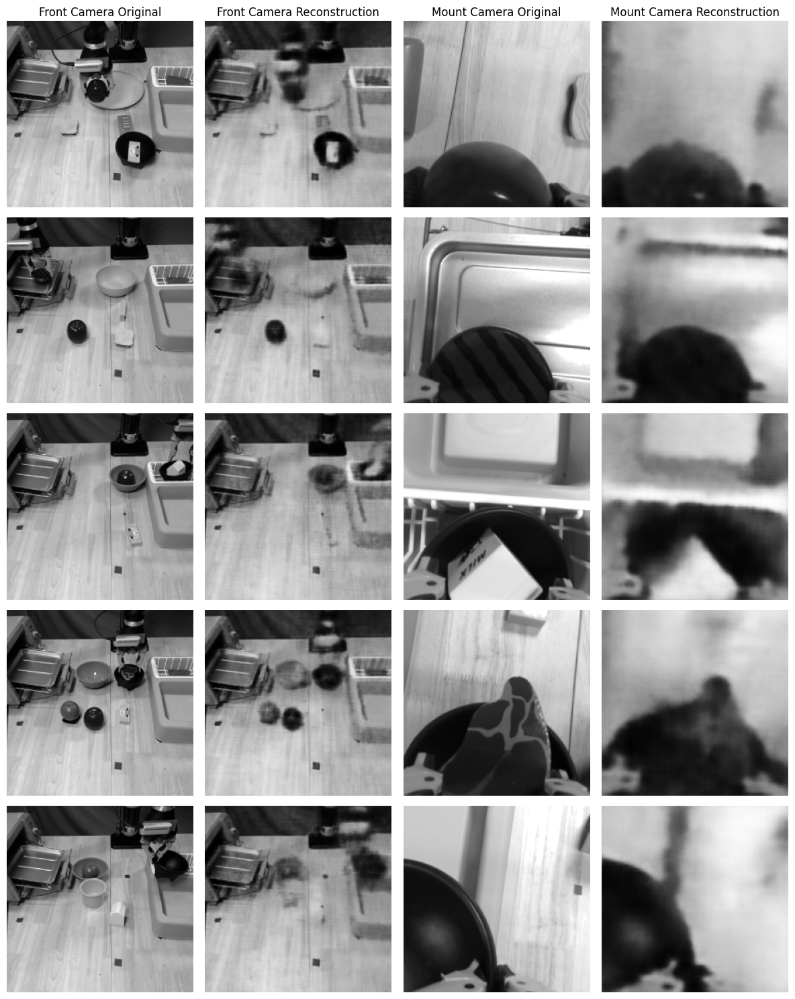

*Figure 5*

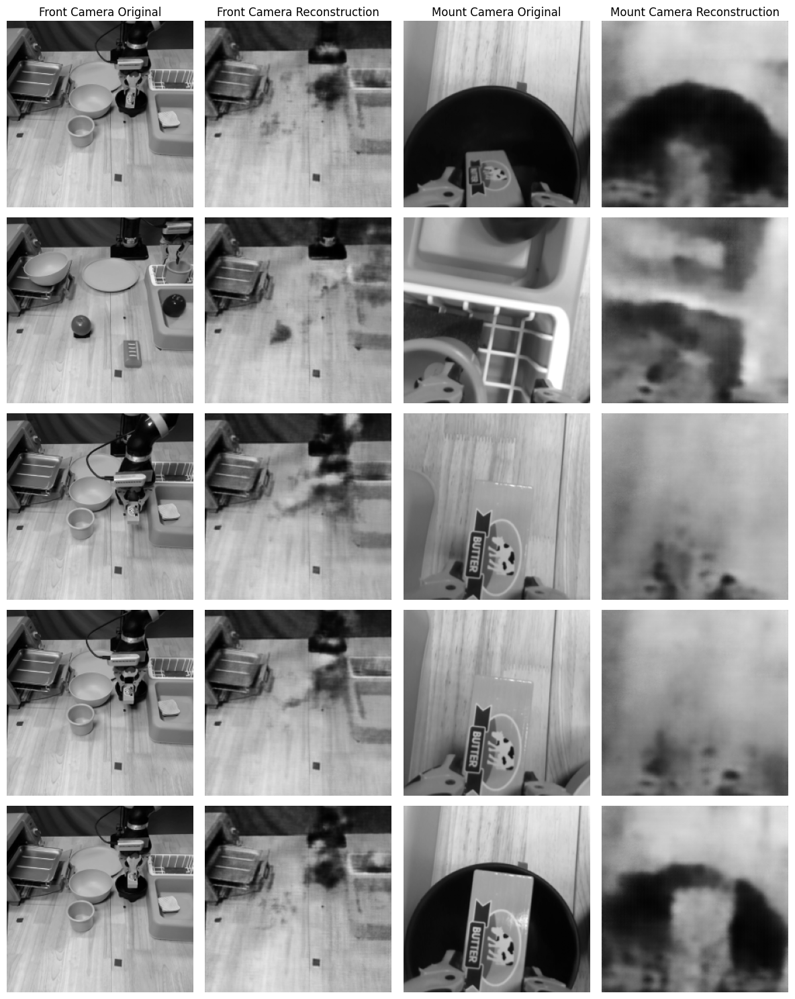

*Figure 6*

In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA


def plot_vae_latent_pca_and_corr(
    model,
    dataloader,
    device=None,
    max_samples=None,
    use="mu",
    seed=0,
    point_size=10.0,
    alpha=0.7,
    cmap="coolwarm",
):
    if device is None:
        try:
            device = next(model.parameters()).device
        except StopIteration:
            device = torch.device("cpu")
    device = torch.device(device)

    if use not in {"mu", "z"}:
        raise ValueError("use must be 'mu' or 'z'")

    if seed is not None and use == "z":
        torch.manual_seed(seed)
        np.random.seed(seed)

    model_was_training = model.training
    model.eval()

    latents_list = []
    n_seen = 0

    with torch.no_grad():
        for batch in dataloader:
            x = batch.input["images"].to(device, non_blocking=True)

            _, mu, logvar = model(x)

            if use == "mu":
                z = mu
            else:
                std = torch.exp(0.5 * logvar)
                eps = torch.randn_like(std)
                z = mu + eps * std

            z = z.detach().float().cpu().numpy()
            latents_list.append(z)
            n_seen += z.shape[0]

            if max_samples is not None and n_seen >= int(max_samples):
                break

    if model_was_training:
        model.train()

    latents = np.concatenate(latents_list, axis=0)
    if max_samples is not None and latents.shape[0] > int(max_samples):
        latents = latents[: int(max_samples)]

    if latents.ndim != 2:
        raise ValueError(f"Expected latents of shape (N, D); got {latents.shape}")
    N, D = latents.shape
    if N < 2:
        raise ValueError("Need at least 2 samples to compute PCA/correlation.")

    # PCA
    pca = PCA(n_components=min(D, max(2, D)))
    pca_scores = pca.fit_transform(latents)
    pca_2d = pca_scores[:, :2]
    evr = pca.explained_variance_ratio_

    # Correlation matrix across latent dimensions
    corr = np.corrcoef(latents, rowvar=False)
    corr = np.nan_to_num(corr, nan=0.0, posinf=0.0, neginf=0.0)

    # Plotting
    fig, axes = plt.subplots(1, 3, figsize=(18, 5), constrained_layout=True)

    # 2D PCA scatter
    ax = axes[0]
    ax.scatter(pca_2d[:, 0], pca_2d[:, 1], s=point_size, alpha=alpha)
    ax.set_title(f"Latent space PCA")
    ax.set_xlabel(f"Principal Component 1")
    ax.set_ylabel(f"Principal Component 2")
    ax.grid(True, alpha=0.2)

    # Explained variance ratio
    ax = axes[1]
    k = min(128, D)  # limit number of principal components for readability
    xs = np.arange(1, k + 1)
    ax.bar(xs, evr[:k])
    ax.set_title("Explained variance ratio by principal component")
    ax.set_xlabel("Principal component")
    ax.set_ylabel("Fraction of variance explained")

    # Ticks at 10, 20, 30, ... (also include 1 and k)
    tick_positions = list(range(10, k + 1, 10))
    tick_positions = [1] + tick_positions
    if tick_positions[-1] != k:
        tick_positions.append(k)

    ax.set_xticks(tick_positions)
    ax.set_xticklabels([str(t) for t in tick_positions])

    ax.grid(True, axis="y", alpha=0.2)

    if D > k:
        ax.text(
            0.99, 0.95, f"Showing first {k} of {D} PCs",
            transform=ax.transAxes, ha="right", va="top", fontsize=9, alpha=0.8
        )

    # Correlation heatmap
    ax = axes[2]
    im = ax.imshow(corr, vmin=-1, vmax=1, cmap=cmap, interpolation="nearest")
    ax.set_title("Correlation matrix of latent features")
    ax.set_xlabel("Latent features")
    ax.set_ylabel("Latent features")
    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label("Correlation")

    if D > 32:
        ax.set_xticks([])
        ax.set_yticks([])

    info = {
        "latents": latents,
        "pca_2d": pca_2d,
        "explained_variance_ratio": evr,
        "corr": corr,
        "pca_model": pca,
    }
    return fig, axes, info


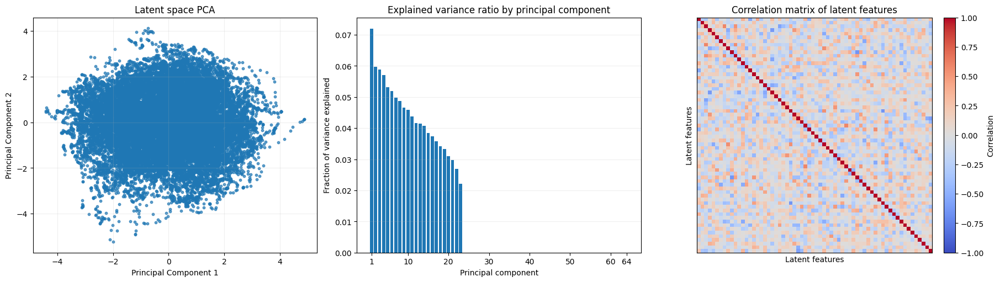

In [ ]:
fig, axes, info = plot_vae_latent_pca_and_corr(trained_vae, train_loader, device=device)
plt.show()

---
### $\color{Red}{Question\ 2.c}$ Latent space analysis (6 marks)

##### Task
- Using reasonable analysis, conclude whether the representation learnt by the self-supervised method will be beneficial for the downstream supervised task. **Empirical evidence** should be provided **however**, references to the performance of the self-superised method with a supervised head on the downstream task will be awarded __0 marks__.

$\color{red}{Response:}$ (Maximum 600 words in text)

To evaluate whether the unsupervised VAE learns a useful representation, we analyse reconstruction quality, KL behaviour, and—via PCA, t-SNE, and latent traversals—the structure of the latent space with respect to task-relevant robot state variables.

In [ ]:
#Extracting latent vectors
import torch
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

def get_latent_vectors_and_features(model, loader, device="cuda"):
    """
    Extract latent vectors (mu) for all validation samples
    + gripper state (last 2 joints) and object position (EE position first 3 dims)
    """
    model.eval()
    zs = []
    grippers = []
    obj_positions = []

    with torch.no_grad():
        for batch in loader:
            x = batch.input['images'].to(device)
            mu, _ = model.encode(x)
            zs.append(mu.cpu())

            obs_tensor = batch.input['obs'].cpu()

            # Gripper state = last 2 elements
            grippers.append(obs_tensor[:, -2:])

            # Object / EE position = first 3 elements
            obj_positions.append(obs_tensor[:, 0:3])

    zs = torch.cat(zs, dim=0).numpy()
    grippers = torch.cat(grippers, dim=0).numpy()
    obj_positions = torch.cat(obj_positions, dim=0).numpy()

    return zs, grippers, obj_positions


latent_vectors, gripper_states, obj_positions = get_latent_vectors_and_features(
    trained_vae, val_loader, device="cuda"
)

tsne = TSNE(n_components=2, perplexity=30,random_state=42)
latent_2d = tsne.fit_transform(latent_vectors)

**1. Convergence and Utilisation of Latent Space**

Training curves show that reconstruction loss decreases and stabilises, while KL divergence converges to a non-zero value, confirming that the VAE has not collapsed into a deterministic autoencoder and is actively using the latent space. Reconstructions are visually faithful to the inputs, indicating that image information is effectively captured.

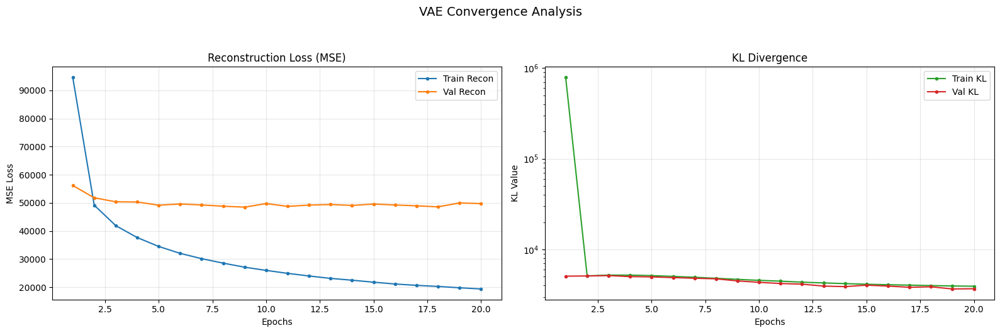

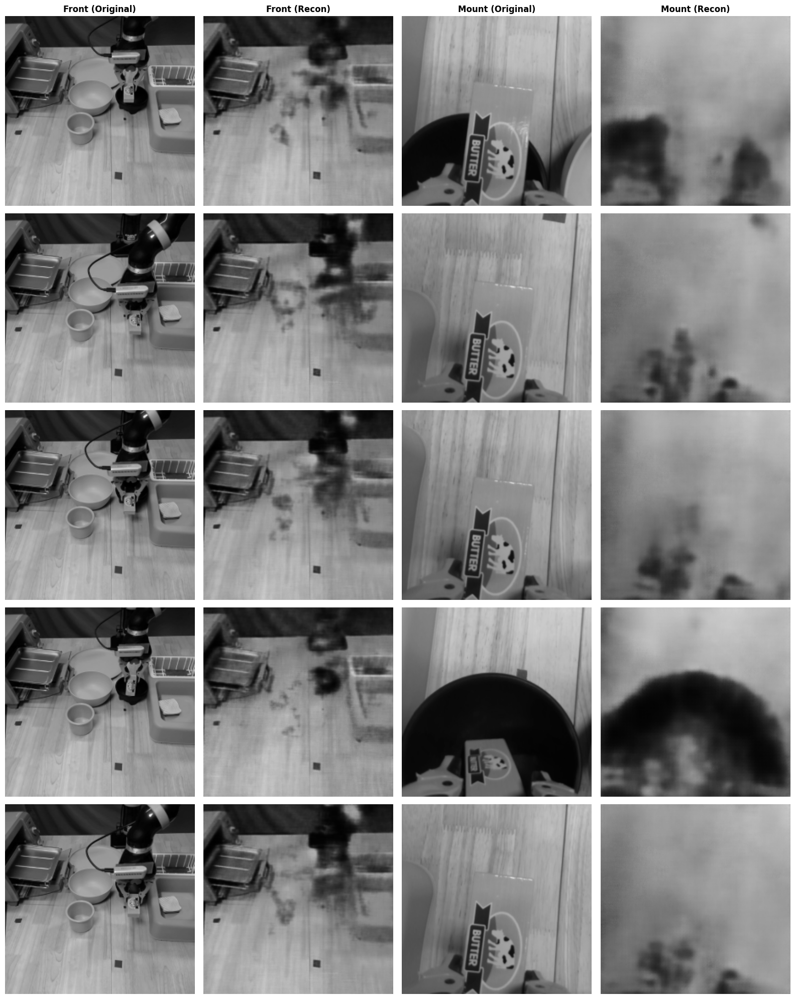

In [ ]:
import matplotlib.pyplot as plt
import torch
import numpy as np

def plot_convergence_metrics(history):
    """
    Plots the specific VAE metrics: Reconstruction Loss and KL Divergence
    separately to analyze convergence behavior.
    """
    epochs = range(1, len(history['train_loss']) + 1)

    fig, axs = plt.subplots(1, 2, figsize=(16, 5))

    # recon loss plot
    axs[0].plot(epochs, history['train_recon'], label='Train Recon', marker='.', color='tab:blue')
    axs[0].plot(epochs, history['val_recon'], label='Val Recon', marker='.', color='tab:orange')
    axs[0].set_title("Reconstruction Loss (MSE)")
    axs[0].set_xlabel("Epochs")
    axs[0].set_ylabel("MSE Loss")
    axs[0].grid(True, alpha=0.3)
    axs[0].legend()

    # KL divergence plot
    axs[1].plot(epochs, history['train_kl'], label='Train KL', marker='.', color='tab:green')
    axs[1].plot(epochs, history['val_kl'], label='Val KL', marker='.', color='tab:red')
    axs[1].set_title("KL Divergence")
    axs[1].set_xlabel("Epochs")
    axs[1].set_ylabel("KL Value")
    axs[1].grid(True, alpha=0.3)
    axs[1].set_yscale('log')
    axs[1].legend()

    plt.suptitle("VAE Convergence Analysis", fontsize=14, y=1.05)
    plt.tight_layout()
    plt.show()

def show_vae_reconstructions_v2(model, loader, device="cuda", n=4, seed=42):
    """
    Plots n random samples:
    [Front Orig | Front Recon | Mount Orig | Mount Recon]
    """
    model.eval()
    model.to(device)

    def _extract_two_channel_images(batch):
        if hasattr(batch, "input") and "images" in batch.input:
            imgs = batch.input["images"]
            return imgs
        raise ValueError("Batch structure not recognized.")

    batch = next(iter(loader))
    x_full = _extract_two_channel_images(batch).to(device).float()

    with torch.no_grad():
        recon_full, _, _ = model(x_full)

    recon_full = recon_full.clamp(0.0, 1.0)
    x_full = x_full.clamp(0.0, 1.0)

    B = x_full.size(0)
    n = min(n, B)

    g = torch.Generator(device=x_full.device)
    g.manual_seed(seed)
    idx = torch.randperm(B, generator=g, device=x_full.device)[:n]

    x = x_full[idx].detach().cpu()
    recon = recon_full[idx].detach().cpu()

    fig, axs = plt.subplots(nrows=n, ncols=4, figsize=(16, 4 * n))

    cols = ["Front (Original)", "Front (Recon)", "Mount (Original)", "Mount (Recon)"]

    for i in range(n):
        imgs_row = [x[i, 0], recon[i, 0], x[i, 1], recon[i, 1]]

        for j in range(4):
            ax = axs[i][j] if n > 1 else axs[j]
            ax.imshow(imgs_row[j], cmap="gray", vmin=0, vmax=1)
            ax.axis("off")

            if i == 0:
                ax.set_title(cols[j], fontsize=12, fontweight='bold')

    plt.tight_layout()
    plt.show()

plot_convergence_metrics(history)

show_vae_reconstructions_v2(trained_vae, val_loader, device=device, n=5)


**2. Latent Structure and Linearity (PCA and t-SNE Analysis)**

We performed PCA on deterministic latent means ($\mu$) rather than stochastic samples (z, above) to reveal the underlying latent manifold. PCA is linear, so alignment of physical state variables along principal components indicates approximate linear encoding, which is desirable for downstream networks.

Explained Variance by top 2 components: 18.1%


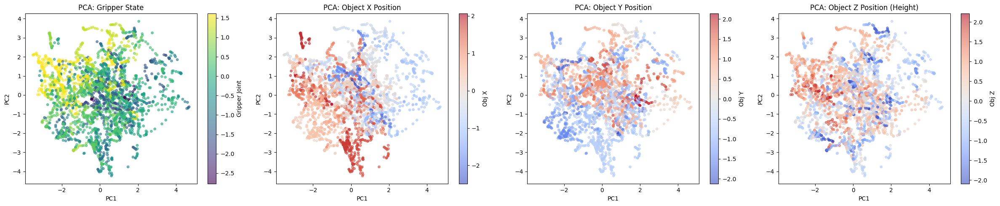

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
z_pca = pca.fit_transform(latent_vectors)

variance_ratio = np.sum(pca.explained_variance_ratio_)
print(f"Explained Variance by top 2 components: {variance_ratio:.1%}")

fig, axs = plt.subplots(1, 4, figsize=(24, 5))

# gripper
sc1 = axs[0].scatter(z_pca[:, 0], z_pca[:, 1], c=gripper_states[:, 0], cmap='viridis', s=15, alpha=0.6)
axs[0].set_title("PCA: Gripper State")
axs[0].set_xlabel("PC1")
axs[0].set_ylabel("PC2")
plt.colorbar(sc1, ax=axs[0], label="Gripper Joint")

# object X
sc2 = axs[1].scatter(z_pca[:, 0], z_pca[:, 1], c=obj_positions[:, 0], cmap='coolwarm', s=15, alpha=0.6)
axs[1].set_title("PCA: Object X Position")
axs[1].set_xlabel("PC1")
axs[1].set_ylabel("PC2")
plt.colorbar(sc2, ax=axs[1], label="Obj X")

# object Y
sc3 = axs[2].scatter(z_pca[:, 0], z_pca[:, 1], c=obj_positions[:, 1], cmap='coolwarm', s=15, alpha=0.6)
axs[2].set_title("PCA: Object Y Position")
axs[2].set_xlabel("PC1")
axs[2].set_ylabel("PC2")
plt.colorbar(sc3, ax=axs[2], label="Obj Y")

# object Z
sc4 = axs[3].scatter(z_pca[:, 0], z_pca[:, 1], c=obj_positions[:, 2], cmap='coolwarm', s=15, alpha=0.6)
axs[3].set_title("PCA: Object Z Position (Height)")
axs[3].set_xlabel("PC1")
axs[3].set_ylabel("PC2")
plt.colorbar(sc4, ax=axs[3], label="Obj Z")

plt.tight_layout()
plt.show()

In [ ]:
from scipy.stats import pearsonr

corr_x_pc1, _ = pearsonr(obj_positions[:,0], z_pca[:,0])
corr_y_pc2, _ = pearsonr(obj_positions[:,1], z_pca[:,1])
print(f"PC1 vs Object X correlation: {corr_x_pc1:.2f}")
print(f"PC2 vs Object Y correlation: {corr_y_pc2:.2f}")


PC1 vs Object X correlation: -0.38
PC2 vs Object Y correlation: 0.27


The first two principal components explain 18.1% of variance, indicating that the representation is high-dimensional rather than trivially compressible. However, meaningful structure is still observed: projections reveal elongated “strings” of points, likely corresponding to temporal sequences of robot motion. Empirically, PC1 shows a moderate correlation with object X (ρ ≈ −0.38), while PC2 shows a weaker correlation with object Y (ρ ≈ 0.27), demonstrating that some physical state information is linearly accessible, though not cleanly disentangled. This organisation is most evident for the object’s X-position (with some separation by X position (red and blue) observed, although not in distinct clusters), while gripper and Y/Z coordinates show weaker structure in this projection, suggesting they are encoded across higher dimensions or nonlinearly.

Gradual colour changes along the strings suggest that the latent manifold preserves temporal coherence: small physical movements map to predictable latent changes, supporting control within observed trajectories. t-SNE visualizations (below) reinforce this, showing that the strings correspond to temporally coherent sequences, with gripper and object variables smoothly varying along the strings. Temporal colouring confirms that consecutive frames map to nearby latent points.

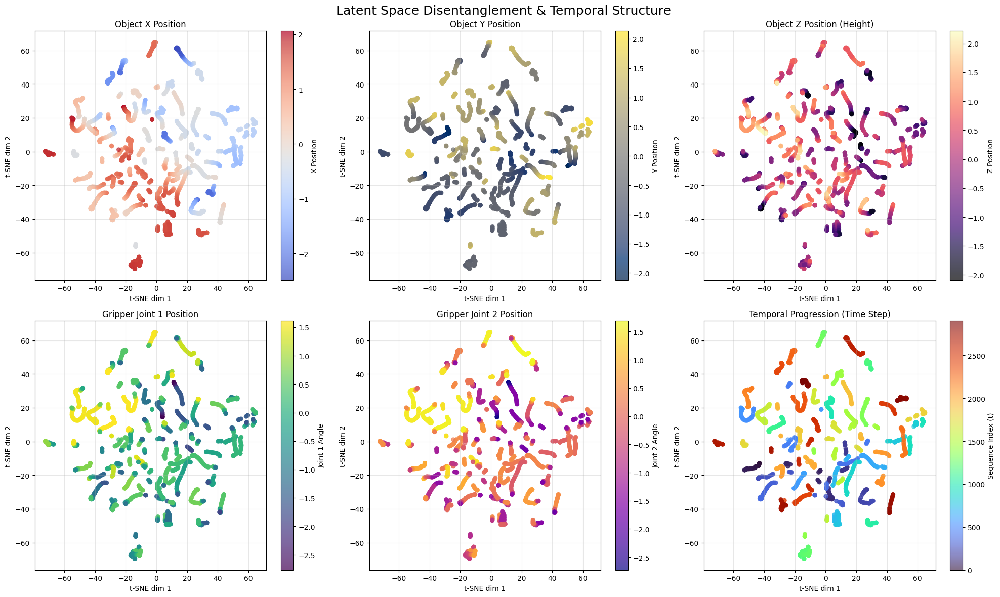

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

fig, axs = plt.subplots(2, 3, figsize=(20, 12))
axs = axs.flatten()

sc1 = axs[0].scatter(
    latent_2d[:,0], latent_2d[:,1],
    c=obj_positions[:,0], cmap="coolwarm", s=30, alpha=0.7
)
axs[0].set_title("Object X Position")
fig.colorbar(sc1, ax=axs[0], label="X Position")

sc2 = axs[1].scatter(
    latent_2d[:,0], latent_2d[:,1],
    c=obj_positions[:,1], cmap="cividis", s=30, alpha=0.7
)
axs[1].set_title("Object Y Position")
fig.colorbar(sc2, ax=axs[1], label="Y Position")

sc3 = axs[2].scatter(
    latent_2d[:,0], latent_2d[:,1],
    c=obj_positions[:,2], cmap="magma", s=30, alpha=0.7
)
axs[2].set_title("Object Z Position (Height)")
fig.colorbar(sc3, ax=axs[2], label="Z Position")

sc4 = axs[3].scatter(
    latent_2d[:,0], latent_2d[:,1],
    c=gripper_states[:,0], cmap="viridis", s=30, alpha=0.7
)
axs[3].set_title("Gripper Joint 1 Position")
fig.colorbar(sc4, ax=axs[3], label="Joint 1 Angle")

sc5 = axs[4].scatter(
    latent_2d[:,0], latent_2d[:,1],
    c=gripper_states[:,1], cmap="plasma", s=30, alpha=0.7
)
axs[4].set_title("Gripper Joint 2 Position")
fig.colorbar(sc5, ax=axs[4], label="Joint 2 Angle")

sequence_indices = np.arange(len(latent_2d))
sc6 = axs[5].scatter(
    latent_2d[:,0], latent_2d[:,1],
    c=sequence_indices, cmap="turbo", s=30, alpha=0.6
)
axs[5].set_title("Temporal Progression (Time Step)")
fig.colorbar(sc6, ax=axs[5], label="Sequence Index (t)")

for ax in axs:
    ax.set_xlabel("t-SNE dim 1")
    ax.set_ylabel("t-SNE dim 2")
    ax.grid(True, alpha=0.3)

plt.suptitle("Latent Space Disentanglement & Temporal Structure", fontsize=18, y=0.98)
plt.tight_layout()
plt.show()

**3. Investigating Latent Manifold Continuity and Density (Latent Traversal Analysis)**

To assess global latent structure, we decoded linear interpolations between distant points. Endpoint reconstructions match the ground truth closely, confirming effective encoding of static observations. However, intermediate frames exhibit fading, indicating that the latent manifold is sparse between distant sequences (as expected from the curved string-like structure). Linear paths traverse low-probability regions, producing blended, non-physical poses. This demonstrates a limitation in that while local continuity is preserved, global Euclidean operations cannot guarantee valid transitions outside observed regions.

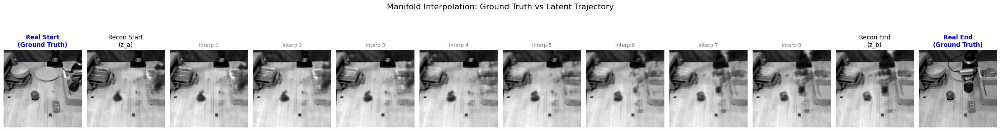

In [ ]:
import torch
import matplotlib.pyplot as plt

idx_a = 100
idx_b = 150
steps = 10

def get_original_image(loader, target_idx):
    current_count = 0
    for batch in loader:
        imgs = batch.input['images']
        batch_size = imgs.shape[0]
        if current_count + batch_size > target_idx:
            local_idx = target_idx - current_count
            return imgs[local_idx]
        current_count += batch_size
    return None

real_img_a = get_original_image(val_loader, idx_a).cpu()
real_img_b = get_original_image(val_loader, idx_b).cpu()

z_a = torch.tensor(latent_vectors[idx_a]).to(device).unsqueeze(0)
z_b = torch.tensor(latent_vectors[idx_b]).to(device).unsqueeze(0)

alphas = torch.linspace(0, 1, steps).to(device).view(-1, 1)
z_interp = (1 - alphas) * z_a + alphas * z_b

trained_vae.eval()
with torch.no_grad():
    decoded_imgs = trained_vae.decode(z_interp).cpu()

total_plots = steps + 2
fig, axs = plt.subplots(1, total_plots, figsize=(28, 4))

axs[0].imshow(real_img_a[0], cmap='gray')
axs[0].set_title("Real Start\n(Ground Truth)", fontsize=12, color='blue', fontweight='bold')
axs[0].axis('off')

for i in range(steps):
    ax_idx = i + 1
    axs[ax_idx].imshow(decoded_imgs[i, 0], cmap='gray')
    axs[ax_idx].axis('off')

    if i == 0:
        axs[ax_idx].set_title("Recon Start\n(z_a)", fontsize=12)
    elif i == steps - 1:
        axs[ax_idx].set_title("Recon End\n(z_b)", fontsize=12)
    else:
        axs[ax_idx].set_title(f"Interp {i}", fontsize=10, color='gray')

axs[-1].imshow(real_img_b[0], cmap='gray')
axs[-1].set_title("Real End\n(Ground Truth)", fontsize=12, color='blue', fontweight='bold')
axs[-1].axis('off')

plt.suptitle(f"Manifold Interpolation: Ground Truth vs Latent Trajectory", fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

**Conclusions on utility of learned latent space for downstream task**

Overall, the VAE has learned a structured, task-relevant latent representation that is likely beneficial for downstream supervised control. PCA indicates that although variance is distributed across many dimensions, the latent space exhibits meaningful local structure, and elongated strings reflect temporal trajectories. Moderate correlations with Object X and weaker correlations with Object Y show partial linear accessibility of physical states, but disentanglement is limited.

t-SNE confirms that these strings correspond to temporally coherent sequences. Latent traversals reveal the fading in/ out effect, reflecting sparse manifold coverage: the VAE captures local continuity well, but cannot guarantee physically valid transitions for unseen combinations of states.

In summary, the latent space encodes task-relevant variables in structured, temporally coherent subspaces. Locally, it supports smooth control; globally, string-like topology and sparse coverage mean generalisation is limited. A downstream behavioural cloning network could extract useful control information efficiently within observed trajectories but may struggle outside these regions.

## $\color{Red}{Question\ 3}$ Full model training
This question requires you to first develop a supervised head which utilises the latent space from your self-supervised method. You are then required to assess the models performance as well as the model you developed in question 1.c.i on the test set, report the performance and conclude whether self-supervised learning is appropriate for this task.

### $\color{Red}{Question\ 3.a}$ Combining self-supervised model with the downstream task (5 marks)

##### Task
- Develop a model which combines the self-supervised pretraining with a model for performing the downstream task by freezing the self-supervised model and fine-tuning a head for prediction and implement it in the code block below. Markers should be able to retrain your model by running the cell below. You may however, reference previously defined objects (e.g., loaded data and use previously defined functions). The supervised head should at least include any inputs that you did not feed into the self-supervised model. For example, assume you decide to perform self-supervised learning only using front_cam_ob images. You must also include mount_cam_ob, ee_cartesian_pos_ob, ee_cartesian_vel_ob and joint_pos_ob observations in your model.

$\color{red}{Response:}$ (Maximum 200 words in text)

To integrate the self-supervised VAE with the downstream task, the pre-trained VAE encoder is frozen to preserve learned latent representations and prevent gradient interference. Input images pass through the frozen encoder to produce latent vectors z. Normalized proprioceptive inputs are concatenated with latent vectors to form a unified multi-modal feature vector.

Two separate MLP heads (for predicting 3D end-effector positions and gripper states separately) map this joint representation to task outputs,  with an initially tested joint head exhibiting inferior performance. Each head employs LeakyReLU activations, batch normalization, and 0.1 dropout to address issues in training stability, convergence speed, and overfitting; hidden layer widths (256–512–256 regression, 128–256–128 classification) were empirically tuned to balance under- and overfitting, with regression layers larger due to poorer initial validation performance.

Training optimizes a weighted, multi-task loss combining MSE for positions and cross-entropy for gripper states, using an Adam optimizer with decoupled weight decay; a MultiStepLR scheduler is used to reduce learning rate at predefined milestones to refine convergence. Choice of epoch balances minimal validation loss with validation RMSE, MAE and Macro-F1 performance (see after model).



Epoch 1/14:   0%|          | 0/398 [00:00<?, ?it/s]

Epoch [1/14] | Train Loss: 0.7047 | Val Loss: 0.3872 | Val RMSE: 0.1436 | Val MAE: 0.1047 | Val F1: 0.7122


Epoch 2/14:   0%|          | 0/398 [00:00<?, ?it/s]

Epoch [2/14] | Train Loss: 0.3632 | Val Loss: 0.3390 | Val RMSE: 0.0910 | Val MAE: 0.0686 | Val F1: 0.7136


Epoch 3/14:   0%|          | 0/398 [00:00<?, ?it/s]

Epoch [3/14] | Train Loss: 0.3091 | Val Loss: 0.3557 | Val RMSE: 0.0704 | Val MAE: 0.0558 | Val F1: 0.7173


Epoch 4/14:   0%|          | 0/398 [00:00<?, ?it/s]

Epoch [4/14] | Train Loss: 0.2758 | Val Loss: 0.3431 | Val RMSE: 0.0612 | Val MAE: 0.0479 | Val F1: 0.7134


Epoch 5/14:   0%|          | 0/398 [00:00<?, ?it/s]

Epoch [5/14] | Train Loss: 0.2518 | Val Loss: 0.3589 | Val RMSE: 0.0508 | Val MAE: 0.0387 | Val F1: 0.7194


Epoch 6/14:   0%|          | 0/398 [00:00<?, ?it/s]

Epoch [6/14] | Train Loss: 0.2125 | Val Loss: 0.3620 | Val RMSE: 0.0424 | Val MAE: 0.0303 | Val F1: 0.7151


Epoch 7/14:   0%|          | 0/398 [00:00<?, ?it/s]

Epoch [7/14] | Train Loss: 0.2038 | Val Loss: 0.3633 | Val RMSE: 0.0418 | Val MAE: 0.0306 | Val F1: 0.7200


Epoch 8/14:   0%|          | 0/398 [00:00<?, ?it/s]

Epoch [8/14] | Train Loss: 0.1979 | Val Loss: 0.3742 | Val RMSE: 0.0425 | Val MAE: 0.0312 | Val F1: 0.7023


Epoch 9/14:   0%|          | 0/398 [00:00<?, ?it/s]

Epoch [9/14] | Train Loss: 0.1929 | Val Loss: 0.3725 | Val RMSE: 0.0406 | Val MAE: 0.0291 | Val F1: 0.7135


Epoch 10/14:   0%|          | 0/398 [00:00<?, ?it/s]

Epoch [10/14] | Train Loss: 0.1954 | Val Loss: 0.3688 | Val RMSE: 0.0408 | Val MAE: 0.0291 | Val F1: 0.7127


Epoch 11/14:   0%|          | 0/398 [00:00<?, ?it/s]

Epoch [11/14] | Train Loss: 0.1881 | Val Loss: 0.3678 | Val RMSE: 0.0405 | Val MAE: 0.0290 | Val F1: 0.7143


Epoch 12/14:   0%|          | 0/398 [00:00<?, ?it/s]

Epoch [12/14] | Train Loss: 0.1926 | Val Loss: 0.3708 | Val RMSE: 0.0406 | Val MAE: 0.0293 | Val F1: 0.7089


Epoch 13/14:   0%|          | 0/398 [00:00<?, ?it/s]

Epoch [13/14] | Train Loss: 0.1889 | Val Loss: 0.3709 | Val RMSE: 0.0403 | Val MAE: 0.0287 | Val F1: 0.7164


Epoch 14/14:   0%|          | 0/398 [00:00<?, ?it/s]

Epoch [14/14] | Train Loss: 0.1896 | Val Loss: 0.3782 | Val RMSE: 0.0398 | Val MAE: 0.0288 | Val F1: 0.7097


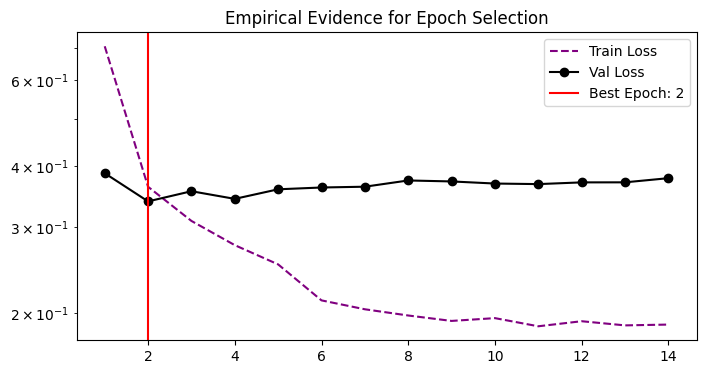

Total Training Time: 922.24s
Final Average Epoch Time: 65.87s
Final Average Iteration Time: 0.0283s


In [ ]:
import random
import numpy as np
import torch
import torch.nn as nn
from sklearn.metrics import mean_squared_error, mean_absolute_error, f1_score
from tqdm.auto import tqdm
import time

# Set seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

# Normalisation, computed once from training data
combined_obs = np.concatenate([
    train_nps["ee_cartesian_pos_ob"],
    train_nps["ee_cartesian_vel_ob"],
    train_nps["joint_pos_ob"]
], axis=1)

mean_obs = torch.from_numpy(combined_obs.mean(axis=0)).float().to(device)
std_obs = torch.from_numpy(combined_obs.std(axis=0)).float().to(device) + 1e-8

# Model definition
class VAESupervisedModel(BaseModel):
    """
    We use the following overall architecture:
    Image -> Frozen VAE Encoder -> Latent z
                                               -> Concatenate -> MLP Heads -> Predictions
    Proprioception -> Normalize -> Obs Feats
    """
    def __init__(self, vae_encoder, sup_head_pos, sup_head_grp):
        super().__init__()
        self.encoder = vae_encoder
        self.sup_head_pos = sup_head_pos
        self.sup_head_grp = sup_head_grp

        # Freezing the VAE encoder parameters
        self.encoder.eval()
        for p in self.encoder.parameters():
            p.requires_grad = False

    def forward(self, images, obs):
        with torch.no_grad():
            mu, logvar = self.encoder.encode(images)
            z = self.encoder.reparameterize(mu, logvar)

        obs_norm = (obs - mean_obs) / std_obs

        features = torch.cat([z, obs_norm], dim=1)

        pos_pred = self.sup_head_pos(features)
        grp_pred = self.sup_head_grp(features)

        return {"pos": pos_pred, "grp": grp_pred}

# defining MLP heads
sup_head_pos = MLP(
    input_dim=64 + 15, # 64 (Latent z) + 15 (Obs)
    hidden_dims=[256, 512, 256],
    output_dim=3,
    actvton=nn.LeakyReLU(),
    fnl_act=nn.Identity(),
    batch_norms=[True, True, False],
    dropouts=[0.1, 0.1, 0.0]
)

sup_head_grp = MLP(
    input_dim=64 + 15,
    hidden_dims=[128, 256, 128],
    output_dim=3,
    actvton=nn.LeakyReLU(),
    fnl_act=nn.Identity(),
    batch_norms=[True, True, True],
    dropouts=[0.1, 0.1, 0.1]
)

model_q3 = VAESupervisedModel(
    vae_encoder=trained_vae, #from q2
    sup_head_pos=sup_head_pos,
    sup_head_grp=sup_head_grp
).to(device)

exp_kwargs_q3 = {
    "batch_size": 64,
    "learning_rate": 1e-3,
    "weight_decay": 1e-4,
    "epochs": 14,
    "milestones": [5, 8],
    "gamma": 0.1
}

optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model_q3.parameters()),
    lr=exp_kwargs_q3["learning_rate"],
    weight_decay=exp_kwargs_q3["weight_decay"]
)

scheduler = torch.optim.lr_scheduler.MultiStepLR(
    optimizer,
    milestones=exp_kwargs_q3["milestones"],
    gamma=exp_kwargs_q3["gamma"]
)

__criterion_q3 = TrackerBalancedLoss(
    loss_lkp={"pos": pos_criterion, "grp": grp_criterion}
)

all_epoch_durations_q3 = []
all_iteration_times_q3 = []

train_losses, val_losses = [], []

for epoch in range(exp_kwargs_q3["epochs"]):
    epoch_start = time.time()
    model_q3.train()
    running_loss = 0.0

    train_pbar = tqdm(train_dataloader, desc=f"Epoch {epoch+1}/{exp_kwargs_q3['epochs']}", leave=False)

    for batch in train_pbar:
        iter_start = time.time()
        images = batch.input["images"].to(device).float()
        obs = batch.input["obs"].to(device).float()

        targets = {
            "pos": batch.output["pos"].to(device).float(),
            "grp": batch.output["grp"].argmax(dim=1).long().to(device)
        }

        optimizer.zero_grad()
        preds = model_q3(images, obs)
        loss = __criterion_q3(preds, targets)

        if not torch.isnan(loss):
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            train_pbar.set_postfix(loss=f"{loss.item():.4f}")

        all_iteration_times_q3.append(time.time() - iter_start)

    avg_train_loss = running_loss / len(train_dataloader)
    train_losses.append(avg_train_loss)

    model_q3.eval()
    val_running_loss = 0.0
    val_preds_pos, val_targets_pos = [], []
    val_preds_grp, val_targets_grp = [], []

    with torch.no_grad():
        for batch in val_dataloader:
            images = batch.input["images"].to(device).float()
            obs = batch.input["obs"].to(device).float()

            targets = {
                "pos": batch.output["pos"].to(device).float(),
                "grp": batch.output["grp"].argmax(dim=1).long().to(device)
            }

            preds = model_q3(images, obs)
            val_running_loss += __criterion_q3(preds, targets).item()

            val_preds_pos.append(preds["pos"].cpu().numpy())
            val_targets_pos.append(targets["pos"].cpu().numpy())
            val_preds_grp.append(torch.argmax(preds["grp"], dim=1).cpu().numpy())
            val_targets_grp.append(targets["grp"].cpu().numpy())

    avg_val_loss = val_running_loss / len(val_dataloader)
    val_losses.append(avg_val_loss)

    all_epoch_durations_q3.append(time.time() - epoch_start) # RECORD EPOCH TIME
    avg_epoch_all = np.mean(all_epoch_durations_q3)
    avg_iter_all = np.mean(all_iteration_times_q3)

    all_pred_pos = np.concatenate(val_preds_pos, axis=0)
    all_true_pos = np.concatenate(val_targets_pos, axis=0)
    all_pred_grp = np.concatenate(val_preds_grp, axis=0)
    all_true_grp = np.concatenate(val_targets_grp, axis=0)

    val_rmse = np.sqrt(mean_squared_error(all_true_pos, all_pred_pos))
    val_mae = mean_absolute_error(all_true_pos, all_pred_pos)
    val_f1 = f1_score(all_true_grp, all_pred_grp, average='macro')

    print(f"Epoch [{epoch+1}/{exp_kwargs_q3['epochs']}] "
          f"| Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f} "
          f"| Val RMSE: {val_rmse:.4f} | Val MAE: {val_mae:.4f} | Val F1: {val_f1:.4f}")

    if scheduler:
        scheduler.step()

plotMetrics(train_losses, val_losses)
print(f"Total Training Time: {np.sum(all_epoch_durations_q3):.2f}s")
print(f"Final Average Epoch Time: {np.mean(all_epoch_durations_q3):.2f}s")
print(f"Final Average Iteration Time: {np.mean(all_iteration_times_q3):.4f}s")

Due to limited Colab GPU access, epoch choice decisions were made based on the debugging dataset. The evidence for this is provided below: while Epoch 7 minimises validation loss, Epoch 14 is selected as a more practical choice due to its superior F1 and MAE. However, this is arguably no longer appropriate for the full dataset, for which validation loss slightly rises from epoch 2 onwards, leading to overfitting. Here, for effective generalisation, epoch 2 should have been chosen. This is a limitation of the current work; without compute constraints, two runs on the full dataset would have been performed to first establish the optimal epoch based and then run training.

| Epoch | Train Loss | Val Loss | Val RMSE | Val MAE | Val F1 |
|-------|------------|----------|----------|---------|--------|
| 7 / 22  | 0.6332     | 0.5888   | 0.1501   | 0.1120  | 0.3038 |
| 14 / 22 | 0.6035     | 0.5901   | 0.1307   | 0.0984  | 0.5042 |


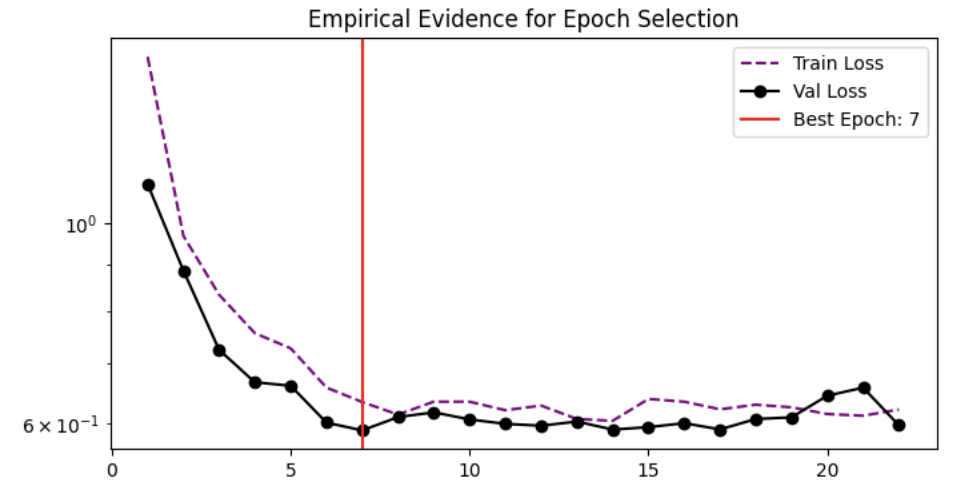

Figure 1. Evidence for epoch selection based on debugging dataset.

---
### $\color{Red}{Question\ 3.b}$ Assessing the suitability of self-supervised learning
For the final two questions, you are required to assess the performance of the self-supervised + supervised head model and the end-to-end model that you have trained. Additionally, you are required to holistically evaluate whether self-supervised learning has been beneficial for this task.

#### $\color{Red}{Question\ 3.b.i}$ Assessing the suitability of self-supervised learning (4 marks)

##### Task
- In the code block below, evaluate the performance of the model you trained in question 3.a and the model you trained in question 1.c.i, using the test set. Additionally use the same metrics to train and evaluate the model that you used for question 1.c.i. Markers should be able to run the cell such that both models are run on the appropriate dataset. You may however, reference previously defined objects (e.g., loaded data and use previously defined functions).

$\color{red}{Response:}$ (Maximum 200 words in text)

Both models were evaluated on the held-out test set using MAE and Macro-F1 (used in 1.c.i). Additional metrics - RMSE, mean angle error, and gripper state classification (per-class precision, recall, and F1) - allowed granular comparison.

The Q3 model outperforms the End-to-End model on every metric. The starkest differences lie in mean angle error (16.07°/21.31°) and in classification of the "Open" gripper (0.6049/0.4287), driven largely by poorer recall by the End-to-End model (0.5778/0.3751). The former indicates that self-supervised pre-training may be beneficial for capturing directional motion structure as well as effectively condensing task-relevant visual gripper features. Pre-training in this manner also appears to improve positional accuracy (MAE: 0.0292/0.0384) and results in a narrower positional error distribution(RMSE: 0.0414/0.0550).

For gripper action classification, both models performed best on the dominant "no movement" class, while struggling with the rarer closed/open actions, indicating class imbalance as a limiting factor independent of representation learning strategy. The VAE-based model achieved higher Macro-F1 (0.7459/0.6725), driven primarily by improved recall on the open class.

Overall, self-supervised pretraining appears beneficial for capturing position, gripper action, and directional motion structure.


**Test Set Metrics for End-to-End Model**

| Metric            | Value |
|------------------|-------|
| **MAE (meters)**      | **0.0384** |
| RMSE (meters)     | 0.0550 |
| Mean Angle Error (°) | 21.31 |


| Gripper State        | Precision | Recall | F1-score |
|---------------------|-----------|--------|----------|
| Closed (0)           | 0.5988    | 0.6617 | 0.6287   |
| No movement (1)      | 0.9496    | 0.9710 | 0.9602  |
| Open (2)             | 0.5000    | 0.3751 | 0.4287   |
| **Macro Average**    | **0.6828** | **0.6693** | **0.6725** |

**Test Set Metrics for Frozen Self-Supervised VAE + Supervised Head (Q3)**

| Metric            | Value |
|------------------|-------|
| **MAE (meters)**      | **0.0292** |
| RMSE (meters)     | 0.0414 |
| Mean Angle Error (°) | 16.07 |


| Gripper State        | Precision | Recall | F1-score |
|---------------------|-----------|--------|----------|
| Closed (0)           | 0.6653    | 0.6660 | 0.6656   |
| No movement (1)      | 0.9603    | 0.9741 | 0.9671   |
| Open (2)             | 0.6347    | 0.5778 | 0.6049   |
| **Macro Average**    | **0.7534** | **0.7393** | **0.7459** |

Table 1. Test Set Metrics for End-to-End and Q3 models.


In [ ]:
from sklearn.metrics import f1_score, mean_squared_error, accuracy_score

In [ ]:
import os

load_keys = [
    "front_cam_ob",
    "mount_cam_ob",
    "ee_cartesian_pos_ob",
    "ee_cartesian_vel_ob",
    "joint_pos_ob",
    "actions",
    "terminals"
]

input_vars = ["front_cam_ob", "mount_cam_ob", "ee_cartesian_pos_ob", "ee_cartesian_vel_ob", "joint_pos_ob"]
target_vars = ["actions"]

file_pattern = r".*\.h5"
test_data_path = "/content/drive/My Drive/comp0188_2425/cw2/test"

test_nps = load_all_files(test_data_path, file_pattern, load_keys)

test_dataset = NpDictDataset(
    array_dict=test_nps,
    dep_vars=target_vars,
    indep_vars=input_vars,
    transform_lkp=global_transforms,
    target_offset=0
)

test_loader = DataLoader(
    test_dataset,
    batch_size=64,
    shuffle=False,
    collate_fn=collate_func
)

print(f"Check: Test loader has {len(test_dataset)} samples.")

100%|██████████| 5/5 [00:37<00:00,  7.46s/it]


Check: Test loader has 7352 samples.


Evaluating Test Set:   0%|          | 0/115 [00:00<?, ?it/s]

MAE (Position):      0.029247 meters
RMSE (Position):      0.041378 meters
Mean Angle Error:     16.07°
Gripper Class        | Precision  | Recall     | F1        
Closed (0)           | 0.6653     | 0.6660   | 0.6656
No movement (1)      | 0.9603     | 0.9741   | 0.9671
Open (2)             | 0.6347     | 0.5778   | 0.6049
Macro Averages         | 0.7534     | 0.7393   | 0.7459


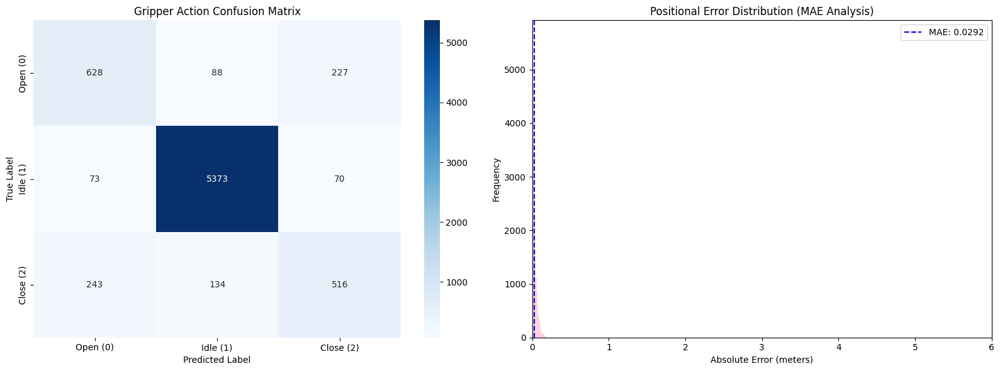

In [ ]:
#Test set evaluation on Q3 model
import torch
import numpy as np
from sklearn.metrics import mean_squared_error, precision_recall_fscore_support
from torch.nn.functional import cosine_similarity
from tqdm.auto import tqdm

model_q3.eval()
model_q3.to(device)

all_true_pos, all_pred_pos = [], []
all_true_grp, all_pred_grp = [], []

test_pbar = tqdm(test_loader, desc="Evaluating Test Set", leave=False)

with torch.no_grad():
    for batch in test_pbar:
        images = batch.input["images"].to(device).float()
        obs = batch.input["obs"].to(device).float()

        outputs = model_q3(images, obs)

        all_true_pos.append(batch.output["pos"].numpy())
        all_pred_pos.append(outputs['pos'].cpu().numpy())
        all_true_grp.append(batch.output["grp"].argmax(dim=1).cpu().numpy())
        all_pred_grp.append(torch.argmax(outputs['grp'], dim=1).cpu().numpy())

true_pos = np.concatenate(all_true_pos)
pred_pos = np.concatenate(all_pred_pos)
true_grp = np.concatenate(all_true_grp)
pred_grp = np.concatenate(all_pred_grp)

rmse_pos = np.sqrt(mean_squared_error(true_pos, pred_pos))
mae_pos = mean_absolute_error(true_pos, pred_pos)

true_pos_t = torch.from_numpy(true_pos).float()
pred_pos_t = torch.from_numpy(pred_pos).float()

true_norm = torch.norm(true_pos_t, dim=1)
pred_norm = torch.norm(pred_pos_t, dim=1)
mask = (true_norm > 1e-7) & (pred_norm > 1e-7)

if mask.any():
    cos_sim = cosine_similarity(true_pos_t[mask], pred_pos_t[mask], dim=1)
    cos_sim = torch.clamp(cos_sim, -1.0, 1.0)
    angle_errors = torch.acos(cos_sim) * (180.0 / np.pi)
    mean_angle_error = angle_errors.mean().item()
else:
    mean_angle_error = 0.0

precision, recall, f1, _ = precision_recall_fscore_support(
    true_grp, pred_grp, labels=[0, 1, 2], average=None
)

macro_precision = np.mean(precision)
macro_recall = np.mean(recall)
macro_f1 = np.mean(f1)

print(f"MAE (Position):      {mae_pos:.6f} meters")
print(f"RMSE (Position):      {rmse_pos:.6f} meters")
print(f"Mean Angle Error:     {mean_angle_error:.2f}°")
print(f"{'Gripper Class':<20} | {'Precision':<10} | {'Recall':<10} | {'F1':<10}")
print(f"{'Closed (0)':<20} | {precision[0]:.4f}     | {recall[0]:.4f}   | {f1[0]:.4f}")
print(f"{'No movement (1)':<20} | {precision[1]:.4f}     | {recall[1]:.4f}   | {f1[1]:.4f}")
print(f"{'Open (2)':<20} | {precision[2]:.4f}     | {recall[2]:.4f}   | {f1[2]:.4f}")
print(f"Macro Averages         | {macro_precision:.4f}     | {macro_recall:.4f}   | {macro_f1:.4f}")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

cm = confusion_matrix(true_grp, pred_grp, labels=[0, 1, 2])
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Open (0)', 'Idle (1)', 'Close (2)'],
            yticklabels=['Open (0)', 'Idle (1)', 'Close (2)'],
            ax=axes[0])
axes[0].set_title('Gripper Action Confusion Matrix')
axes[0].set_xlabel('Predicted Label')
axes[0].set_ylabel('True Label')

errors = np.abs(true_pos - pred_pos).flatten()
axes[1].hist(errors, bins=50, color='pink', alpha=0.7)
axes[1].axvline(mae_pos, color='blue', linestyle='--', label=f'MAE: {mae_pos:.4f}')
axes[1].set_title('Positional Error Distribution (MAE Analysis)')
axes[1].set_xlabel('Absolute Error (meters)')
axes[1].set_ylabel('Frequency')
axes[1].set_xlim(0, 6)
axes[1].legend()

plt.tight_layout()
plt.show()

Evaluating Test Set:   0%|          | 0/115 [00:00<?, ?it/s]

MAE (Position):      0.038447 meters
RMSE (Position):      0.054983 meters
Mean Angle Error:     21.31°
Gripper Class        | Precision  | Recall     | F1        
Closed (0)           | 0.5988     | 0.6617   | 0.6287
No movement (1)      | 0.9496     | 0.9710   | 0.9602
Open (2)             | 0.5000     | 0.3751   | 0.4287
Macro Averages         | 0.6828     | 0.6693   | 0.6725


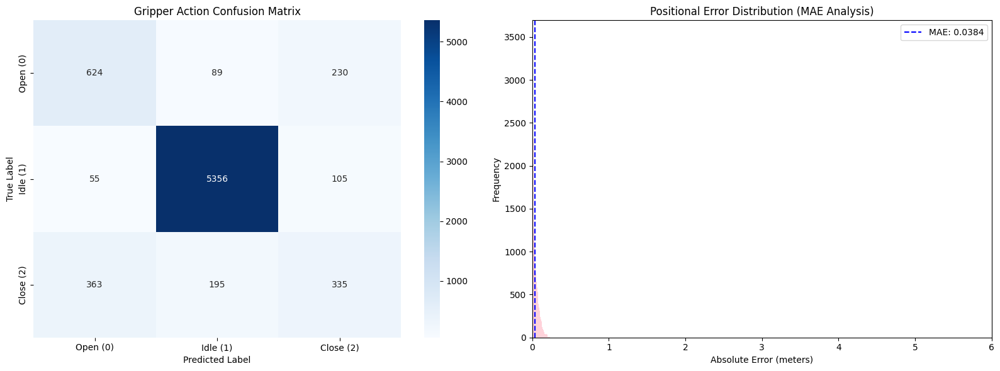

In [ ]:
#Test set evaluation on Q1 model
import numpy as np
from sklearn.metrics import mean_squared_error, precision_recall_fscore_support
from torch.nn.functional import cosine_similarity
from tqdm.auto import tqdm

final.eval()
final.to(device)

all_true_pos, all_pred_pos = [], []
all_true_grp, all_pred_grp = [], []

test_pbar = tqdm(test_loader, desc="Evaluating Test Set", leave=False)

with torch.no_grad():
    for batch in test_pbar:
        images = batch.input["images"].to(device).float()
        obs = batch.input["obs"].to(device).float()

        outputs = final(images, obs)

        all_true_pos.append(batch.output["pos"].numpy())
        all_pred_pos.append(outputs['pos'].cpu().numpy())
        all_true_grp.append(batch.output["grp"].argmax(dim=1).cpu().numpy())
        all_pred_grp.append(torch.argmax(outputs['grp'], dim=1).cpu().numpy())

true_pos = np.concatenate(all_true_pos)
pred_pos = np.concatenate(all_pred_pos)
true_grp = np.concatenate(all_true_grp)
pred_grp = np.concatenate(all_pred_grp)

rmse_pos = np.sqrt(mean_squared_error(true_pos, pred_pos))
mae_pos = mean_absolute_error(true_pos, pred_pos)

true_pos_t = torch.from_numpy(true_pos).float()
pred_pos_t = torch.from_numpy(pred_pos).float()

true_norm = torch.norm(true_pos_t, dim=1)
pred_norm = torch.norm(pred_pos_t, dim=1)
mask = (true_norm > 1e-7) & (pred_norm > 1e-7)

if mask.any():
    cos_sim = cosine_similarity(true_pos_t[mask], pred_pos_t[mask], dim=1)
    cos_sim = torch.clamp(cos_sim, -1.0, 1.0)
    angle_errors = torch.acos(cos_sim) * (180.0 / np.pi)
    mean_angle_error = angle_errors.mean().item()
else:
    mean_angle_error = 0.0

precision, recall, f1, _ = precision_recall_fscore_support(
    true_grp, pred_grp, labels=[0, 1, 2], average=None
)

macro_precision = np.mean(precision)
macro_recall = np.mean(recall)
macro_f1 = np.mean(f1)

print(f"MAE (Position):      {mae_pos:.6f} meters")
print(f"RMSE (Position):      {rmse_pos:.6f} meters")
print(f"Mean Angle Error:     {mean_angle_error:.2f}°")
print(f"{'Gripper Class':<20} | {'Precision':<10} | {'Recall':<10} | {'F1':<10}")
print(f"{'Closed (0)':<20} | {precision[0]:.4f}     | {recall[0]:.4f}   | {f1[0]:.4f}")
print(f"{'No movement (1)':<20} | {precision[1]:.4f}     | {recall[1]:.4f}   | {f1[1]:.4f}")
print(f"{'Open (2)':<20} | {precision[2]:.4f}     | {recall[2]:.4f}   | {f1[2]:.4f}")
print(f"Macro Averages         | {macro_precision:.4f}     | {macro_recall:.4f}   | {macro_f1:.4f}")

# --- Plotting Results ---
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Gripper Confusion Matrix
cm = confusion_matrix(true_grp, pred_grp, labels=[0, 1, 2])
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Open (0)', 'Idle (1)', 'Close (2)'],
            yticklabels=['Open (0)', 'Idle (1)', 'Close (2)'],
            ax=axes[0])
axes[0].set_title('Gripper Action Confusion Matrix')
axes[0].set_xlabel('Predicted Label')
axes[0].set_ylabel('True Label')

# Plot 2: Positional Error Distribution
# We flatten the absolute differences to show the distribution across all x, y, z errors
errors = np.abs(true_pos - pred_pos).flatten()
axes[1].hist(errors, bins=50, color='pink', alpha=0.7)
axes[1].axvline(mae_pos, color='blue', linestyle='--', label=f'MAE: {mae_pos:.4f}')
axes[1].set_title('Positional Error Distribution (MAE Analysis)')
axes[1].set_xlabel('Absolute Error (meters)')
axes[1].set_ylabel('Frequency')
axes[1].set_xlim(0, 6)
axes[1].legend()

plt.tight_layout()
plt.show()

---
#### $\color{Red}{Question\ 3.b.ii}$ Justification (5 marks)

##### Task
- Conclude whether the self-supervised pre-training was beneficial for the task of predicting actions. Your answer should not solely focus on final performance but rather be nuianced and balance other model development considerations for example parameter count and speed of convergence. Also, if you believe the comparison between the model trained in question 3.a.i aganst the model trained in question 2.c.i is not _fair_, discuss further experiments which you would perform to reduce the bias in your conclusions. Provide __empirical evidence__ to support your conclusions. __0 marks__ will be awarded if empirical evidence is __not__ provided.

**1. Analysis of Performance on Test Set**




**Test Set Metrics for End-to-End Model**

| Metric            | Value |
|------------------|-------|
| **MAE (meters)**      | **0.0384** |
| RMSE (meters)     | 0.0550 |
| Mean Angle Error (°) | 21.31 |


| Gripper State        | Precision | Recall | F1-score |
|---------------------|-----------|--------|----------|
| Closed (0)           | 0.5988    | 0.6617 | 0.6287   |
| No movement (1)      | 0.9496    | 0.9710 | 0.9602  |
| Open (2)             | 0.5000    | 0.3751 | 0.4287   |
| **Macro Average**    | **0.6828** | **0.6693** | **0.6725** |

**Test Set Metrics for Frozen Self-Supervised VAE + Supervised Head (Q3)**

| Metric            | Value |
|------------------|-------|
| **MAE (meters)**      | **0.0292** |
| RMSE (meters)     | 0.0414 |
| Mean Angle Error (°) | 16.07 |


| Gripper State        | Precision | Recall | F1-score |
|---------------------|-----------|--------|----------|
| Closed (0)           | 0.6653    | 0.6660 | 0.6656   |
| No movement (1)      | 0.9603    | 0.9741 | 0.9671   |
| Open (2)             | 0.6347    | 0.5778 | 0.6049   |
| **Macro Average**    | **0.7534** | **0.7393** | **0.7459** |

Table 1. Test Set Metrics for End-to-End and Q3 models.


**2. Convergence Analysis**

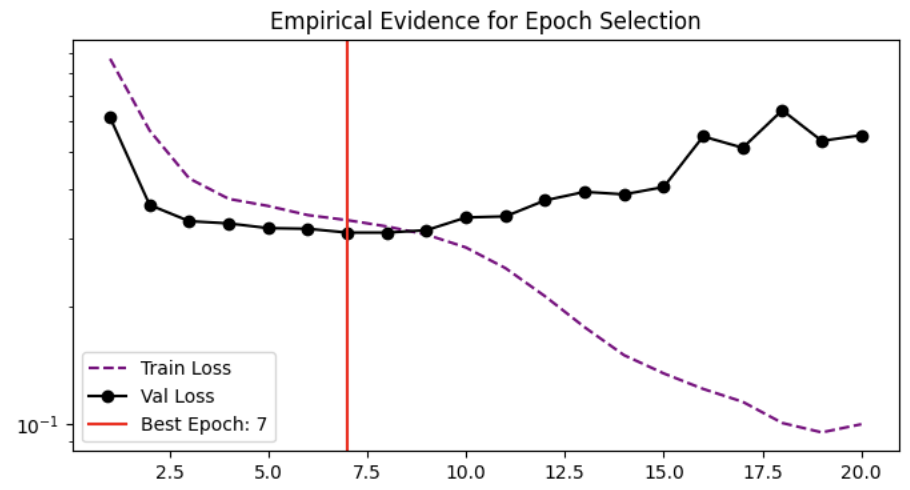

Figure 1. A plot of loss against epoch for the End-to-End model.

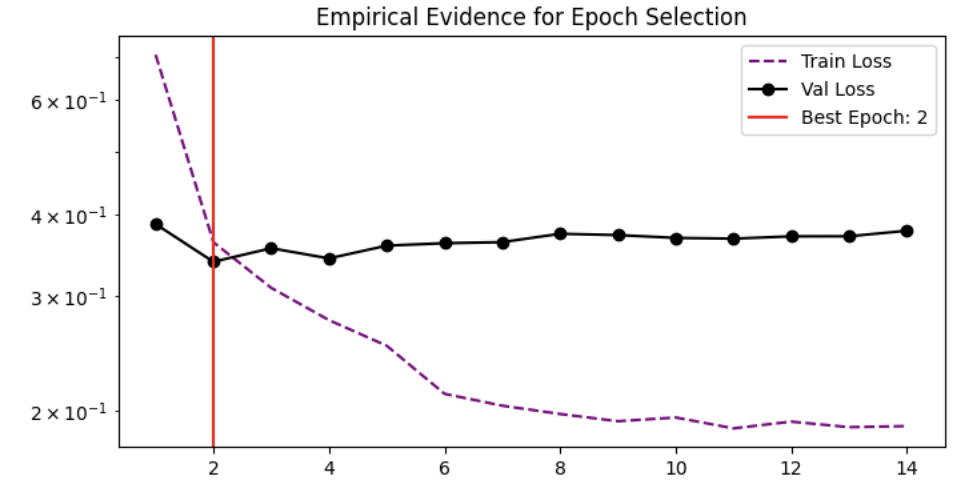

Figure 2. A plot of Loss against Epoch for the Q3 model.

**3. Training Time Analysis**

| Model        | Average Epoch Time (s)
|-------------|-----------------|
| End-to-End   | 76.14         |
| VAE          | 82.35          |
| Q3 model     | 65.87         |

Table 2. Comparison of model training times.


**4. Number of Parameters**

| Model        | Total Parameters | Trainable Params | Frozen Params | % Trainable |
|-------------|----------------|----------------|---------------|-------------|
| End-to-End   | 3,233,440     | 3,233,440      | 0             | 100.00%     |
| Q3 model     | 15,757,816     | 363,270        | 15,394,546    | 2.31%       |


Table 3. Comparison of total and trainable parameters between the End-to-End and Q3 models.

$\color{red}{Response:}$ (Maximum 600 words in text)

Self-supervised pre-training provides clear benefits in both final predictive performance and computational efficiency for this robotic action-prediction task.

Empirically, as noted above and seen in Table 1, the pre-trained VAE-based model yields superior positional accuracy, directional understanding, and gripper action classification. Significant improvements are observed in MAE and RMSE (23.9% and 24.8%, respectively), Mean Angle Error (24.6% reduction), and in "Open" gripper state classification (41.1% improvement), the latter suggesting that self-supervised pre-training captures task-relevant visual features effectively, allowing the supervised head to focus on action-relevant signals rather than learning perception from scratch. Both models exhibit significant overfitting, although this begins earlier for the VAE-based model.

Despite this improved performance, the suitability of self-supervised pre-training is highly context-dependent. The end-to-end model converges rapidly (approx. 7 epochs, 76.14s per epoch) and requires training of 3.2 million parameters (Figure 2, Tables 2 and 3). While the Q3 model only trains 363,270, reflected in shorter training times (65.87s) and sees rapid convergence of validation loss (approx. 2 epochs), this does not account for the full pipeline, which includes pre-training of 15.4 million additional parameters over at 20 epochs for convergence (Figure 3) with an average epoch duration of 82.35s. (Table 3). Further, the End-to-End model exhibits superior performance using the smaller debugging training set (see Appendix, Table 1). As such, in resource- and data-constrained environments the benefits of a self-supervised approach may be tempered by the additional pre-training cost.

However, I would argue that the comparison is not entirely unbiased. The VAE is trained without any action information and therefore relied on a reconstruction-based objective, which forces the model to allocate its latent capacity to represent all pixels in the frame to minimise MSE, including task-irrelevant background elements. In contrast, as it is supervised, the end-to-end model essentially performs spatial attention and can therefore discard background noise to focus on features that minimise action-prediction loss.

To reduce bias and more reliably conclude on the utility of self-supervision, one could:
- Perform partial encoder fine-tuning during supervised training, to allow the model to adapt its general visual features to specific task-relevant control objectives
- Replacing pixel reconstruction with a forward dynamics task (i.e. predicting the next latent state from the current one) to force the encoder to prioritise movement over static background. This may prime the VAE better for action prediction while keeping it self-supervised.

In conclusion, under the current setup, self-supervised pre-training demonstrates clear benefits. The Q3 model achieves superior positional accuracy, lower mean angle error, and higher Macro-F1 for gripper actions compared to the fully supervised End-to-End model. It also drastically reduces the number of trainable parameters and stabilises convergence. Therefore, self-supervised pre-training is advantageous when high efficiency, faster convergence, and improved action representation are priorities, while the End-to-End approach may still be preferred in contexts with limited pre-training resources or very small datasets.

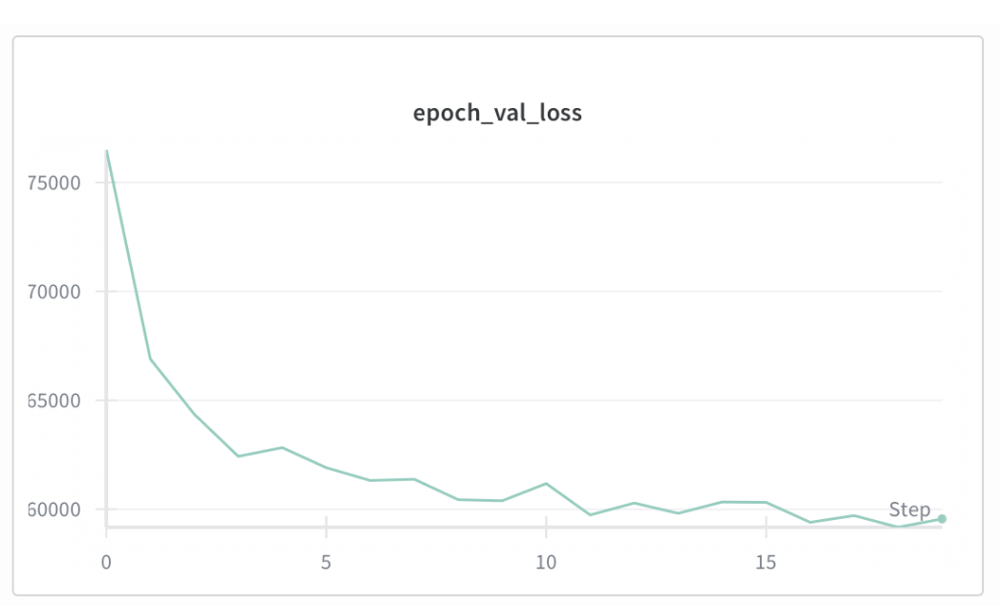

Figure 3. A plot of validation loss against epoch for VAE pre-training.

In [ ]:
#The majority of data for this question (e.g. training time, convergence, and test set performance) was obtained through integration
#into above code (to avoid rerunning models). The only standalone calculation performed here is calculation of
#number of parameters (below).
# ******* INSERT YOUR CODE HERE *******

def report_model_params(model, model_name):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    frozen_params = total_params - trainable_params

    print(f"Total Parameters:    {total_params:,}")
    print(f"Trainable Params:    {trainable_params:,}")
    print(f"Frozen Params:       {frozen_params:,}")
    print(f"Percentage Trainable: {(trainable_params/total_params)*100:.2f}%")

report_model_params(model_q3, "VAE + Supervised Heads (Q3)")
report_model_params(final, "End-to-End CNN (Final)")

# ******* INSERT YOUR CODE HERE - END *******

Total Parameters:    15,757,816
Trainable Params:    363,270
Frozen Params:       15,394,546
Percentage Trainable: 2.31%
Total Parameters:    3,233,440
Trainable Params:    3,233,440
Frozen Params:       0
Percentage Trainable: 100.00%


#Appendix

**Table 1. Test Set Metrics for Smaller (Debugging) Dataset**
**Test Set Metrics for End-to-End Model**

| Metric            | Value |
|------------------|-------|
| **MAE (meters)**      | **0.0807** |
| RMSE (meters)     | 0.1130 |
| Mean Angle Error (°) | 91.23 |


| Gripper State        | Precision | Recall | F1-score |
|---------------------|-----------|--------|----------|
| Closed (0)           | 0.1444    | 0.1315 | 0.1376   |
| No movement (1)      | 0.8201    | 0.7587 | 0.7882   |
| Open (2)             | 0.3302    | 0.5140 | 0.4021   |
| **Macro Average**    | **0.4316** | **0.4681** | **0.4426** |

**Test Set Metrics for Frozen Self-Supervised VAE + Supervised Head (Q3)**

| Metric            | Value |
|------------------|-------|
| **MAE (meters)**      | **0.1081** |
| RMSE (meters)     | 0.1638 |
| Mean Angle Error (°) | 66.12 |


| Gripper State        | Precision | Recall | F1-score |
|---------------------|-----------|--------|----------|
| Closed (0)           | 0.0000    | 0.0000 | 0.0000   |
| No movement (1)      | 0.7756    | 0.9641 | 0.8596   |
| Open (2)             | 0.4680    | 0.2296 | 0.3080   |
| **Macro Average**    | **0.4145** | **0.3979** | **0.3892** |



# - End of Coursework -